# Imports and I/O

In [1]:
# Imports
import sys
import numpy as np
import pandas as pd
import json
import random
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

from sklearn.experimental import enable_hist_gradient_boosting
from sklearn import base, neural_network, neighbors, feature_extraction, datasets, linear_model, metrics, model_selection, preprocessing, svm, ensemble, decomposition, feature_extraction, utils
import time


# Configs
%config InlineBackend.figure_format ='retina'
%matplotlib inline

# Cython
%load_ext Cython
#!python
#cython: language_level=3

print("All libraries set-up and ready to go!")

All libraries set-up and ready to go!


In [2]:
suffix = ''
k = pd.read_csv('../../pads/keystrokes' + suffix + '.csv', index_col=False, encoding='latin1')
w = pd.read_csv('../../pads/words' + suffix + '.csv', index_col=False)
s = pd.read_csv('../../pads/sentences' + suffix + '.csv', index_col=False)
f = pd.read_csv('../../pads/files' + suffix + '.csv', index_col=False)
u = pd.read_csv('../../pads/users' + suffix + '.csv', index_col=False)

# Helpers

## Iterator helper for computation

In [ ]:
def find_mean(u_id):
    return u.at[int(u_id), 't_mean_95']
def find_std(u_id):
    return u.at[int(u_id), 't_std_95']

k['adj_t'] = (k['t'] - k['u_id'].apply(find_mean)) / k['u_id'].apply(find_std)

In [20]:
# Runs in approx. 50s
k_sorted = k.sort_values(by='s_id')
rs = 0; re = 0; ranges = {}
for idx, val in k_sorted['s_id'].value_counts().sort_index().iteritems():
    re += val
    ranges[idx] = (rs, re)
    rs += val
    
for s_id, row in s.iterrows():
    if ranges.get(s_id) != None:
        t, v = ranges.get(s_id)
        k_sentence = k_sorted.iloc[t:v, :]
    else:
        k_sentence = k_sorted.iloc[0:0, :]
    
    ###### YOUR CODE HERE #####
    ## Will run ranging over sentence with s_id, row, k_sentence ##
    ## Example: s.at[s_id, 'ks_len'] = len(k_sentence) / len(row['text'])
    

KeyboardInterrupt: 

In [ ]:
for u_id, row in u.iterrows():
    k_user = k[k['u_id'] == u_id]
    s_user = s[s['u_id'] == u_id]
    u.loc[u_id, 'k_count'] = len(k_user)
    pct = k_user['t'].quantile(0.95)

    u.loc[u_id, 't_mean'] = k_user['t'].mean()
    u.loc[u_id, 't_std'] = k_user['t'].std()
    
    u.loc[u_id, 't_mean_10000'] = k_user['t'].apply(lambda x: min(x, 10000)).mean()
    u.loc[u_id, 't_std_10000'] = k_user['t'].apply(lambda x: min(x, 10000)).std()
    u.loc[u_id, 't_mean_95'] = k_user['t'].apply(lambda x: min(x, pct)).mean()
    u.loc[u_id, 't_std_95'] = k_user['t'].apply(lambda x: min(x, pct)).std()
    
    pct = s_user['text_len'].quantile(0.95)
    u.loc[u_id, 'text_len_mean'] = s_user['text_len'].apply(lambda x: min(x, pct)).mean()
    u.loc[u_id, 'text_len_std'] = s_user['text_len'].apply(lambda x: min(x, pct)).std()
    
    pct = s_user['del/len'].quantile(0.95)
    u.loc[u_id, 'del/len_mean'] = s_user['del/len'].apply(lambda x: min(x, pct)).mean()
    u.loc[u_id, 'del/len_std'] = s_user['del/len'].apply(lambda x: min(x, pct)).std()

    u.loc[u_id, 'revision_t/len_filter_10000_mean'] = s_user['revision_t_filter_10000'].sum() / s_user['text_len'].sum()
    u.loc[u_id, 'separator_t/t_filter_10000_mean'] = s_user['separator_t/t_filter_10000'].mean()
    u.loc[u_id, 'word_t/t_filter_10000_mean'] = s_user['word_t/t_filter_10000'].mean()

    u.loc[u_id, 't/word_filter_10000_mean'] = s_user['t_filter_10000'].sum() / s_user['word_count'].sum()
    for l in ['510', '1000', '2000', '5000', '10000']:
        u.loc[u_id, 'p_'+l+'_no/len'] = s_user['p_'+l+'_no'].sum() / s_user['text_len'].sum()

In [ ]:
for f_id, row in f.iterrows():
    tx = ''
    for s_id, st in s[s['f_id'] == f_id].iterrows():
        #print (len(tx), st['start_pos'])
        if len(tx) < st['start_pos']:
            tx += (' ' * (st['start_pos'] - len(tx)))
        tx += st['text'].replace('\n',' ')
    
    f.at[f_id, 'text'] = tx

In [ ]:
for w_id, row in w.iterrows():
    if ranges.get(w_id) != None:
        t, v = ranges.get(w_id)
        k_word = k_sorted.iloc[t:v, :]
    else:
        k_word = k_sorted.iloc[0:0, :]
    
    w.at[w_id, 'text_len'] = len(str(row['text']))
    w.at[w_id, 'k_count'] = len(k_word)
    w.at[w_id, 't'] = k_word['t'].sum()
    w.at[w_id, 't/len'] = k_word['t'].sum() / w.at[w_id, 'text_len']
    w.at[w_id, 't/len_filter_2000'] = k_word['t'].apply(lambda x: min(x, 2000)).sum() / w.at[w_id, 'text_len']
    w.at[w_id, 't/len_filter_10000'] = k_word['t'].apply(lambda x: min(x, 10000)).sum() / w.at[w_id, 'text_len']
    w.at[w_id, 'max_p'] = k_word['t'].max()
    w.at[w_id, 'n_revisions'] = len(k_word[k_word['op'] == '-'])

## Normalizer (for Kolmogorov deflate)

In [ ]:
s['text_len'].max()

In [ ]:
ms = [('KolmogorovDeflate_value', 'n_Kolmogorov'),
      ('Syntactic.KolmogorovDeflate_value', 'n_SKolmogorow'),
      ('Morphological.KolmogorovDeflate_value', 'n_MKolmogorow'),
      ('Lexical.Diversity.NDW_value', 'n_NDW_value'),
      ('Lexical.Diversity.RTTR_value', 'n_RTTR_value')]

In [ ]:
binsz = 5
rgs, rge = 0, 1215

for old_n, new_n in ms:

    avgKolmogorov = [0] * int((rge - rgs) / binsz)
    avgStd = [0] * int((rge - rgs) / binsz)

    for i in range(0, int((rge - rgs) / binsz)):
        b_idx = (s['text_len'] >= rgs + i * binsz) & (s['text_len'] < rgs + (i + 1) * binsz)
        avgKolmogorov[i] = float(s[b_idx][old_n].mean())
        avgStd[i] = float(s[b_idx][old_n].std())
    
    for idx, row in s.iterrows():
        try:
            s.at[idx, new_n] = (row[old_n] - avgKolmogorov[int((row['text_len'] - rgs) / binsz)]) / avgStd[int((row['text_len'] - rgs) / binsz)]
        except ZeroDivisionError:
            s.at[idx, new_n] = 0


In [ ]:
useful = ['Syntactic.ClausesPerSentence_value',
          'Syntactic.VerbPhrasesPerSentence_value',
          'Syntactic.ComplexNominalsPerSentence_value',
          'NounPhrasePreModificationWords_value',
          'NounPhrasePostModificationWords_value',
          'Lexical.Sophistication.ANC_value',
          'Lexical.Sophistication.BNC_value',
          'Lexical.Density_value'] + \
         [s for f, s in ms]

### Printing some sentences with high and low deflate

In [ ]:
print(high_k.at[7, 'text'])
print(high_k.at[247, 'text'])
print(high_k.at[668, 'text'])
print(high_k.at[95088, 'text'])
print(high_k.at[94887, 'text'])

In [ ]:
print(low_k.at[127, 'text'])
print(low_k.at[245, 'text'])
print(low_k.at[254, 'text'])
print(low_k.at[457, 'text'])
print(low_k.at[94661, 'text'])

In [ ]:
These can also be divided into two examples; an Acceptability Judgement task and a Magnitude Estimation test.
Both learner corpora showed no significant difference, only the EXPERT texts stood out in comparison.
For example, Miss Kerz collected data on the bigram frequency index across our Learning Journals 1 to 4.
Example given, a group of children (age 10) shoud write a text about dogs to measure lexis.
Kachru´s model of English worldwude is divided int three circles: the Inner, Outer and Expanding Circle.


In [ ]:
These four skills are writing skills, listening skills, speaking skills and reading skills.
The proficiency was measured in complexity, the more complex the writing is, the more proficient the user.
There are three types of sampling, random sampling, representative sampling and convenience sampling.
The dependent, or response variables, are the influenced variables of the independent variable.
If we use more than one dependent or independent variable than the design is called a multivariate design.


## Split into two group with same users and text_len

In [3]:
def split_by_user_length(cond1, cond2, tol=1, df=s):
    '''Execution time: approx. 13s
    
    Splits a dataframe into two, so that they have approximately the same user writer and text_len distribution
    cond1, cond2: functions row -> True/False
    tol: how strict should we be
    df: defaults into splitting sentences, can be changed at your risk'''
    
    global k, w, s, f, u
    s1 = []; s2 = []; len1 = 0; len2 = 0
    df.loc[:, 'new_len'] = (df['text_len'] / tol).astype(int)

    
    for i in range(0, len(u)):
        u_df = df[df['u_id'] == i]
        
        len_range = range(u_df['new_len'].min(), u_df['new_len'].max() + 1)
        d1 = {k: [] for k in len_range}; d2 = {k: [] for k in len_range}
        
        for idx, row in u_df.iterrows():
            if cond1(row):
                d1[row['new_len']].append(row['id'])
            if cond2(row):
                d2[row['new_len']].append(row['id'])
        
        for l in len_range:
            todo = min(len(d1[l]), len(d2[l]))
            s1 += d1[l][0:todo]
            s2 += d2[l][0:todo]
    
    ids = df['id']
    tv1 = df['id'] < 0; tv2 = df['id'] < 0   # all False
    s1p = {i: 1 for i in s1}; s2p = {i: 1 for i in s2}

    for idx, val in ids.iteritems():
        if val in s1p:
            tv1[idx] = True
        if val in s2p:
            tv2[idx] = True
    
    
    print("Returning dataframes of len ", len(df[tv1]))
    return df[tv1], df[tv2]

In [4]:
def split_by_length(cond1, cond2, tol=1, df=s):
    
    global k, w, s, f, u
    s1 = []; s2 = []; len1 = 0; len2 = 0
    df.loc[:, 'new_len'] = (df['text_len'] / tol).astype(int)

    
    len_range = range(df['new_len'].min(), df['new_len'].max() + 1)
    d1 = {k: [] for k in len_range}; d2 = {k: [] for k in len_range}
        
    for idx, row in df.iterrows():
        if cond1(row):
            d1[row['new_len']].append(row['id'])
        if cond2(row):
            d2[row['new_len']].append(row['id'])
        
    for l in len_range:
        todo = min(len(d1[l]), len(d2[l]))
        s1 += d1[l][0:todo]
        s2 += d2[l][0:todo]
    
    ids = df['id']
    tv1 = df['id'] < 0; tv2 = df['id'] < 0   # all False
    s1p = {i: 1 for i in s1}; s2p = {i: 1 for i in s2}

    for idx, val in ids.iteritems():
        if val in s1p:
            tv1[idx] = True
        if val in s2p:
            tv2[idx] = True
    
    
    print("Returning dataframes of len ", len(df[tv1]))
    return df[tv1], df[tv2]

## Plot utlility to see different distributions

In [5]:
def plot_distr(ys, cr1=None, cr2=None, split_cr=None, pct=0.2, \
               by_user=False, by_length=False, tol=1, df=s, p_only=False):
    '''Execution time: approx. 15s
    
    Splits a dataframe into two, according to criteria given by
        cr1, cr2: functions :: row -> [True, False]
        split_cr, pct=0.2 :: str -> if df[str] is abv/blw pct percentile
        
        by_user (dft False): normalize by user (criteria is user-sensitive)
        by_length (dft True): normalize by text_len
    
    Plots the distributions in variables given as ys
    
    sample usage: plot_distr(['t', 't/len'], cr1=isSingleCl, cr2=isMultiCl)
    plot_distr('t', split_cr='k_count', by_user=True, by_length=True)
    '''

    global k, w, s, f, u, valid_u

    if (cr1 is not None) and (cr2 is not None):
        criteria1, criteria2 = cr1, cr2
        l1, l2 = cr1.__name__, cr2.__name__
    else:
        if split_cr is not None:
            high_q = df[split_cr].quantile(1 - pct)
            low_q = df[split_cr].quantile(pct)
                
            def high_var(row):
                return (row[split_cr] >= high_q)
            def low_var(row):
                return (row[split_cr] <= low_q)
            
            criteria1, criteria2 = high_var, low_var
            l1, l2 = 'high '+split_cr, 'low '+split_cr
        else:
            raise "NoCriteria"
    
    if by_user == True:
        if by_length == False:
            tol = 15000
        df_1, df_2 = split_by_user_length(criteria1, criteria2, tol=tol, df=df)
    else:
        if by_length == True:
            df_1, df_2 = split_by_length(criteria1, criteria2, tol=tol, df=df)
        else:
            tv1 = df['id'] < 0; tv2 = df['id'] < 0   # all False
            for idx, row in df.iterrows():
                if criteria1(row):
                    tv1[idx] = True
                if criteria2(row):
                    tv2[idx] = True
            df_1, df_2 = df[tv1], df[tv2]
    
    if not isinstance(ys, list):
        ys = [ys]
    
    res = []
    for v in ys:
        if p_only:
            res.append(get_p(df_1[v], df_2[v]))
        else:
            plot_distributions(df_1[v], df_2[v], label1=l1, label2=l2, x_label=v)
            
    return res

In [6]:
def get_p(data1, data2):
    if len(data1) > len(data2):  
        data1 = data1[:len(data2)]
    if len(data2) > len(data1):  
        data2 = data2[:len(data1)]
    
    mdiff = abs(data1.mean() - data2.mean())
    avgstd = (data1.std() + data2.std()) / 2
    pvalue = scipy.stats.norm.sf(abs(mdiff/avgstd * np.sqrt(len(data1))))
    
    return pvalue

In [7]:
def plot_distributions(data1, data2, label1='data1', label2='data2', x_label='variable'):
    
    if len(data1) > len(data2):  
        data1 = data1[:len(data2)]
    if len(data2) > len(data1):  
        data2 = data2[:len(data1)]
        
    m = min(data1.quantile(0.01), data2.quantile(0.01))
    M = max(data1.quantile(0.99), data2.quantile(0.99))
    bins = np.linspace(m, M, 100)

    fig, axs = plt.subplots(2, gridspec_kw={'height_ratios': [1, 4]})
    fig.set_size_inches(12, 4)

    #plt.hold = True
    #boxes=[singleClause, multiClause]
    #axs[0].boxplot(boxes,vert=0)
    #axs[0].set(xlim=(m, M))

    axs[0].set(xlim=(m, M))
    my_pal = {0: "g", 1: "r"}
    sns.boxplot(data=[data1, data2],  orient='h' , ax=axs[0], palette=my_pal, whis=[2.5, 97.5])

    #axs[1].hist(data1, bins, alpha=0.4, label=label1, color='g')
    #axs[1].hist(data2, bins, alpha=0.3, label=label2, color='r')
    sns.distplot(data1, hist = False, kde = True,
                 kde_kws = {'linewidth': 2, 'shade': True, 'color': 'g', 'alpha': 0.2},
                 label = label1)
    sns.distplot(data2, hist = False, kde = True,
                 kde_kws = {'linewidth': 2, 'shade': True, 'color': 'r', 'alpha': 0.2},
                 label = label2)
    
    axs[1].axvline(x=data1.mean(), c='g', lw=1)
    axs[1].axvline(x=data2.mean(), c='r', lw=1)
    axs[1].set(xlim=(m, M))


    plt.legend(loc='upper right')
    plt.xlabel(x_label, fontsize=18)
    plt.show()

    mdiff = abs(data1.mean() - data2.mean())
    avgstd = (data1.std() + data2.std()) / 2
    pvalue = scipy.stats.norm.sf(abs(mdiff/avgstd * np.sqrt(len(data1))))
    print('Sample size: ', len(data1), \
          '   Mean diff: ', "{0:.4f}".format(mdiff), \
          '   stds: ', "{0:.4f}".format(mdiff/avgstd) ,end='')
    if pvalue < 0.00001:
        print('   p-value: ', '{:.5E}'.format(pvalue))
    else:
        print('   p-value: ', '{:.6f}'.format(pvalue))

### Random split to show statistical significancem

In [8]:
def rand(row):
    return random.choice([True, False, False, False])

def rand2(row):
    return (row['id'] % 3) == 2

def rand3(row):
    return (row['id'] % 3) == 1

## Hexplot utility

In [10]:
def hexplot(l1, l2, df=s, gridsize=20):
    global k, w, s, f, u
    b_idx = (df[l1] < df[l1].quantile(0.97)) & (df[l2] < df[l2].quantile(0.97)) & (df[l1] > df[l1].quantile(0.03)) & (df[l2] > df[l2].quantile(0.03))
    df[b_idx].plot.hexbin(x=l1, y=l2, gridsize=gridsize)


## Summary plot utility

In [11]:
def plot_summary(data, bins=100, pct=0.01, logscale=None):
    '''Execution time:
    
    takes a pd.Series object and prints a nice plot with summary stats & dist
    '''
    m, M = data.quantile(pct), data.quantile(1-pct)
    data = data[(data < M) & (data > m)]
    
    fig, axs = plt.subplots(2, gridspec_kw={'height_ratios': [1, 5]})
    fig.set_size_inches(6, 4)
    
    sns.boxplot(data, orient='h' , ax=axs[0], 
                fliersize=0, whis=[2.5, 97.5])
    
    sns.distplot(data, kde=False)
    plt.axvline(x=data.mean(), c='b', lw=1.5)
    
    if (logscale == None) and ((M / m) > 100):
        logscale=1
    
    if logscale == 1:
        plt.yscale('log')
    
    axs[0].set_xlim(axs[1].get_xlim())
    
    #data.hist(bins=100, log=True)
    #fig = plt.figure()
    #fig.set_size_inches(8, 4)

    #plt.hold = True
    #boxes=[singleClause, multiClause]
    #axs[0].boxplot(boxes,vert=0)
    #axs[0].set(xlim=(m, M))

    #axs[1].hist(data1, bins, alpha=0.4, label=label1, color='g')
    #axs[1].hist(data2, bins, alpha=0.3, label=label2, color='r')
    #sns.distplot(data, hist = False, kde = True,
    #             kde_kws = {'linewidth': 2, 'shade': True, 'color': 'b', 'alpha': 0.7})
    
    #axs[1].axvline(x=data.mean(), c='b', lw=1.5)
    #axs[1].axvline(x=data.median(), c='b', lw=0.5)
    #axs[1].set(xlim=(m, M))

    #plt.xlabel(x_label)
    #plt.show()


## X-y latency-fluency plot utility

In [12]:
def plot_fluency_latency(s1, s2):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)

    fig.set_size_inches(8, 8)
    ax1.set(xlim=(-2.5, 2.5), ylim=(-2.5, 2.5))


    ax1.scatter(s1['my_f'], s1['latency'], 
                s=10, c='b', marker="s", label='first', alpha=0.3)
    ax1.scatter(s2['my_f'], s2['latency'], 
                s=10, c='r', marker="o", label='second', alpha=0.3)
    plt.legend(loc='upper left');
    plt.show()


# Defining fluency and latency

Motivation: we would like to capture the speed of typing with user-independent measures

Problem 1: time is non linear, if you simply sum or take means large pauses have disproportionate impact

Solution: use $\log t$ instead of $t$

Problem 2: different users have different keystroke mashing skills

Solution: standardize by user so that his $t$s have mean 0 std 1. So $adjusted\_log\_t = \frac{\log t - mean(\log t_{user})}{\sigma_{\log t_{user}}}$


We define $fluency$ to be the sum of those $adjusted\_log\_t$, divided by $\sqrt{len}$ (so it still has mean 0, std 1)

We define $latency$ to be the weigthed sum of the longest pauses

Remember, high $fluency$ = high speed, high $latency$ = low speed

## Defining adj time and log_adj_t etc

### log_t

In [32]:
k['log_t'] = k['t'].apply(np.log1p)

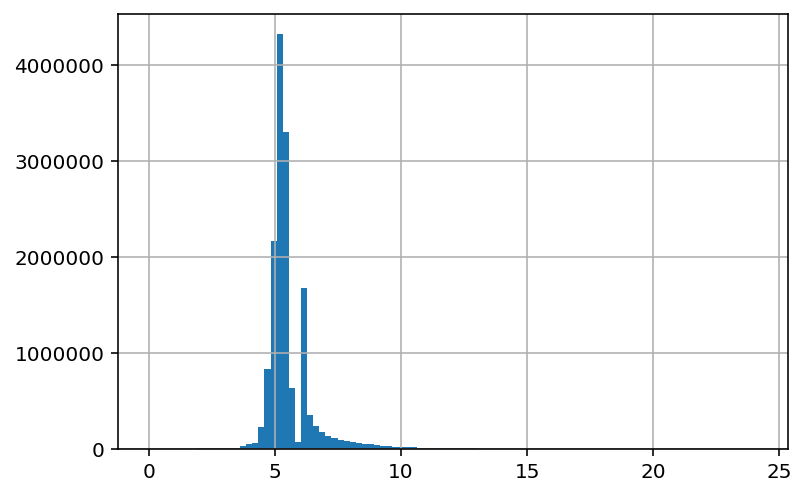

In [33]:
k['log_t'].hist(bins=100)

### Adjusting by user

In [34]:
for u_id, row in u.iterrows():
    k_user = k[k['u_id'] == u_id]
    u.loc[u_id, 'log_t_mean'] = k_user['log_t'].mean()
    u.loc[u_id, 'log_t_std'] = k_user['log_t'].std()


In [35]:
def findMean(u_id):
    return u.at[int(u_id), 't_mean_95']
def findStd(u_id):
    return u.at[int(u_id), 't_std_95']

def findLogMean(u_id):
    return u.at[int(u_id), 'log_t_mean']
def findLogStd(u_id):
    return u.at[int(u_id), 'log_t_std']

k['adj_t'] = (k['t'] - k['u_id'].apply(findMean)) / k['u_id'].apply(findStd)
k['adj_log_t'] = (k['log_t'] - k['u_id'].apply(findLogMean)) / k['u_id'].apply(findLogStd)

KeyboardInterrupt: 

## Defining fluency

In [ ]:
# Runs in approx. 50s
k_sorted = k.sort_values(by='s_id')
rs = 0; re = 0; ranges = {}
for idx, val in k_sorted['s_id'].value_counts().sort_index().iteritems():
    re += val
    ranges[idx] = (rs, re)
    rs += val
    
for s_id, row in s.iterrows():
    if ranges.get(s_id) != None:
        t, v = ranges.get(s_id)
        k_sentence = k_sorted.iloc[t:v, :]
    else:
        k_sentence = k_sorted.iloc[0:0, :]
    
    ###### YOUR CODE HERE #####
    ## Will run ranging over sentence with s_id, row, k_sentence ##
    ## Example: s.at[s_id, 'ks_len'] = len(k_sentence) / len(row['text'])
    
    s.at[s_id, 'adj_t/len'] = k_sentence['adj_t'].sum() / row['text_len']
    s.at[s_id, 'adj_t/sqrt_len'] = k_sentence['adj_t'].sum() / np.sqrt(row['text_len'])
    
    s.at[s_id, 'adj_log_t/len'] = k_sentence['adj_log_t'].sum() / row['text_len']
    s.at[s_id, 'adj_log_t/sqrt_len'] = k_sentence['adj_log_t'].sum() / np.sqrt(row['text_len'])
    
    s.at[s_id, 'adj_log_t/sqrt_k'] = k_sentence['adj_log_t'].sum() / np.sqrt(row['text_len'])
    

In [ ]:
mn = s['adj_log_t/sqrt_len'].mean()
std = s['adj_log_t/sqrt_len'].std()

s['fluency'] = (-1) * (s['adj_log_t/sqrt_len'] - mn) / std

## Defining latency

In [ ]:
decay_par = 0.5

# Question: would it make sense and how would you adjust by user?

In [ ]:
# Runs in approx. 65s
k_sorted = k.sort_values(by='s_id')
rs = 0; re = 0; ranges = {}
for idx, val in k_sorted['s_id'].value_counts().sort_index().iteritems():
    re += val
    ranges[idx] = (rs, re)
    rs += val

In [ ]:
# Runs in 5 min
for s_id, row in s.iterrows():
    if ranges.get(s_id) != None:
        t, v = ranges.get(s_id)
        k_sentence = k_sorted.iloc[t:v, :]
    else:
        k_sentence = k_sorted.iloc[0:0, :]
        
    weights = pd.Series(range(1, len(k_sentence) + 1)).rpow(decay_par)
    weights[len(k_sentence) - 1] += weights[len(k_sentence) - 1]
    
    sorted_k = k_sentence['log_t'].sort_values(ascending=False)
    s.at[s_id, 'weighted_log_t'] = sorted_k.reset_index()['log_t'] @ weights

In [ ]:
mean, std = s['weighted_log_t'].mean(), s['weighted_log_t'].std()
s['latency'] = (s['weighted_log_t'] - mean) / std

## Fluency - latency visualizations

In [361]:
from sklearn.feature_extraction.text import CountVectorizer
count = CountVectorizer()


count.fit(f['text'])

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [362]:
goal_s = ['Learner corpora are electronic collections of natural written data of L2 learners, also called L2-Corpora.',
          'Address advantages and disadvantages associated with each method.',
          'It measures how compatible your data is with the null hypothesis.',
          'The scoring is based on the use of numerical scales. ',
          'What is meant by more complex and fluent speech?',
          'The measure of central tendency which is most sensitive to data from outliers is the mean.']

In [359]:
goal_s = list(s.iloc[50:70]['text'])

In [363]:
# RUNS IN 2-5 MINS

goal_bag = [count.transform(np.array([g_s])) for g_s in goal_s]
goal_lists = [[] for g_s in goal_s]

for s_id, row in s.iterrows():
    bag = count.transform(np.array([row['text']]))
    
    for idx in range(0, len(goal_s)):
        if scipy.spatial.distance.cosine(bag.todense(), goal_bag[idx].todense()) < 0.6:
            goal_lists[idx].append((scipy.spatial.distance.cosine(bag.todense(), goal_bag[idx].todense()), s_id))

for idx in range(0, len(goal_s)):
    goal_lists[idx] = [x[1] for x in sorted(goal_lists[idx])[:10]]
    

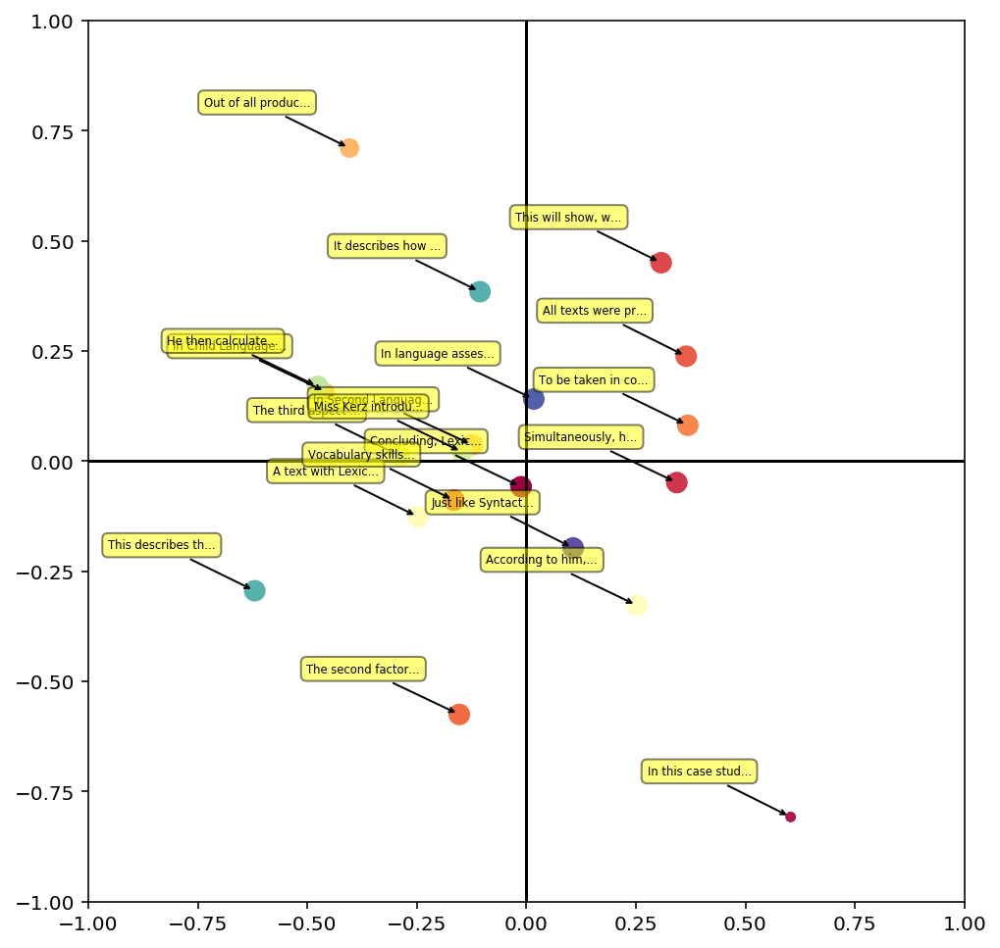

In [220]:
N = len(goal_s)
labels = goal_s
data = np.random.random((N, 4))

for i in range(0, len(goal_s)):
    data[i, 3] = len(goal_lists[i])
    data[i, 0] = s.iloc[goal_lists[i]]['my_f'].mean()
    data[i, 1] = s.iloc[goal_lists[i]]['latency'].mean()
    if len(labels[i]) > 20:
        labels[i] = labels[i][:17] + '...'

fig, ax = plt.subplots()
        
fig.set_size_inches(8, 8)
ax.set(xlim=(-1, 1), ylim=(-1, 1))

ax.axhline(y=0, color='k')
ax.axvline(x=0, color='k')

    
plt.subplots_adjust(bottom = 0.1)
plt.scatter(
    data[:, 0], data[:, 1], marker='o', c=data[:, 2], s=data[:, 3] * 10,
    cmap=plt.get_cmap('Spectral'))

for label, x, y in zip(labels, data[:, 0], data[:, 1]):
    plt.annotate(
        label,
        xy=(x, y), xytext=(-20, 20),
        textcoords='offset points', ha='right', va='bottom',
        bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'),
        size='xx-small',
    )

plt.show()

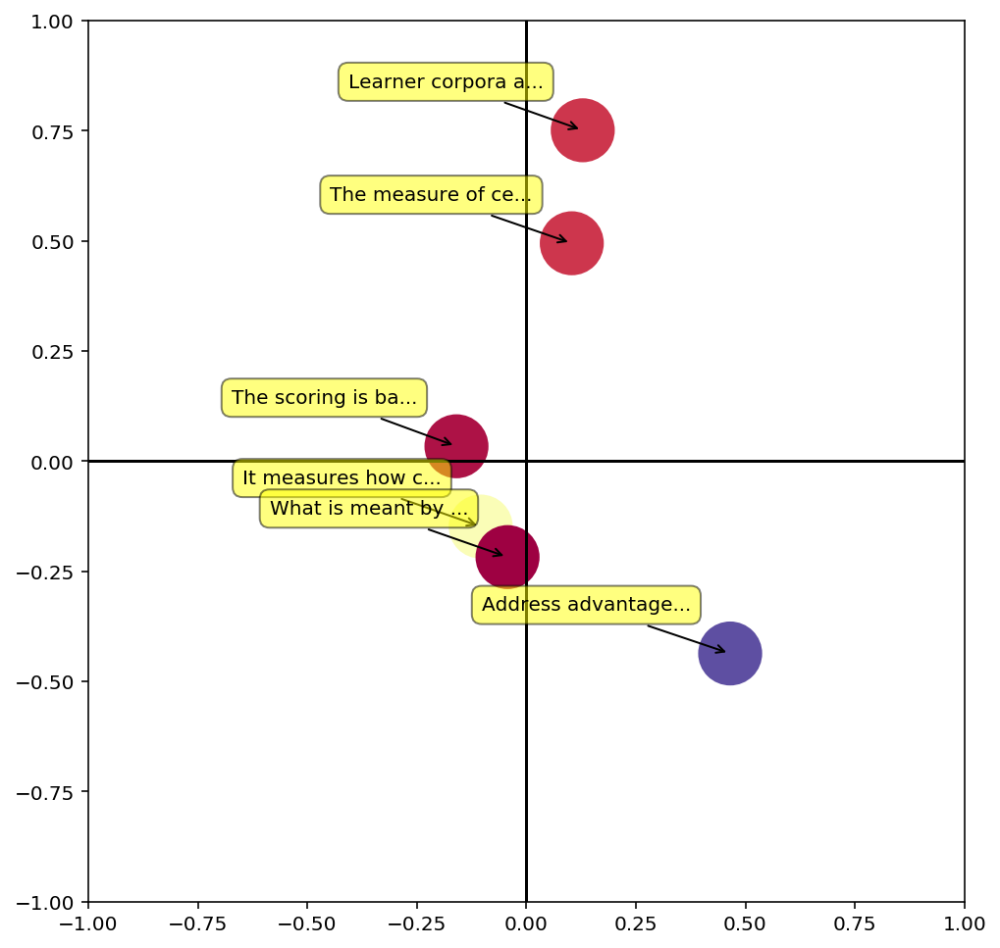

In [364]:
# same thing

N = len(goal_s)
labels = goal_s
data = np.random.random((N, 4))

for i in range(0, len(goal_s)):
    data[i, 3] = len(goal_lists[i])
    data[i, 0] = s.iloc[goal_lists[i]]['my_f'].mean()
    data[i, 1] = s.iloc[goal_lists[i]]['latency'].mean()
    if len(labels[i]) > 20:
        labels[i] = labels[i][:17] + '...'

fig, ax = plt.subplots()
        
fig.set_size_inches(8, 8)
ax.set(xlim=(-1, 1), ylim=(-1, 1))

ax.axhline(y=0, color='k')
ax.axvline(x=0, color='k')

    
plt.subplots_adjust(bottom = 0.1)
plt.scatter(
    data[:, 0], data[:, 1], marker='o', c=data[:, 2], s=data[:, 3] * 100,
    cmap=plt.get_cmap('Spectral'))

for label, x, y in zip(labels, data[:, 0], data[:, 1]):
    plt.annotate(
        label,
        xy=(x, y), xytext=(-20, 20),
        textcoords='offset points', ha='right', va='bottom',
        bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

plt.show()

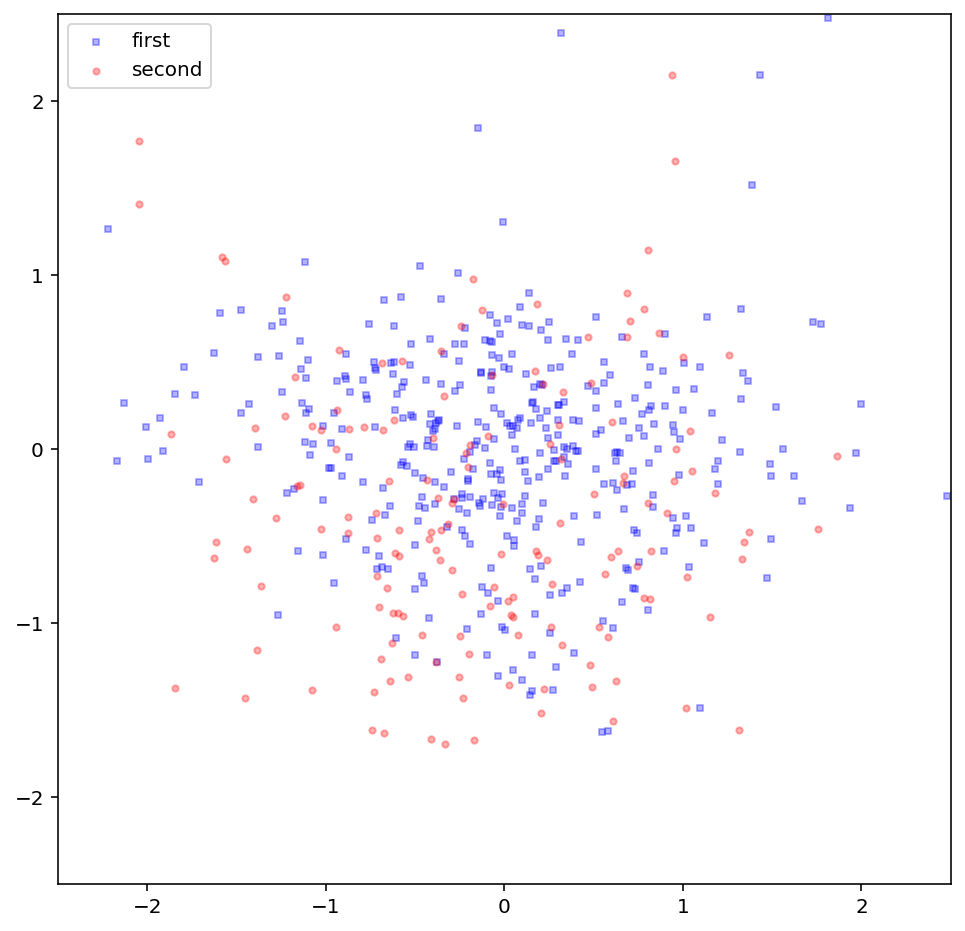

In [104]:
def plot_fluency_latency(s1, s2):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)

    fig.set_size_inches(8, 8)
    ax1.set(xlim=(-2.5, 2.5), ylim=(-2.5, 2.5))


    ax1.scatter(s1['my_f'], s1['latency'], 
                s=10, c='b', marker="s", label='first', alpha=0.3)
    ax1.scatter(s2['my_f'], s2['latency'], 
                s=10, c='r', marker="o", label='second', alpha=0.3)
    plt.legend(loc='upper left');
    plt.show()


# Data summaries

## Keystroke stats by character

In [350]:
print("Our data consists of ", len(k), " keystrokes")

Our data consists of  14966923  keystrokes


In [37]:
print('Percentage of deletions: ', "{:.3f}".format(len(k[k['op'] == '-']) / len(k) * 100), "%")

Percentage of deletions:  10.317 %


Most common char is ' ', most common punctuation is '.', then ','. Most common uppercase is 'I'

In [38]:
print('Most typed characters:\n')

print('char  freq       speed      deleted')
pcts = k['char'].value_counts() / len(k) * 100
for idx, val in pcts.head(30).iteritems():
    ks = k[(k['char'] == idx)]['t'].apply(lambda x: min(x, 5000))
    kdel = k[(k['char'] == idx)]['is_del']
    print("{:>2}".format(idx), "   ", "{:>6.2f}".format(val), "%   ", "{:>6.1f}".format(ks.mean()),
          "   ", "{:>6.3f}".format(100 * kdel.sum() / len(kdel)), "%")

Most typed characters:

char  freq       speed      deleted
        14.41 %     424.3     16.493 %
 e       9.63 %     255.6     14.730 %
 t       6.67 %     386.2     14.232 %
 a       6.01 %     361.3     14.818 %
 i       5.27 %     352.1     14.840 %
 s       5.11 %     342.3     15.492 %
 n       5.08 %     265.7     14.107 %
 o       4.81 %     351.0     14.772 %
 r       4.60 %     282.1     15.000 %
 h       3.31 %     294.0     15.650 %
 l       2.82 %     315.2     13.924 %
 c       2.60 %     405.7     14.152 %
 d       2.51 %     340.2     15.174 %
 u       2.16 %     291.2     15.188 %
 p       1.63 %     422.4     14.260 %
 m       1.51 %     366.6     14.777 %
 f       1.50 %     388.7     15.053 %
 g       1.41 %     290.2     14.840 %
 w       0.97 %     542.7     17.888 %
 y       0.96 %     352.0     15.442 %
 b       0.85 %     443.0     16.019 %
 .       0.82 %     930.6     19.257 %
 v       0.79 %     378.5     15.265 %
 ,       0.54 %    1052.9     20.662 %
 T  

## Distribution of pause length

On a log scale:

In [355]:
print('log_t')

log_t


In [354]:
k['t'].mean()

74108.88468919096

In [353]:
k['t'].median()

176.0

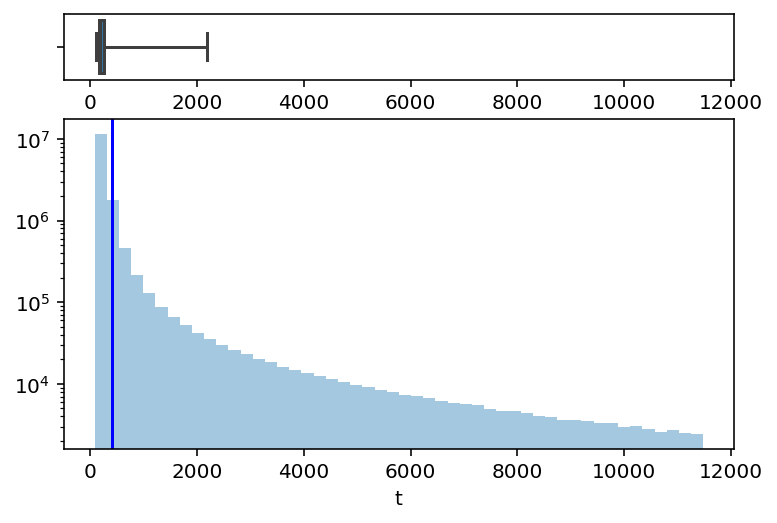

In [39]:
plot_summary(k['t'])

In a small segment, it behaves like $c^x$

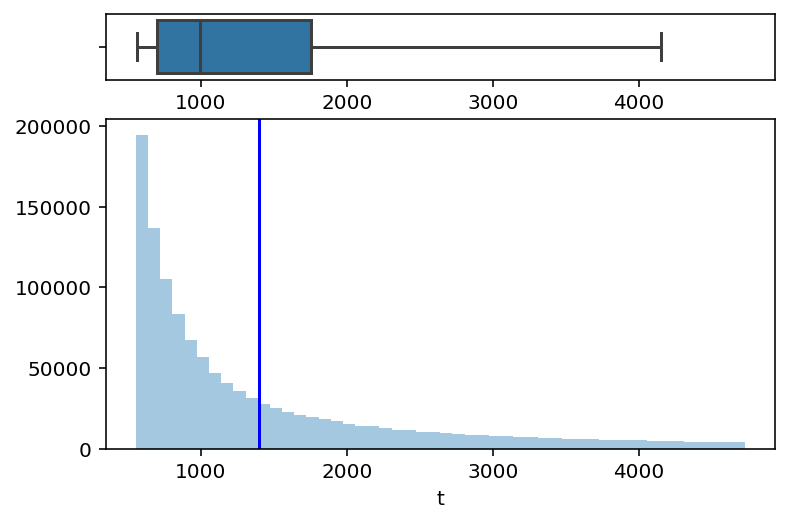

In [40]:
plot_summary(k[(k['t'] > 550) & (k['t'] < 5000)]['t'])

Here is why we chose to take log, distribution looks nicer

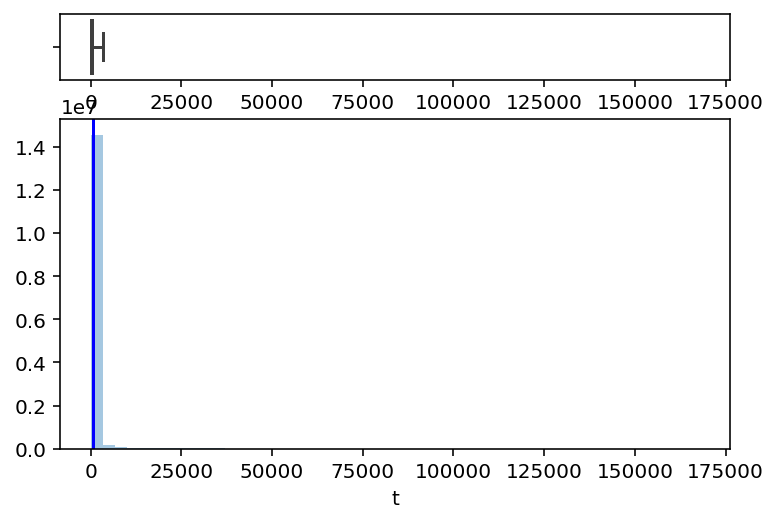

In [41]:
plot_summary(k['t'], pct=0.001, logscale=0)

The imperfection/spikes are due to the fact that etherpad only logs keystrokes every 0.5 second

So there's a bunch that happened at a distance of .5, .25 etc

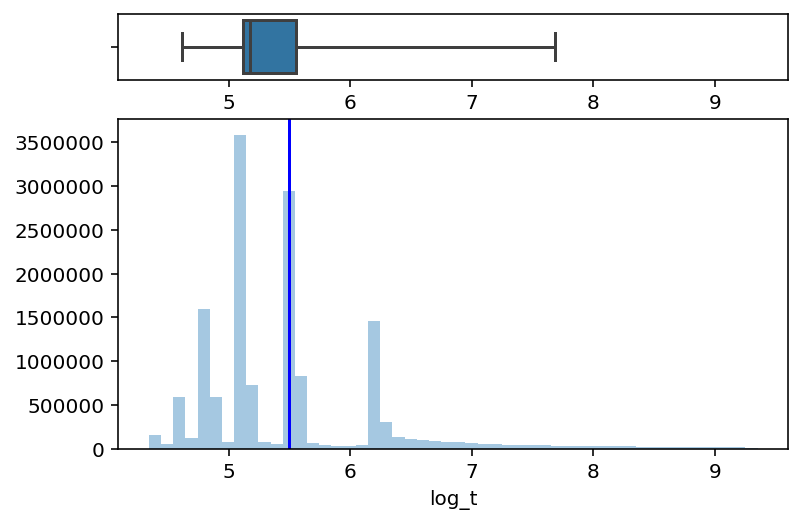

In [42]:
plot_summary(k['log_t'])

Impact of adjusting by user

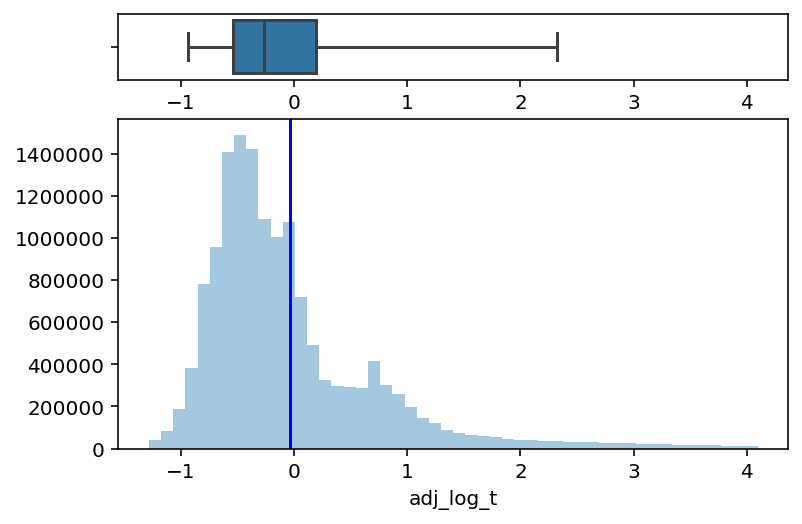

In [43]:
plot_summary(k['adj_log_t'])

## Frequency of long breaks

For every sentence, we take the number of pauses longer than .5, 1, 2, 5, 10 seconds

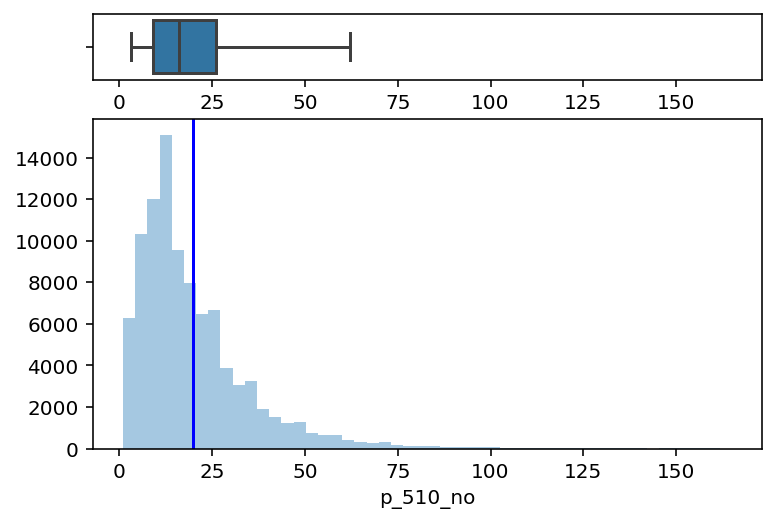

In [44]:
plot_summary(s['p_510_no'], pct=0.0003, logscale=0)

On average, people take 5 breaks longer than 2 seconds per sentence

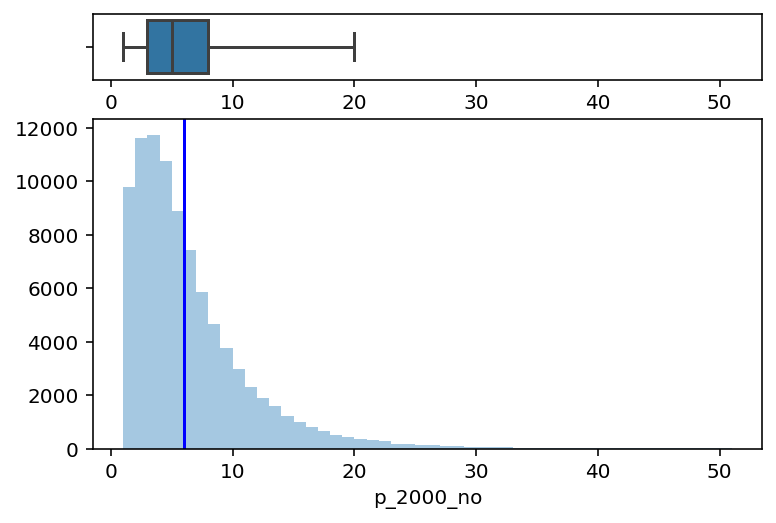

In [45]:
plot_summary(s['p_2000_no'], pct=0.0003, logscale=0)

The number of long breaks decreases approximately exponentially

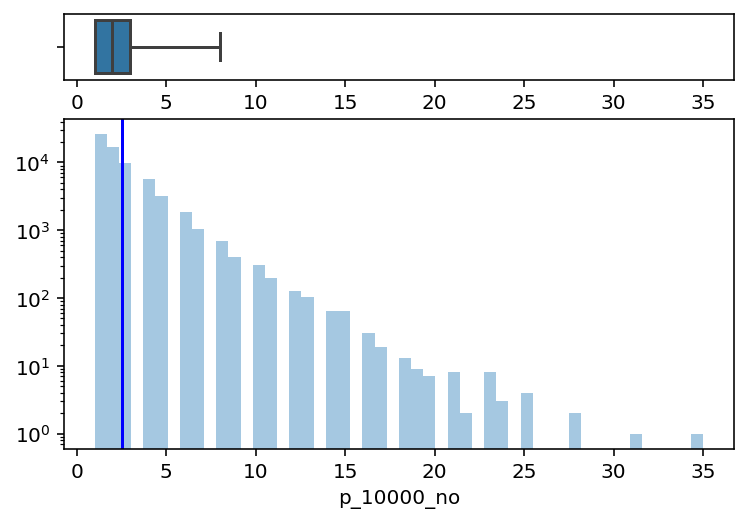

In [46]:
plot_summary(s['p_10000_no'], pct=0, logscale=1)

## Word statistics

In [352]:
len(f)

3466

In [47]:
print("Our data consists of ", len(w), " words")

Our data consists of  1831361  words


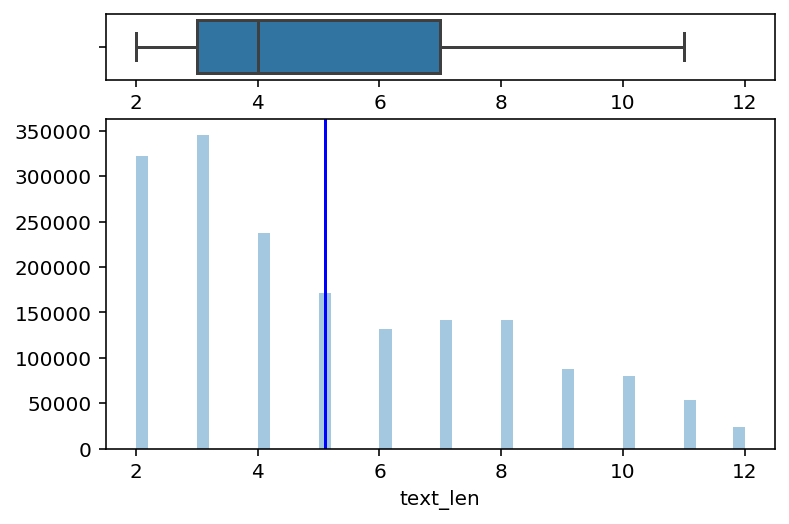

In [48]:
plot_summary(w['text_len'])

In [49]:
print("{:.3f}".format(100 * len(w[w['spell_err'] > 0]) / len(w)), "% of the words were misspelt")

1.807 % of the words were misspelt


In [50]:
print('{:>12}'.format("word"), '{:>8}'.format("count"), '{:>11}'.format("revised"), '{:>10}'.format("  time/len"), '{:>10}'.format("   longest p (mean of IQR)"), "\n")

for idx, val in w['text'].value_counts().head(30).iteritems():
    wds = w[w['text'] == idx]
    pm, pM = wds['max_p'].quantile(0.6), wds['max_p'].quantile(0.7)
    print('{:>12}'.format(idx), '{:>8}'.format(val), "   "
          '{:>5.1f}'.format(100 * len(wds[wds['n_revisions'] > 0]) / val), "%  ",
          '{:>8.1f}'.format(wds['t/len_filter_10000'].mean()), "   ",
          '{:>8.1f}'.format(wds[(wds['max_p'] > pm) & (wds['max_p'] < pM)]['max_p'].mean()))    
    

        word    count     revised   time/len    longest p (mean of IQR) 

         the   126119     10.7 %      781.5        518.1
          of    68878      9.0 %      911.1        520.4
         and    48599     15.5 %     1057.8        867.3
          to    45921      8.4 %      904.3        503.4
          is    45712     10.8 %     1126.8        511.5
           a    42351      7.7 %     1675.0        464.1
          in    31274     11.1 %     1253.3        623.8
        that    25076     14.8 %      699.6        558.0
         are    24948     11.7 %      840.8        519.8
         The    22245     24.6 %     3073.4      14646.5
          be    18592      6.3 %      578.5        253.1
    language    17660     21.1 %      454.0        626.5
          or    13842     14.0 %     1239.8        696.6
         for    12718     16.5 %      960.2        763.1
       which    12210     22.8 %      841.7       1080.3
         can    11738     13.4 %      850.8        529.2
          on  

## Sentence stats

In [51]:
print("Our data consists of ", len(s), " sentences")

Our data consists of  95354  sentences


On average, sentences are abt 120 characters / 18 words long

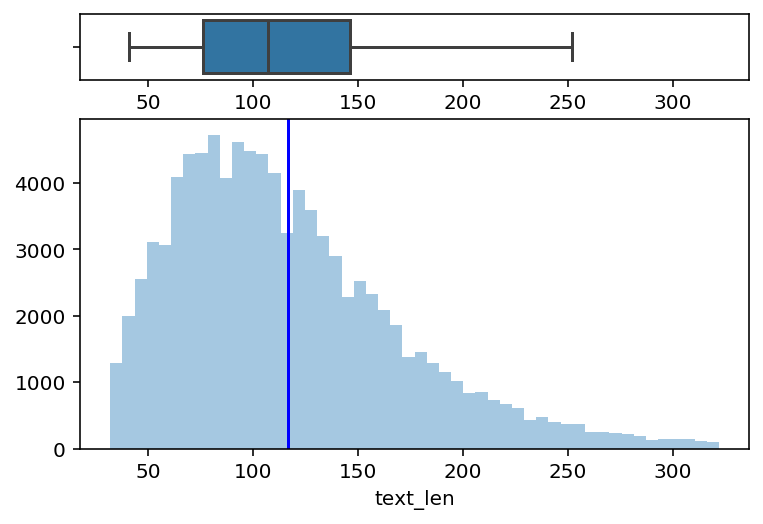

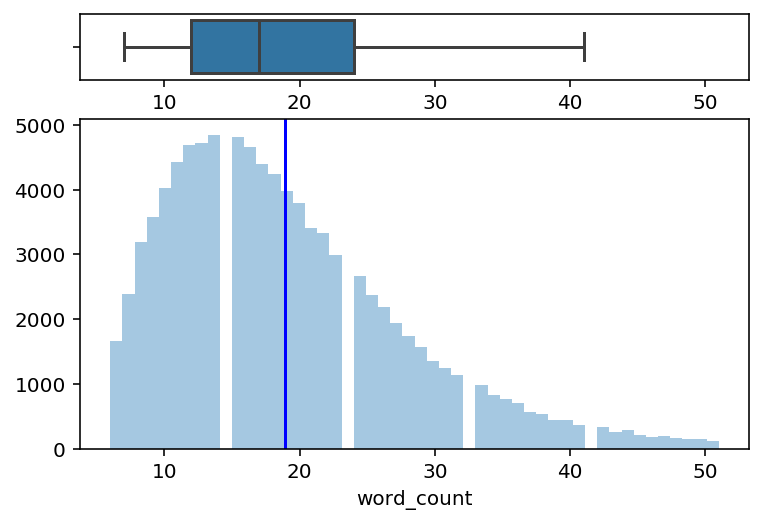

In [52]:
plot_summary(s['text_len'])
plot_summary(s['word_count'])

And time spent is pretty much proportional to the length of the sentence

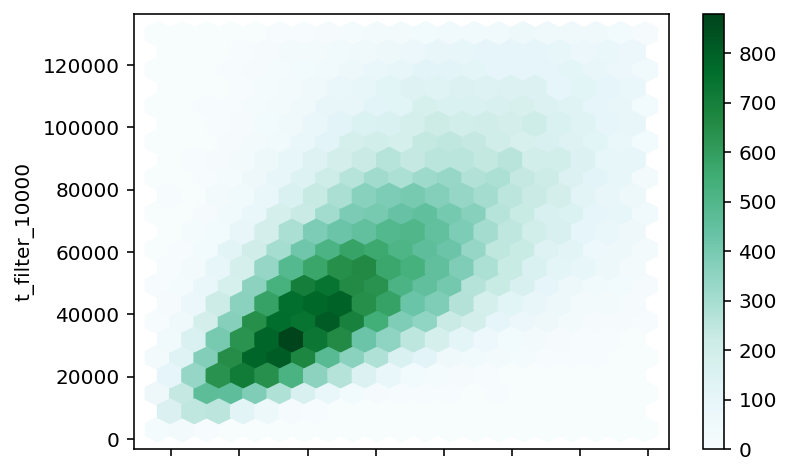

In [53]:
s[(s['text_len'] < 200) & (s['t_filter_10000'] < 130000)].plot.hexbin(x='text_len', y='t_filter_10000', gridsize=20)


### CoCoGen metrics and normalizations

We imported these metrics from CoCoGen, removing some who were duplicates/uninformative

In [54]:
print  (['Syntactic.ClausesPerSentence_value',
       'Syntactic.DependentClausesPerSentence_value',
       'Syntactic.CoordinatePhrasesPerSentence_value',
       'Syntactic.VerbPhrasesPerSentence_value',
       'Syntactic.ComplexNominalsPerSentence_value',
       'NounPhrasePreModificationWords_value',
       'NounPhrasePostModificationWords_value',
       'Lexical.Sophistication.NAWL_value',
       'Lexical.Sophistication.NGSL_value', 'Lexical.Sophistication.AFL_value',
       'Lexical.Sophistication.ANC_value', 'Lexical.Sophistication.BNC_value',
       'Lexical.Density_value', 'Lexical.Diversity.NDW_value',
       'Lexical.Diversity.CNDW_value', 'Lexical.Diversity.TTR_value',
       'Lexical.Diversity.CTTR_value', 'Lexical.Diversity.RTTR_value',
       'Morphological.MeanSyllablesPerWord_value',
       'Morphological.MeanLengthWord_value', 'KolmogorovDeflate_value',
       'Morphological.KolmogorovDeflate_value',
       'Syntactic.KolmogorovDeflate_value'])

['Syntactic.ClausesPerSentence_value', 'Syntactic.DependentClausesPerSentence_value', 'Syntactic.CoordinatePhrasesPerSentence_value', 'Syntactic.VerbPhrasesPerSentence_value', 'Syntactic.ComplexNominalsPerSentence_value', 'NounPhrasePreModificationWords_value', 'NounPhrasePostModificationWords_value', 'Lexical.Sophistication.NAWL_value', 'Lexical.Sophistication.NGSL_value', 'Lexical.Sophistication.AFL_value', 'Lexical.Sophistication.ANC_value', 'Lexical.Sophistication.BNC_value', 'Lexical.Density_value', 'Lexical.Diversity.NDW_value', 'Lexical.Diversity.CNDW_value', 'Lexical.Diversity.TTR_value', 'Lexical.Diversity.CTTR_value', 'Lexical.Diversity.RTTR_value', 'Morphological.MeanSyllablesPerWord_value', 'Morphological.MeanLengthWord_value', 'KolmogorovDeflate_value', 'Morphological.KolmogorovDeflate_value', 'Syntactic.KolmogorovDeflate_value']


And normalized those who were linearly dependent on text length

So that they now represent stds from the mean of that metrics 
    within the pool of sentences of that length

For example, here is Kolmogorov deflate, which pretty much was linear in text_len

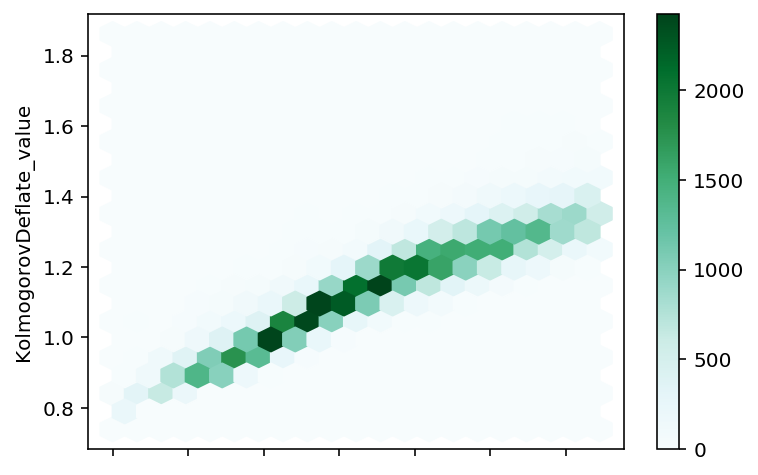

In [55]:
s[(s['text_len'] < 150) & (s['t_filter_10000'] < 130000)].plot.hexbin(x='text_len', y='KolmogorovDeflate_value', gridsize=20)

And now does not depend on it

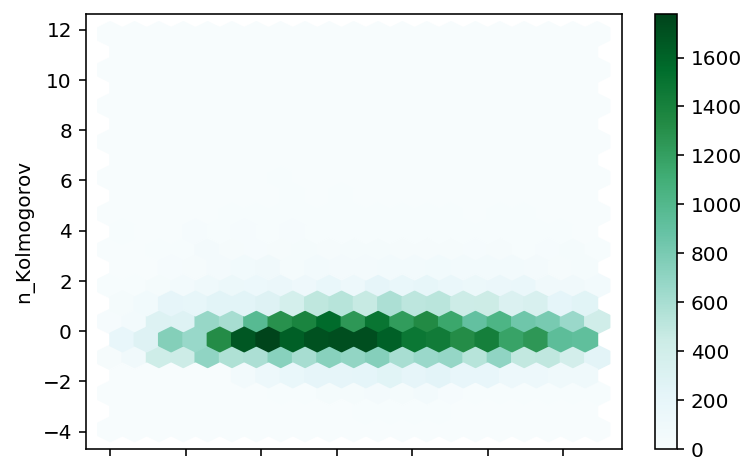

In [56]:
s[(s['text_len'] < 150) & (s['t_filter_10000'] < 130000)].plot.hexbin(x='text_len', y='n_Kolmogorov', gridsize=20)

These are the measures affected:

In [57]:
print([('KolmogorovDeflate_value', 'n_Kolmogorov'),
      ('Syntactic.KolmogorovDeflate_value', 'n_SKolmogorow'),
      ('Morphological.KolmogorovDeflate_value', 'n_MKolmogorow'),
      ('Lexical.Diversity.NDW_value', 'n_NDW_value'),
      ('Lexical.Diversity.RTTR_value', 'n_RTTR_value')])

[('KolmogorovDeflate_value', 'n_Kolmogorov'), ('Syntactic.KolmogorovDeflate_value', 'n_SKolmogorow'), ('Morphological.KolmogorovDeflate_value', 'n_MKolmogorow'), ('Lexical.Diversity.NDW_value', 'n_NDW_value'), ('Lexical.Diversity.RTTR_value', 'n_RTTR_value')]


### Time spent measures

 We computed time spent and time/len for different tresholds (1s, 2s, 5s, 10s, 30s),
 setting pauses longer than the treshold to be as long as the treshold
 
 This was necessary as if not outliers (like minute-long breaks, or even hour-long) corrputed statistiacl metrics

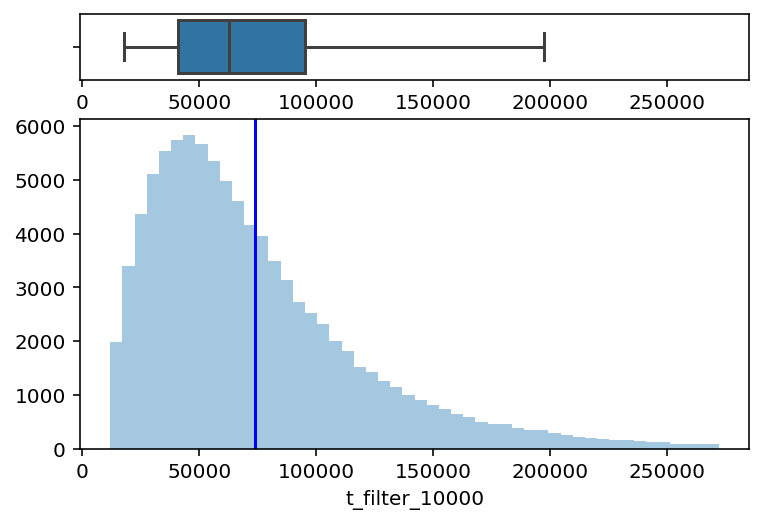

In [58]:
plot_summary(s['t_filter_10000'])

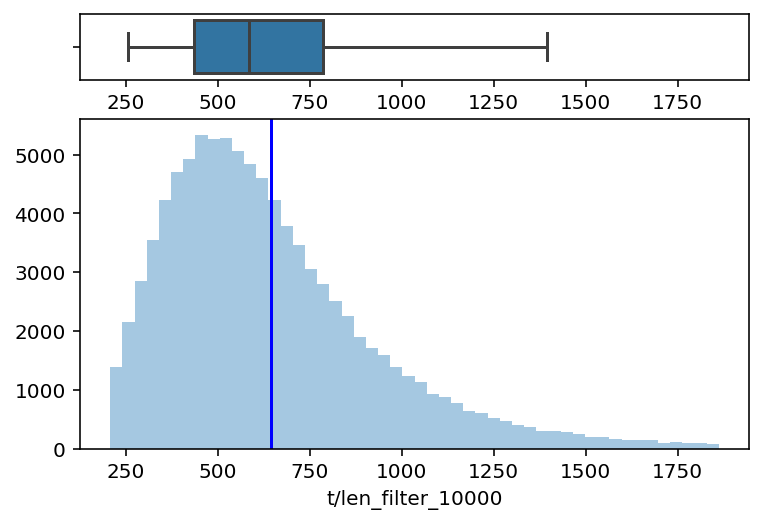

In [59]:
plot_summary(s['t/len_filter_10000'])

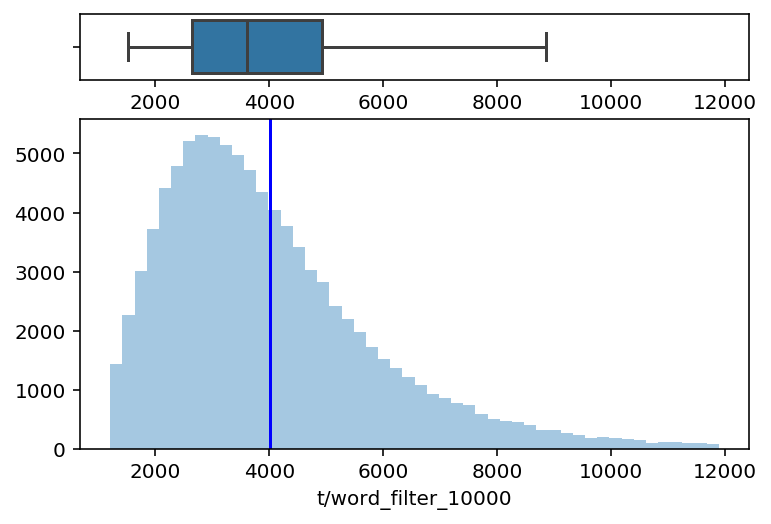

In [60]:
plot_summary(s['t/word_filter_10000'])

### Normalized time primitives

Please refer to section 3 for mathematical formulations

Fluency is an indicator of average typing speed. It doesn't excessively weight very long pauses, and does not depend on length. Comparing two sentences written in the same time, the one written at a constant pace is more fluent that the one written in bursts and long breaks

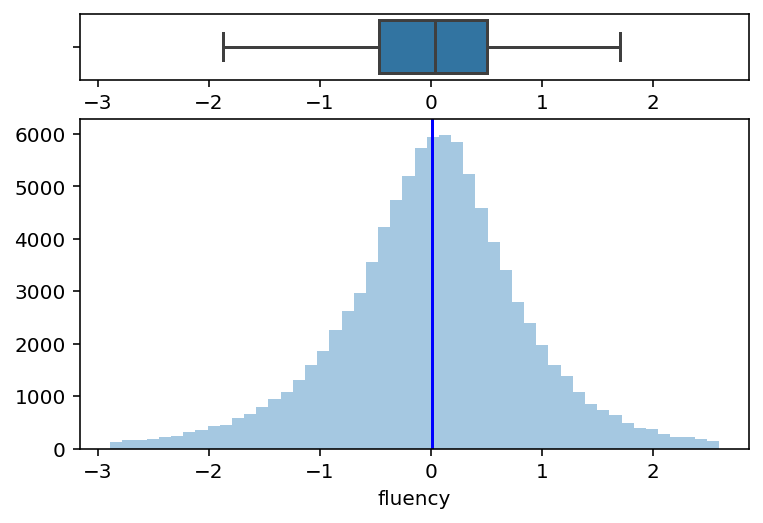

In [61]:
plot_summary(s['fluency'])

Latency is an indicator of the time taken in the longest pauses during the sentence. A sentence written all at once after one big pause would have high latency, one written in bursts with medium-length breaks would have medium latency, and one at a constant pace will have low latency.

Longer sentences tend to have slightly higher latency because they tend to contain longer pauses overall

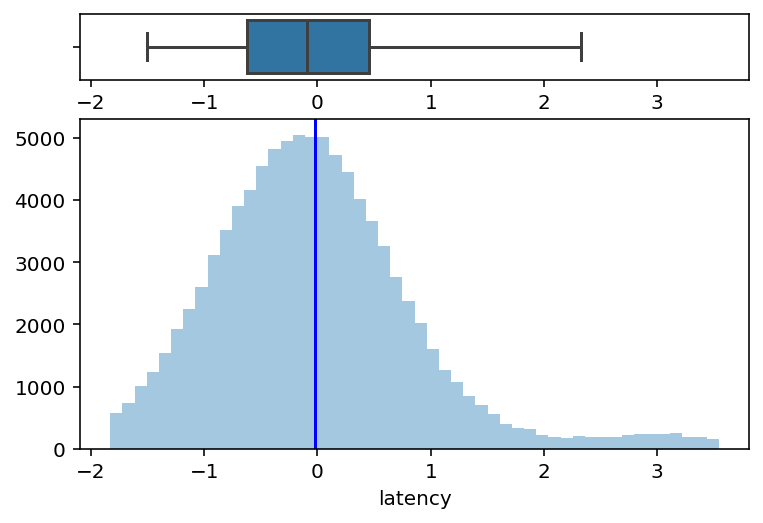

In [62]:
plot_summary(s['latency'])

Fluency and latency tend to be negatively correlated, because they both depend on the overall time spent, but more time is lower fluency & higher latency

In [63]:
cff = s['fluency'].corr(s['latency'])
cff

-0.33534577594379894

If you do a x-y plot of fluency vs latency you can identify different sentences types

In [64]:
fit = np.poly1d(np.polyfit(s['latency'], s['fluency'], 1))
s['my_f'] = s['fluency'] - fit[1] * s['latency']

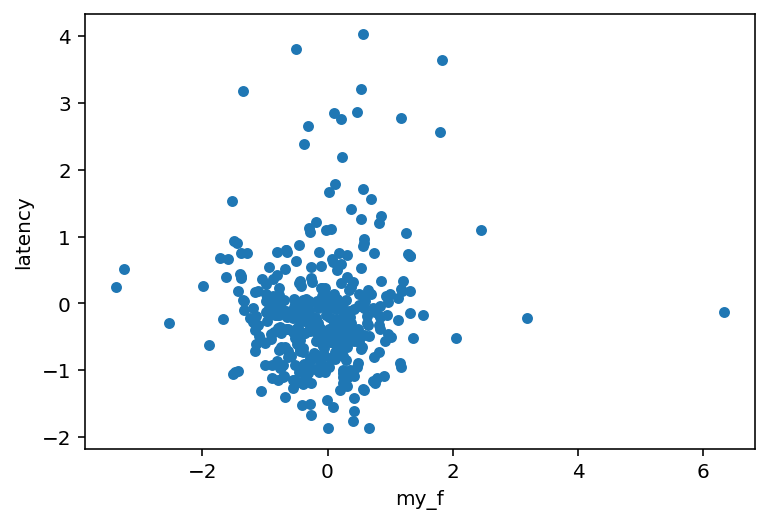

In [96]:
s.head(400).plot.scatter(x='my_f', y='latency')

### Time disribution metrics

We divided into time spent on word, and on separators

It is not clear yet whether a bigger fraction of time spent on separators indicates more syntactically complex sentences, or simply more difficult words

Around 28% of the time is spent on separators

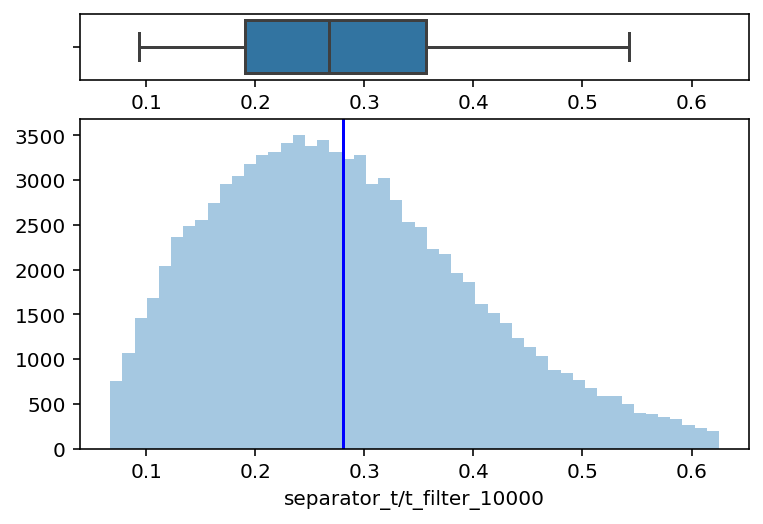

In [66]:
plot_summary(s['separator_t/t_filter_10000'])

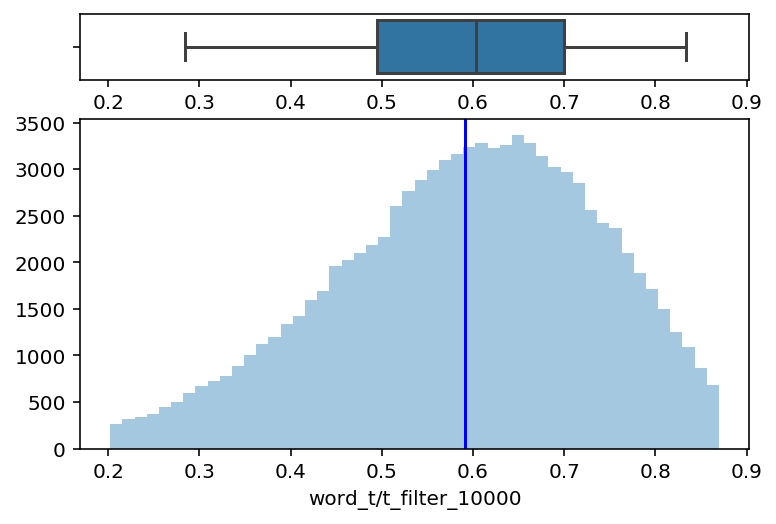

In [67]:
plot_summary(s['word_t/t_filter_10000'])

Here is the avg time spent revising the sentence, which should be very indicative of complexity

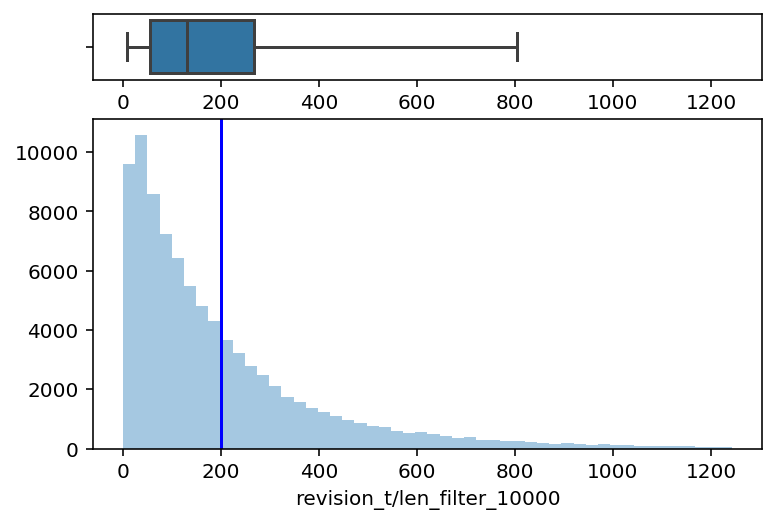

In [68]:
plot_summary(s['revision_t/len_filter_10000'], logscale=0)

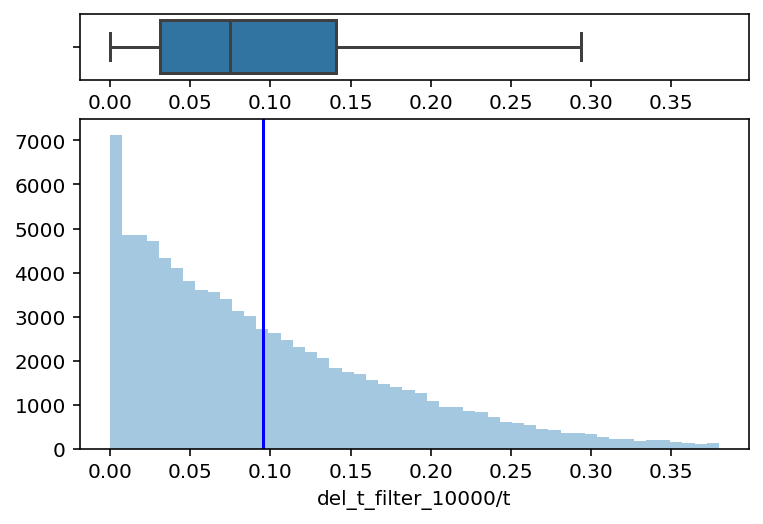

In [69]:
plot_summary(s['del_t_filter_10000/t'], logscale=0)

### Jumps and chunks

A jump is defined to be whenever the user moves to a non-consecutive point of the final sentence

A new chunk is defined to be whenever the user moves to a different sentence, and then comes back to the one he's now writing

Both are related with the amount of revisions

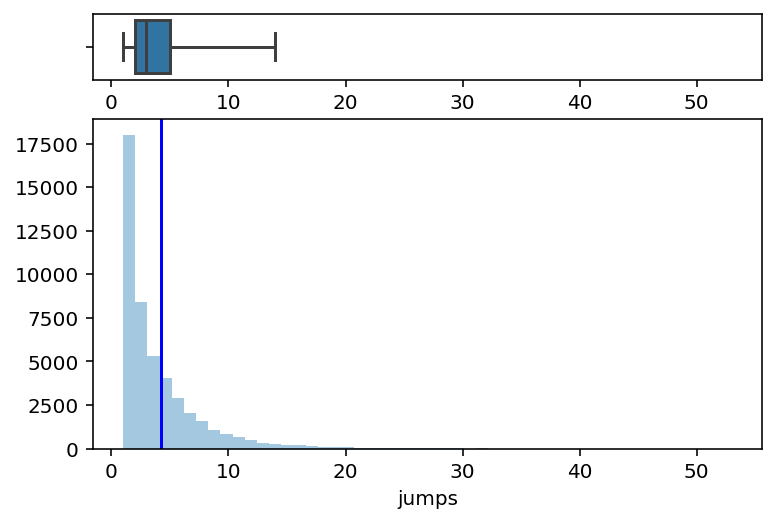

In [70]:
plot_summary(s['jumps'], pct=0, logscale=0)

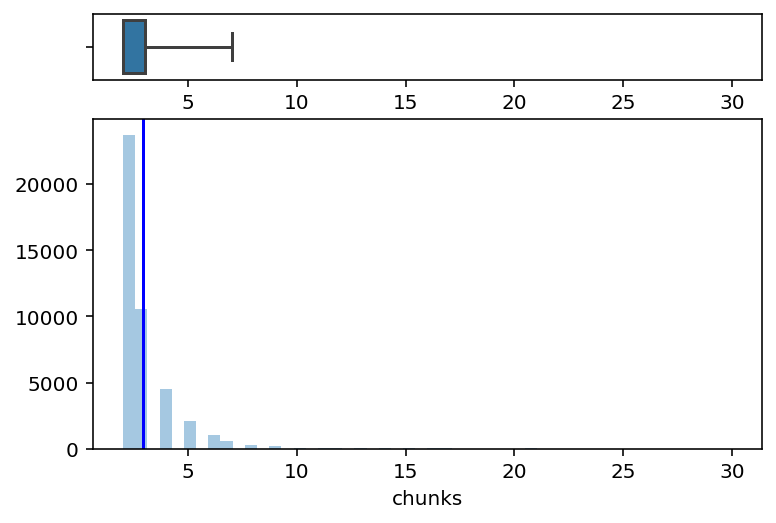

In [71]:
plot_summary(s['chunks'], pct=0, logscale=0)

# Number of clauses analysis

For a given sentence length and for a fixed user, single-clause sentences take longer to write ($p = 2 \cdot 10^{-9}$)

This is the opposite of what one might expect. But actually, it's easier to form a 'simple' sentence of a given length by splitting it up over multiple clauses, rather than writing one extremely long clause.

In particular, single-clause sentences have both higher latency and higher fluency, indicating they are more likely to be written all at once rather than in blocks at a constant pace with breaks

If we remove the dependency on sentence length, multi-clause sentences, have higher latency, indicating a larger block of time devoted to thinking about sentence structure (but still higher fluency)

As far as secondary measures go, multi-claused sentences have a higher proportion of time spent revising and on separators. 

One might think that during the revision process, single-claused sentences are "improved" into multi-claused sentences. But in fact, the opposite happens.

The difference in number of jumps and chunks very strongly suggest that by revising after the sentence is completed for the first time, writers are turning multi claused sentences into single claused. This is because, again, single claused sentences tend to be more elaborate.

It is unclear if writers happen to go through the same process in the middle of writing a sentence as well.

(Note: removing the filter for equal-length sentences make multi-clause sentences appear to be more complex in all aspects, but this is likely related to the fact that multi-clause sentences are ~51 chars longer on avg)

Comparing coordinate vs dependent clauses, there is no appreciable difference in fluency, latency, or typing speed.

However, subordinate sentences exibit a much bigger number of >2s pauses. This likely means that it's easier to write a coordinative 'and' without stopping to think, whereas it is more difficult to introduce a dependent clause.

Subordinate clause also tend to have bigger revision, separator, and jump (but not chunks), likely signifing increased linguistic complexity.

## Single vs multi clause

In [72]:
def isSingleClause(row):
    return (row['Syntactic.ClausesPerSentence_value'] <= 1)

def isMultiClause(row):
    return (row['Syntactic.ClausesPerSentence_value'] > 1)

### Basic measures

Returning dataframes of len  13941


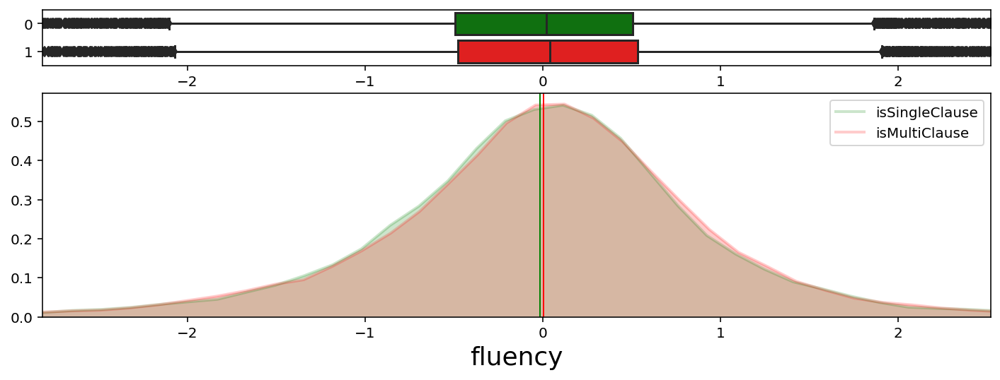

Sample size:  13941    Mean diff:  0.0180    stds:  0.0183   p-value:  0.015281


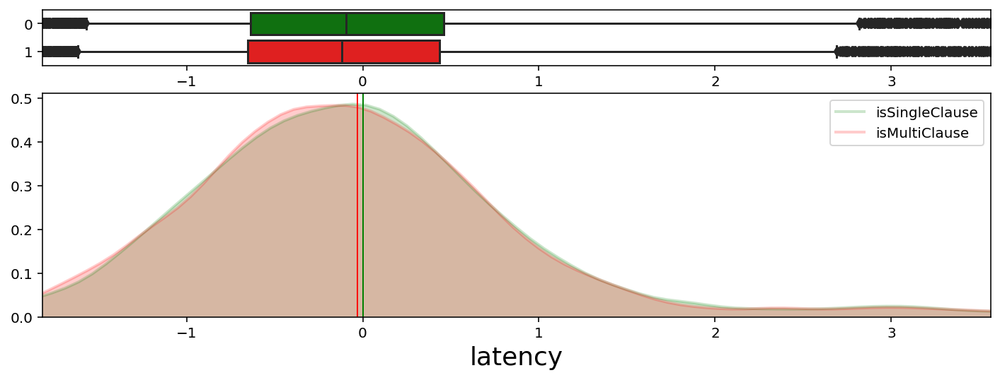

Sample size:  13941    Mean diff:  0.0311    stds:  0.0313   p-value:  0.000108


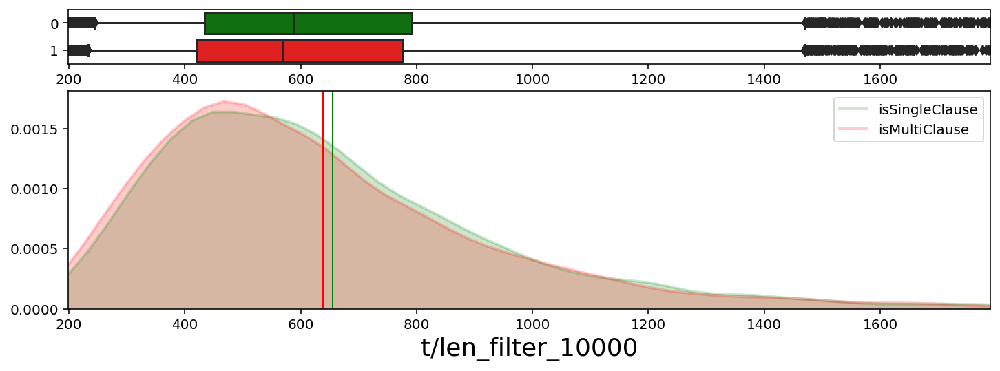

Sample size:  13941    Mean diff:  16.3281    stds:  0.0496   p-value:  2.32270E-09


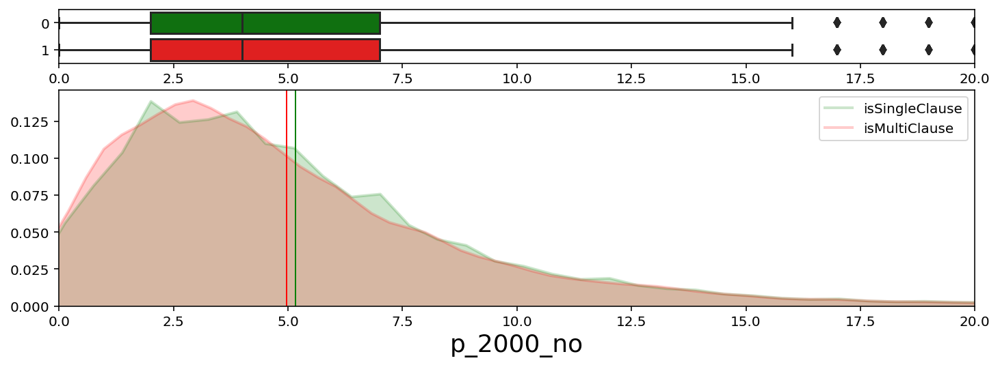

Sample size:  13941    Mean diff:  0.2001    stds:  0.0477   p-value:  8.87788E-09


In [74]:
plot_distr(['fluency', 'latency', 't/len_filter_10000', 'p_2000_no'],
           by_user=True, by_length=True, cr1=isSingleClause, cr2=isMultiClause)

#### No len filtering

Returning dataframes of len  40296


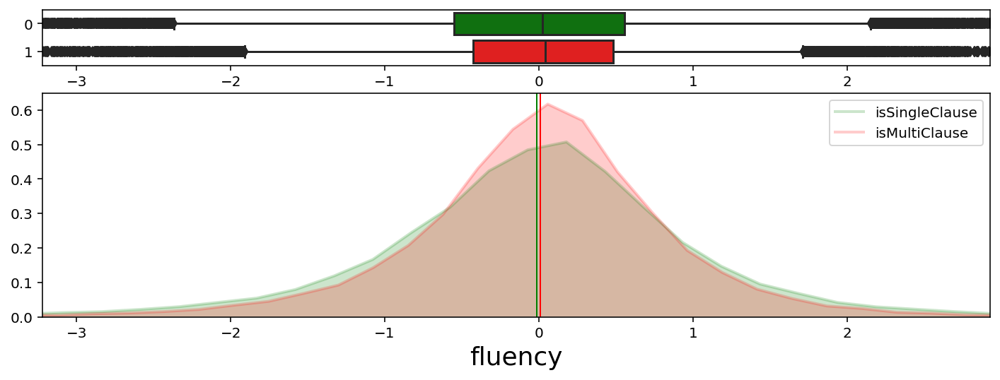

Sample size:  40296    Mean diff:  0.0226    stds:  0.0225   p-value:  3.28815E-06


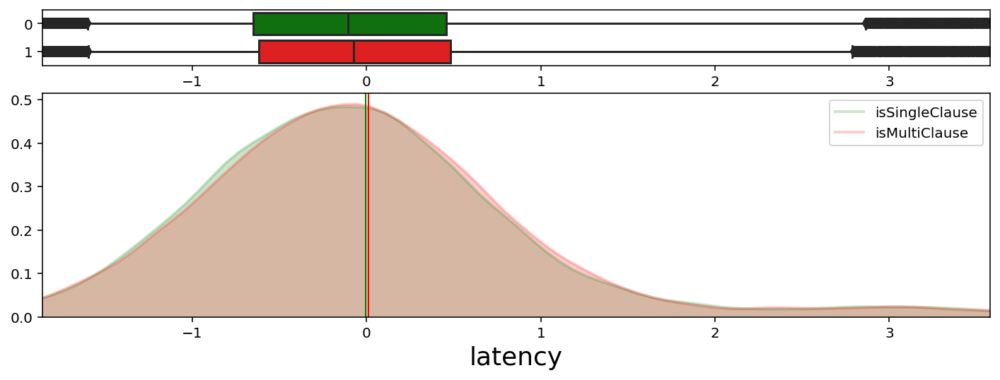

Sample size:  40296    Mean diff:  0.0176    stds:  0.0175   p-value:  0.000216


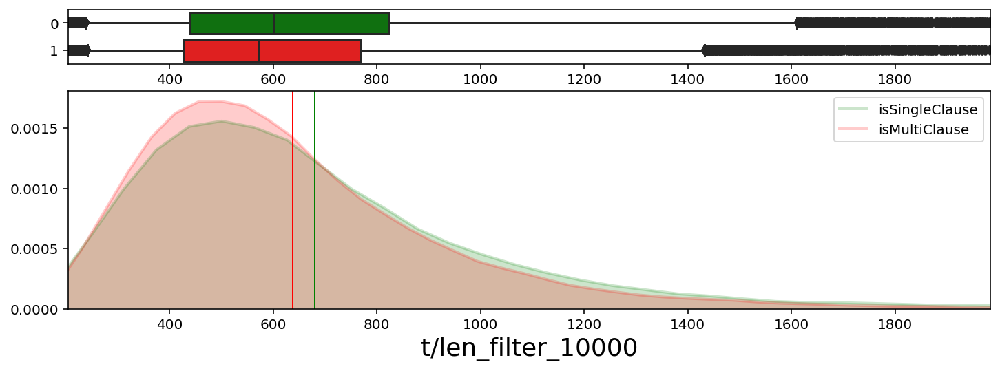

Sample size:  40296    Mean diff:  41.9089    stds:  0.1230   p-value:  7.82139E-135


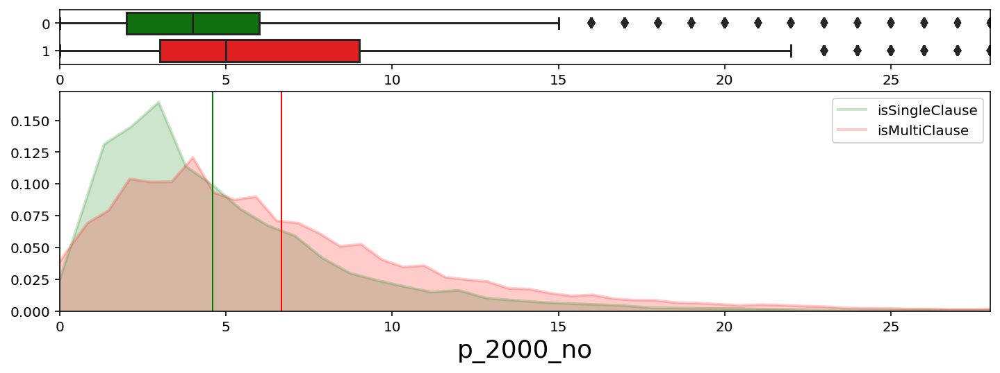

Sample size:  40296    Mean diff:  2.0718    stds:  0.4171   p-value:  0.00000E+00


In [75]:
plot_distr(['fluency', 'latency', 't/len_filter_10000', 'p_2000_no'],
           by_user=True, by_length=False, cr1=isSingleClause, cr2=isMultiClause)

### Secondary measures

Returning dataframes of len  13941


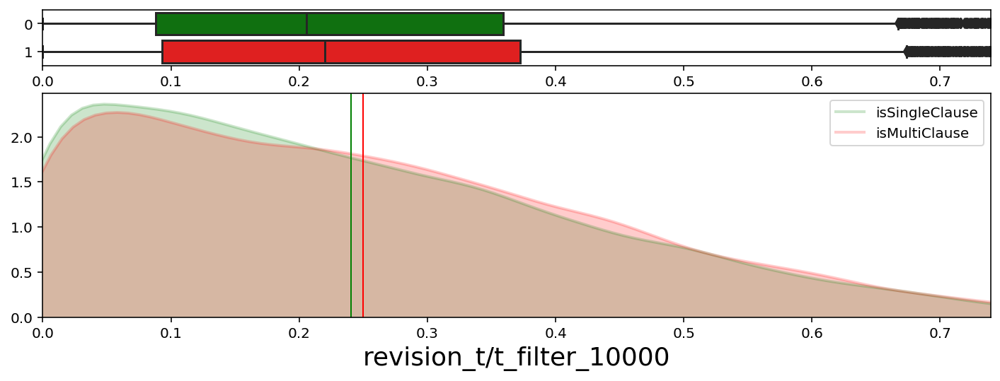

Sample size:  13941    Mean diff:  0.0094    stds:  0.0506   p-value:  1.17957E-09


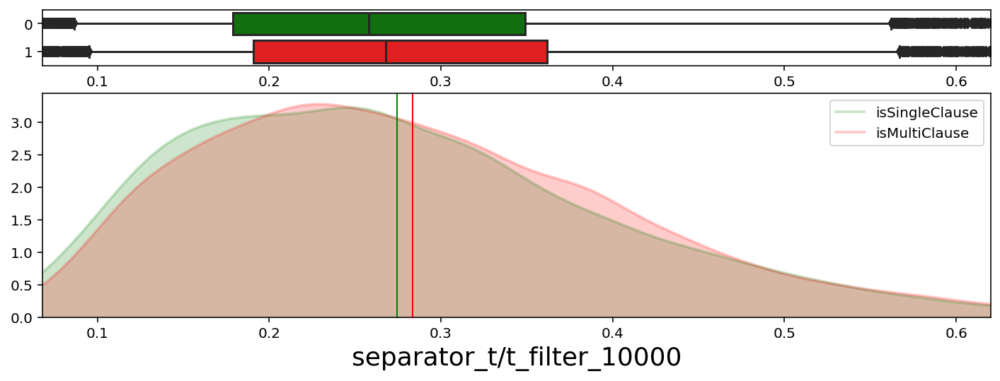

Sample size:  13941    Mean diff:  0.0092    stds:  0.0745   p-value:  7.40313E-19


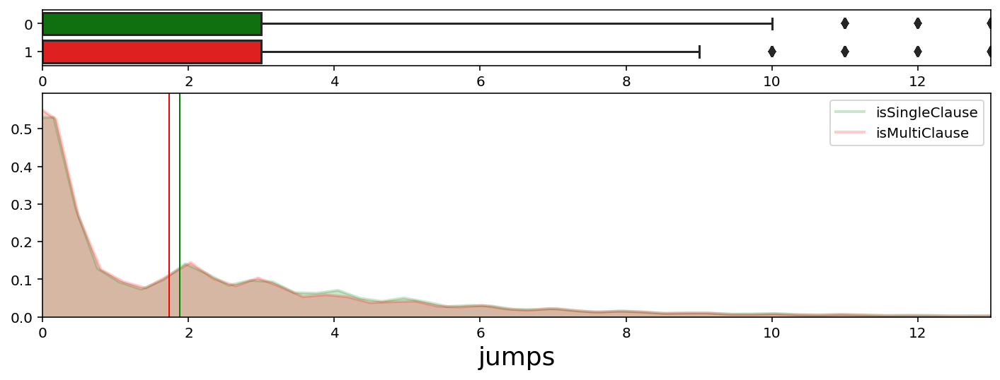

Sample size:  13941    Mean diff:  0.1504    stds:  0.0527   p-value:  2.44254E-10


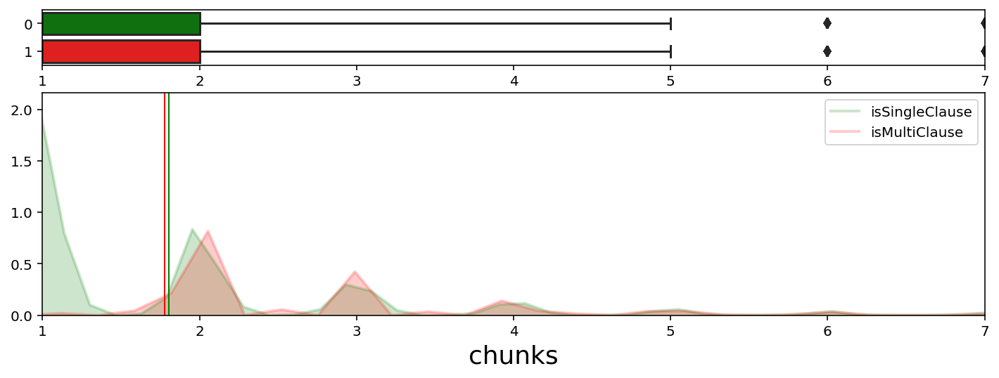

Sample size:  13941    Mean diff:  0.0265    stds:  0.0204   p-value:  0.007974


In [76]:
plot_distr(['revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, cr1=isSingleClause, cr2=isMultiClause)

#### No len filtering

Returning dataframes of len  40296


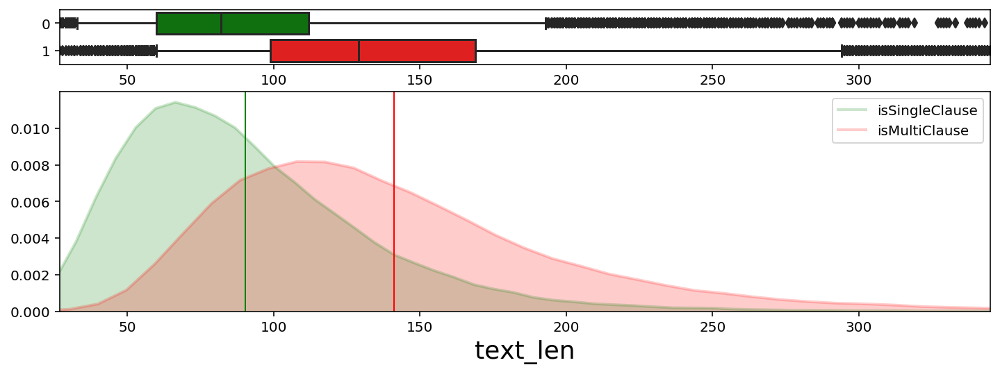

Sample size:  40296    Mean diff:  50.9603    stds:  0.9778   p-value:  0.00000E+00


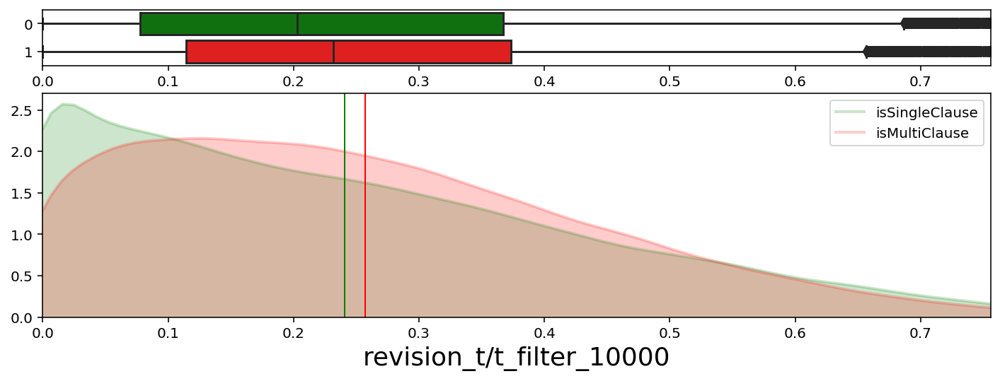

Sample size:  40296    Mean diff:  0.0163    stds:  0.0876   p-value:  1.48570E-69


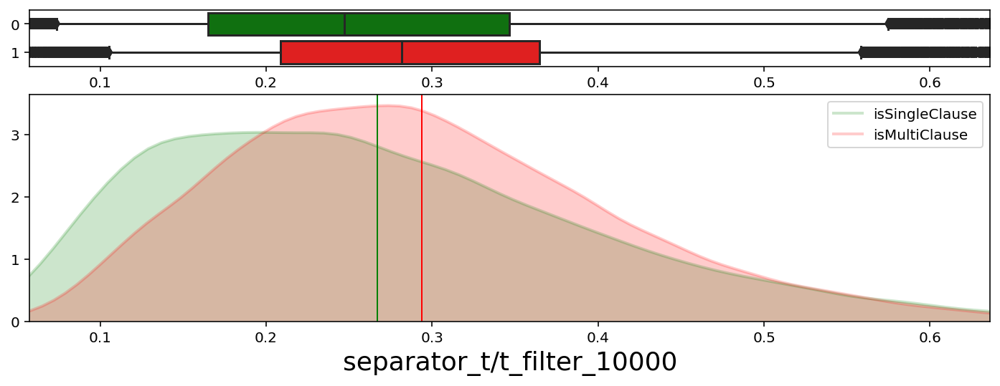

Sample size:  40296    Mean diff:  0.0270    stds:  0.2169   p-value:  0.00000E+00


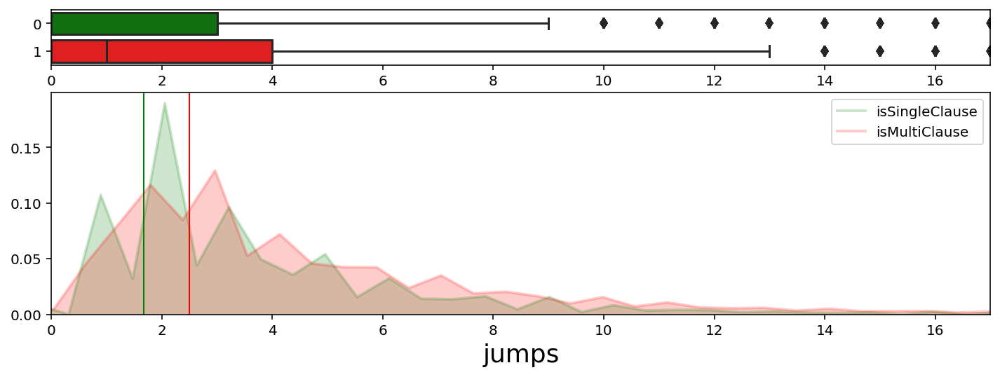

Sample size:  40296    Mean diff:  0.8306    stds:  0.2549   p-value:  0.00000E+00


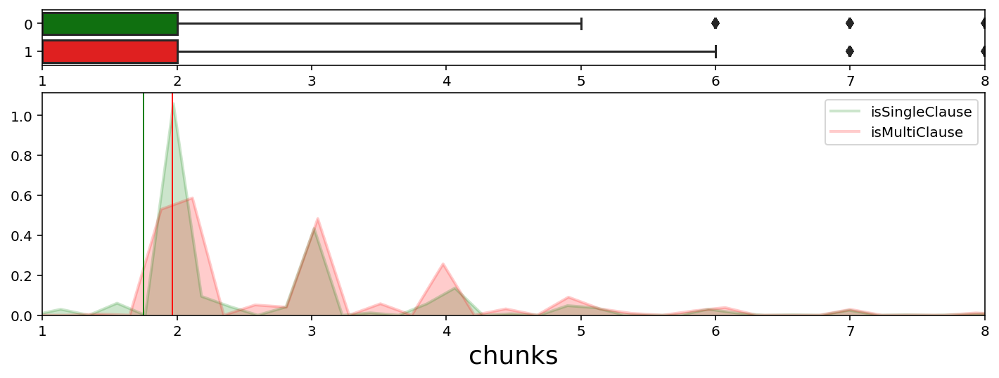

Sample size:  40296    Mean diff:  0.2142    stds:  0.1545   p-value:  1.28013E-211


In [77]:
plot_distr(['text_len','revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=False, cr1=isSingleClause, cr2=isMultiClause)

## Coord vs sub

In [78]:
def isOnlyCoord(row):
    return (row['Syntactic.CoordinatePhrasesPerSentence_value'] > 0) and \
            (row['Syntactic.DependentClausesPerSentence_value'] == 0)
def isOnlySub(row):
    return (row['Syntactic.DependentClausesPerSentence_value'] > 0) and \
            (row['Syntactic.CoordinatePhrasesPerSentence_value'] == 0) 

Returning dataframes of len  5687


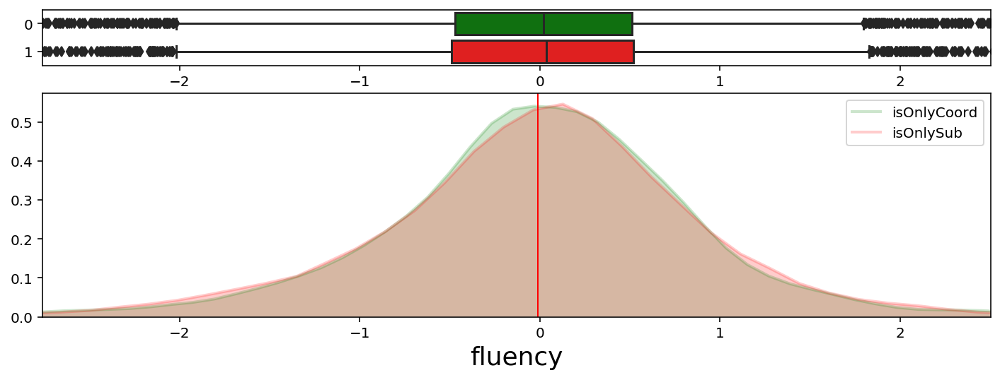

Sample size:  5687    Mean diff:  0.0014    stds:  0.0014   p-value:  0.456895


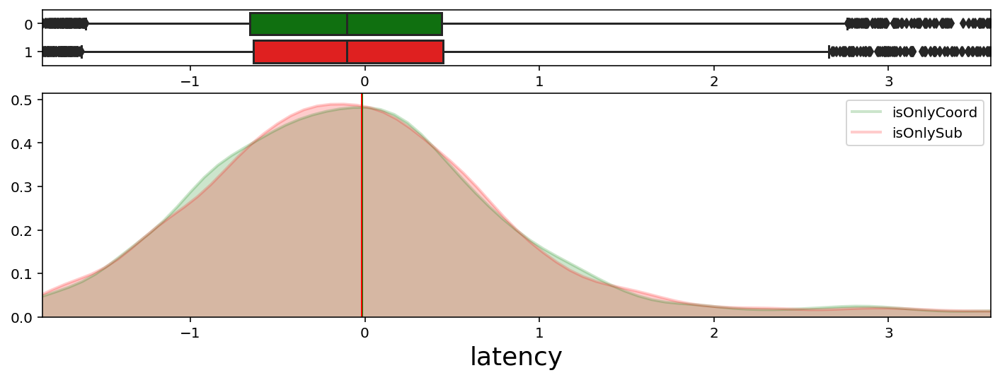

Sample size:  5687    Mean diff:  0.0034    stds:  0.0034   p-value:  0.398093


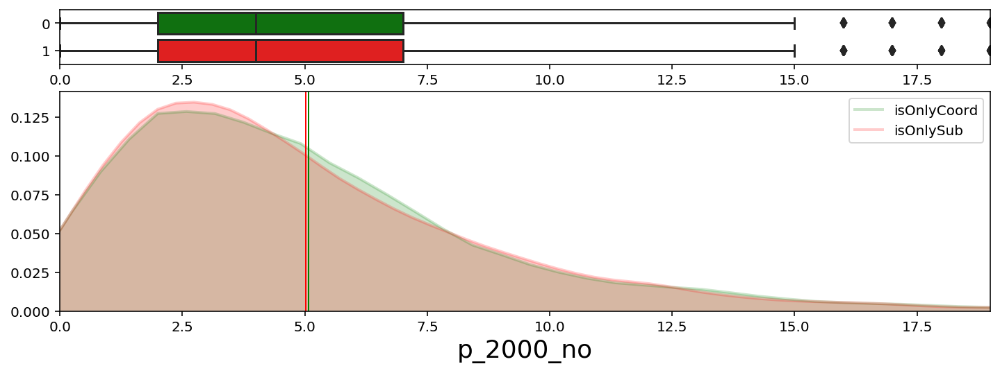

Sample size:  5687    Mean diff:  0.0610    stds:  0.0147   p-value:  0.133824


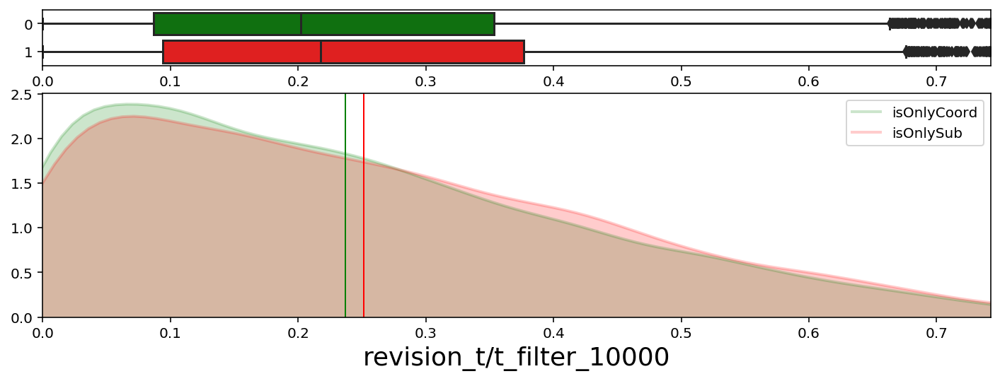

Sample size:  5687    Mean diff:  0.0139    stds:  0.0747   p-value:  8.65337E-09


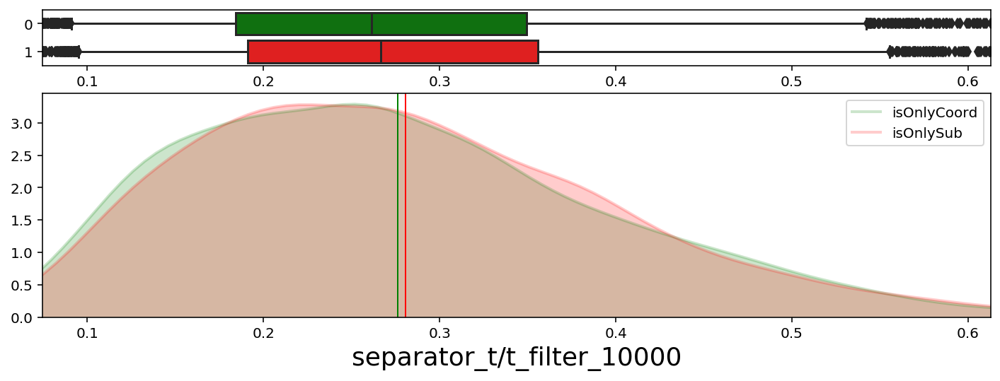

Sample size:  5687    Mean diff:  0.0046    stds:  0.0383   p-value:  0.001927


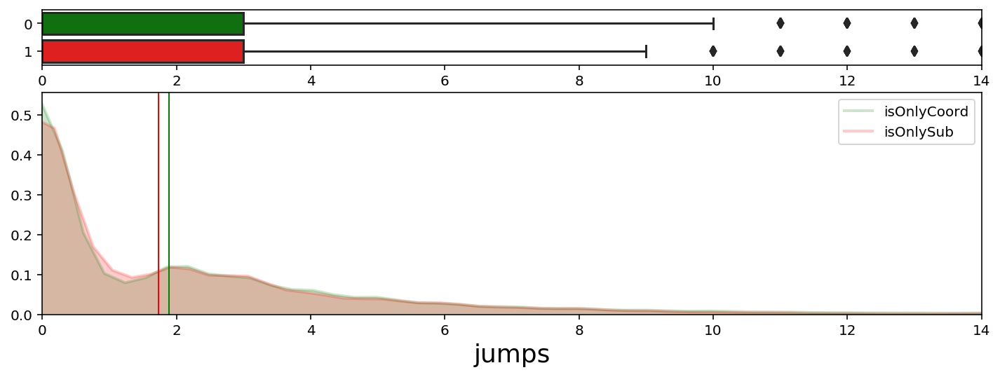

Sample size:  5687    Mean diff:  0.1646    stds:  0.0564   p-value:  0.000010


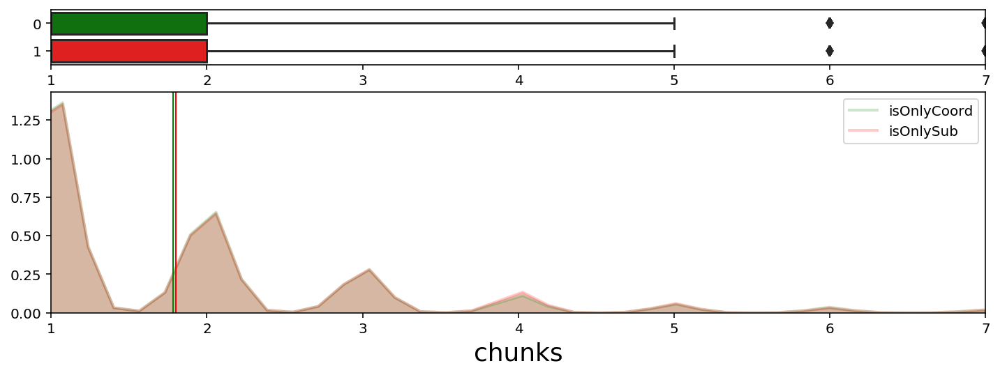

Sample size:  5687    Mean diff:  0.0206    stds:  0.0157   p-value:  0.118465


In [79]:
plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, cr1=isOnlyCoord, cr2=isOnlySub)

# Lexical sophistication & diversity analysis

Sentences with low/high ANC Sophistication show no appreciable differences in fluency or latency or typing speed.

However, sentences with more sophisticated lexicon show a much greater number of pauses >2s (implying one often needs to stop and think before an unusual word), and a lower revision % (implying people do not often go back and replace unusual words once they put the effort to write them in the first place)

The higher number of jumps and chunks suggests that people often do go back to replace easier words with sophisticated ones, however.

When evaluated on the BNC discrepancies are lower, which suggests that the population sample is more familiar with uncommon words from the BNC rather than the ANC

Other sophistication measures were not correlated with anything except:
    
high (Words not on General Service list) -> low fluency (p=0.0008)

In [ ]:
PreModificationWords | PostModificationWords | Lexical.Density |     NDW      |    RTTR
_____________________|_______________________|_________________|______________|_______________
                     |                       |                 |              |
    low fluency      |      LOW fluency      |                 | high fluen.  |  high fluen.
high-ish  latency    |                       | high-ish laten. | low latency  | 
  high revision_t    |                       | low revision_t  | high rev_t   |  high rev_t
                     |   HIGH separator_t    | low separator_t | high sep_t   |  high sep_t
                     |   HIGH jumps/chunks   | high jumps/chks | low jumps/c  |              
                     |                       |                 |              |

## Sophistication

Returning dataframes of len  4235


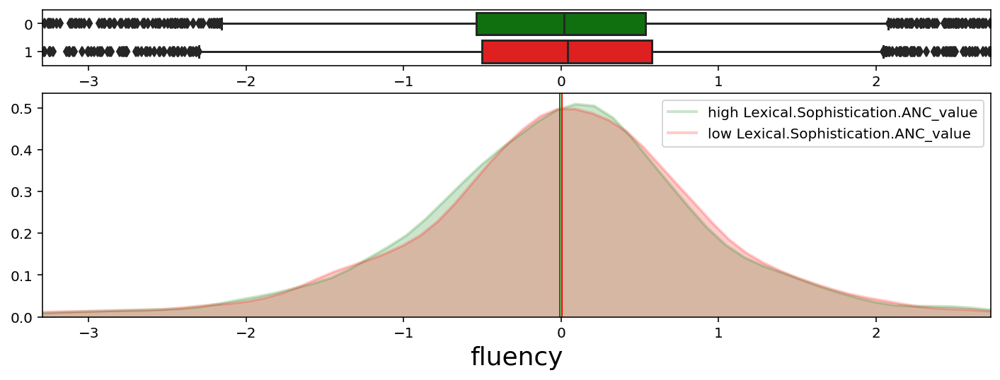

Sample size:  4235    Mean diff:  0.0142    stds:  0.0135   p-value:  0.190271


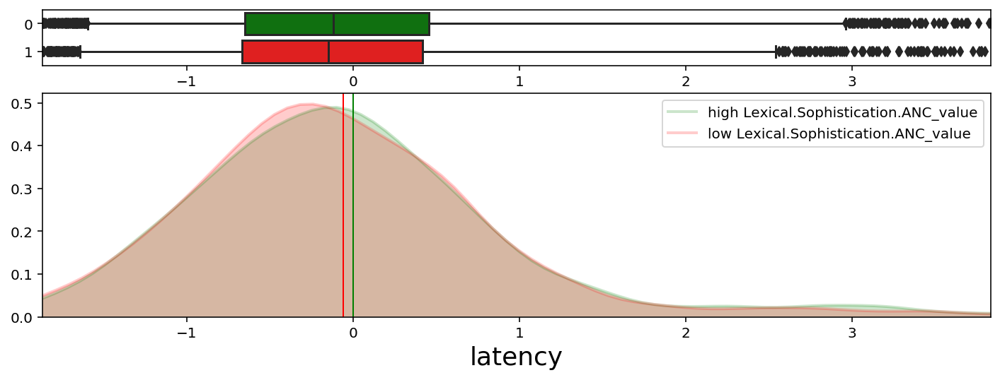

Sample size:  4235    Mean diff:  0.0599    stds:  0.0593   p-value:  0.000057


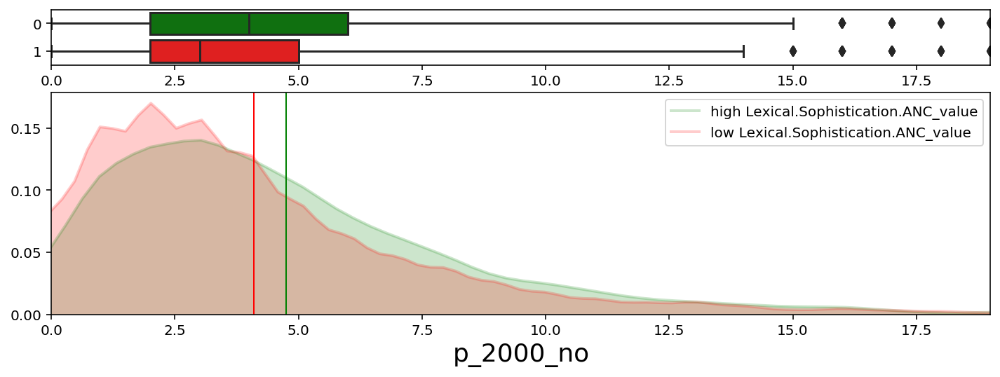

Sample size:  4235    Mean diff:  0.6567    stds:  0.1718   p-value:  2.55498E-29


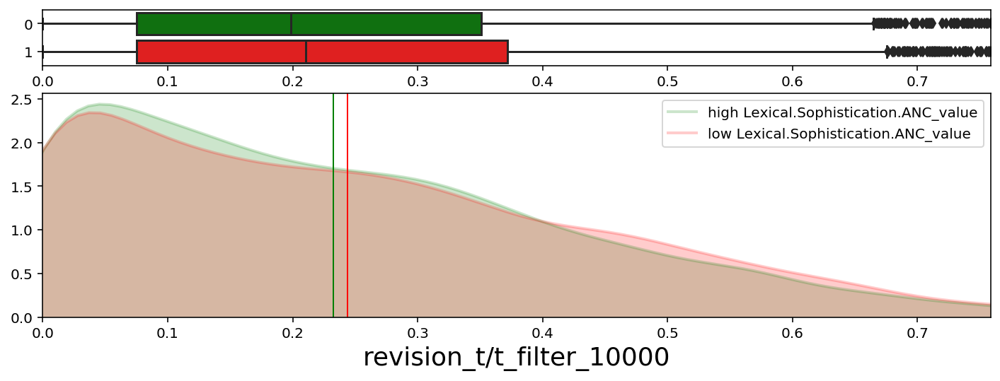

Sample size:  4235    Mean diff:  0.0110    stds:  0.0574   p-value:  0.000094


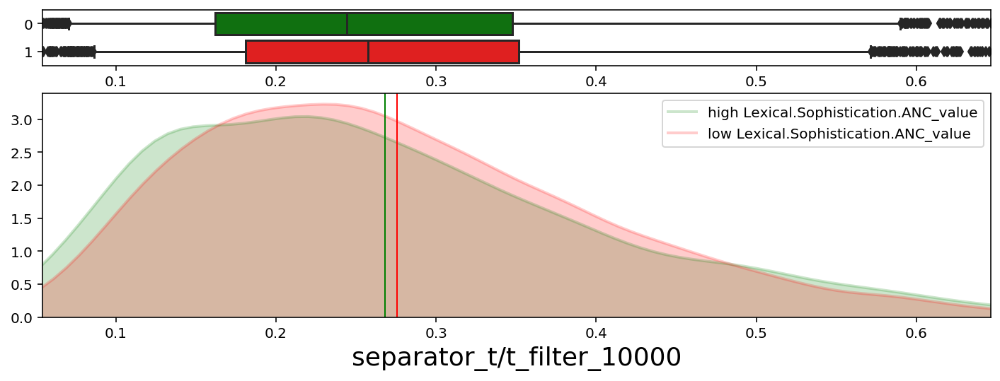

Sample size:  4235    Mean diff:  0.0076    stds:  0.0580   p-value:  0.000080


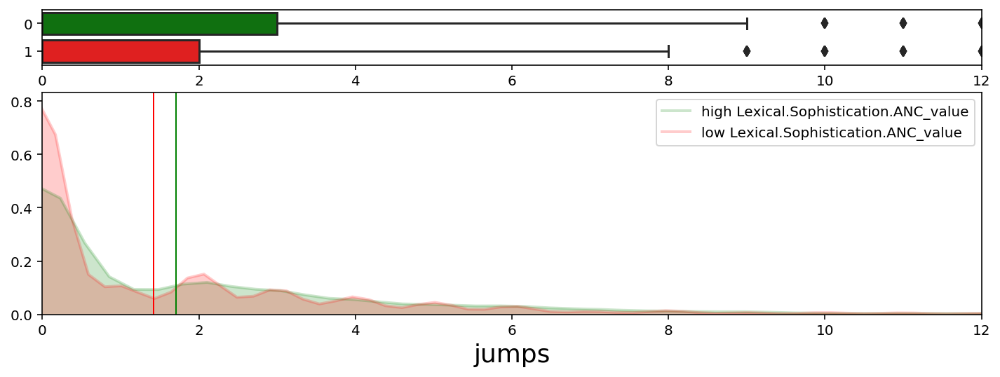

Sample size:  4235    Mean diff:  0.2796    stds:  0.1072   p-value:  1.49795E-12


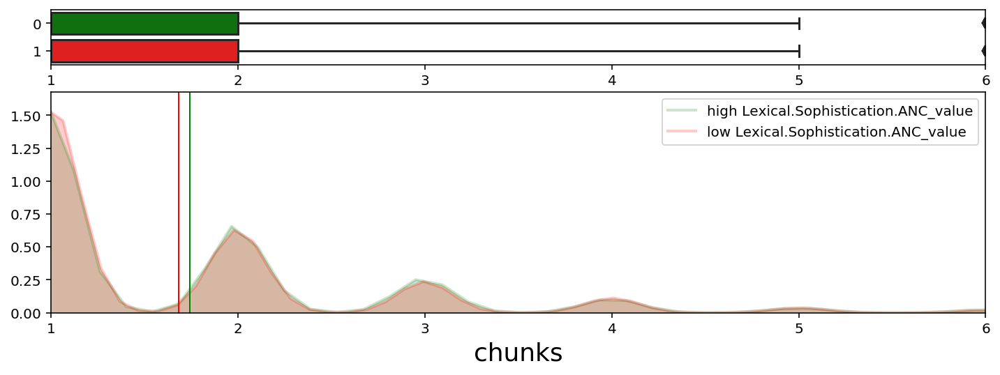

Sample size:  4235    Mean diff:  0.0619    stds:  0.0519   p-value:  0.000363


In [80]:
plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, split_cr='Lexical.Sophistication.ANC_value')

### BNC instead

Returning dataframes of len  4097


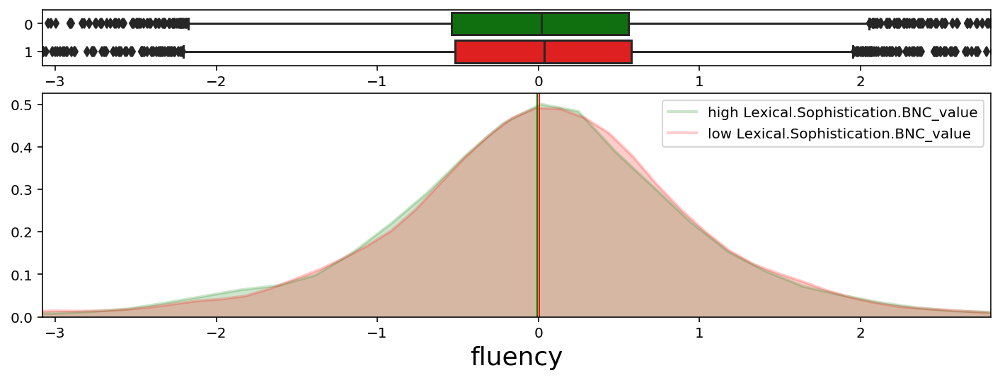

Sample size:  4097    Mean diff:  0.0136    stds:  0.0125   p-value:  0.212210


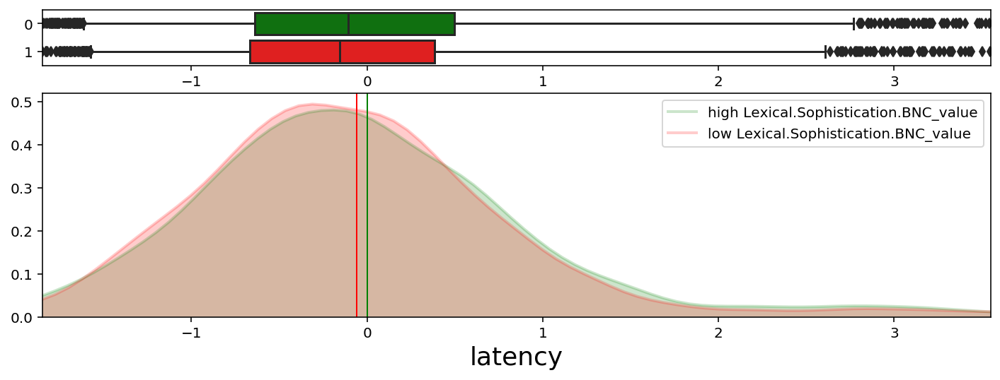

Sample size:  4097    Mean diff:  0.0612    stds:  0.0617   p-value:  0.000040


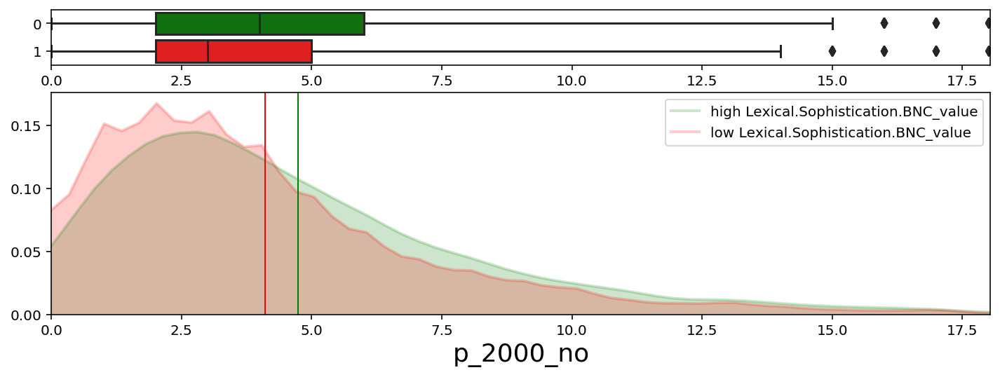

Sample size:  4097    Mean diff:  0.6258    stds:  0.1655   p-value:  1.61160E-26


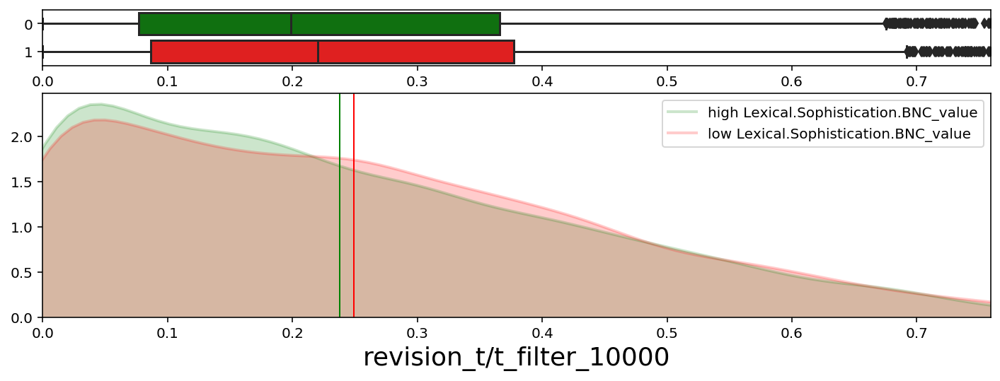

Sample size:  4097    Mean diff:  0.0110    stds:  0.0569   p-value:  0.000134


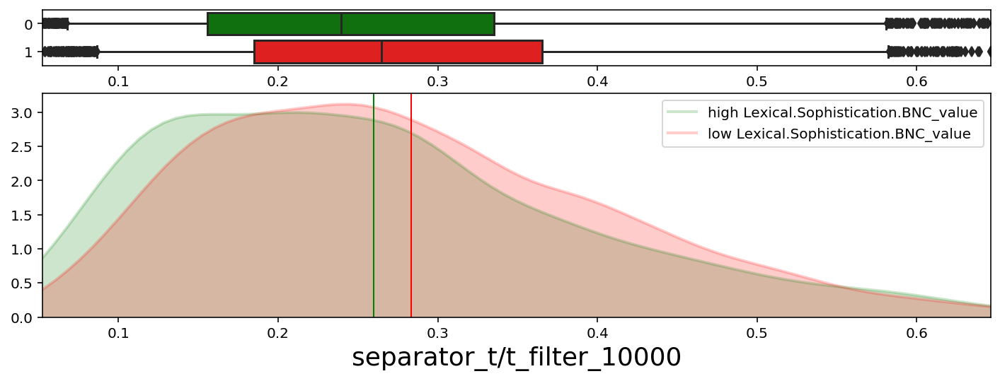

Sample size:  4097    Mean diff:  0.0233    stds:  0.1764   p-value:  7.01959E-30


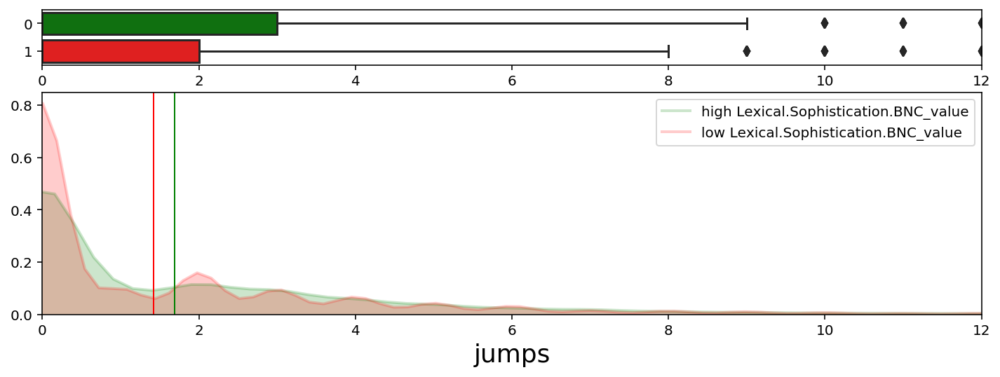

Sample size:  4097    Mean diff:  0.2692    stds:  0.1060   p-value:  5.69080E-12


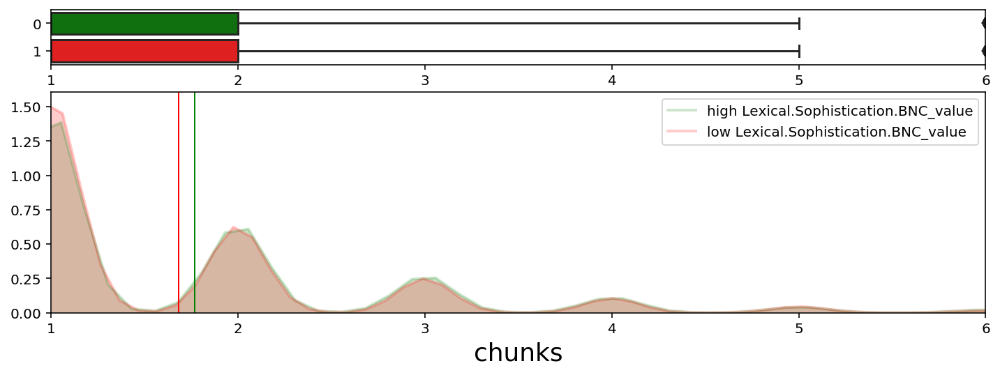

Sample size:  4097    Mean diff:  0.0864    stds:  0.0733   p-value:  1.35116E-06


In [81]:
plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, split_cr='Lexical.Sophistication.BNC_value')

### Anything else

Returning dataframes of len  9802


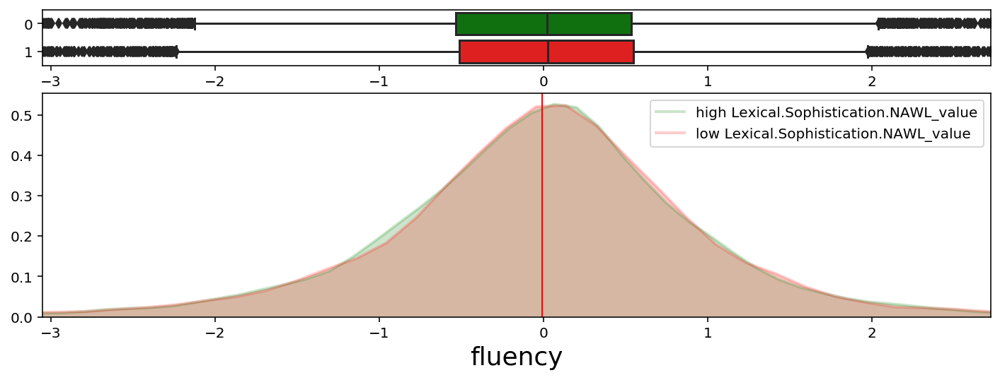

Sample size:  9802    Mean diff:  0.0005    stds:  0.0005   p-value:  0.480805


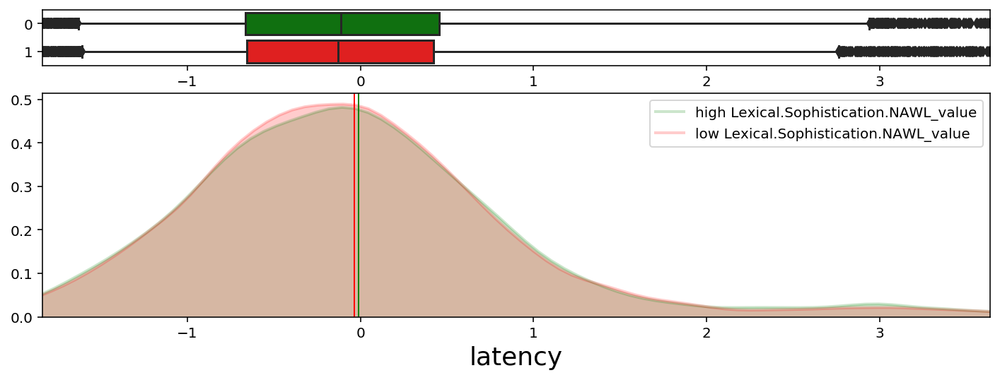

Sample size:  9802    Mean diff:  0.0235    stds:  0.0234   p-value:  0.010361


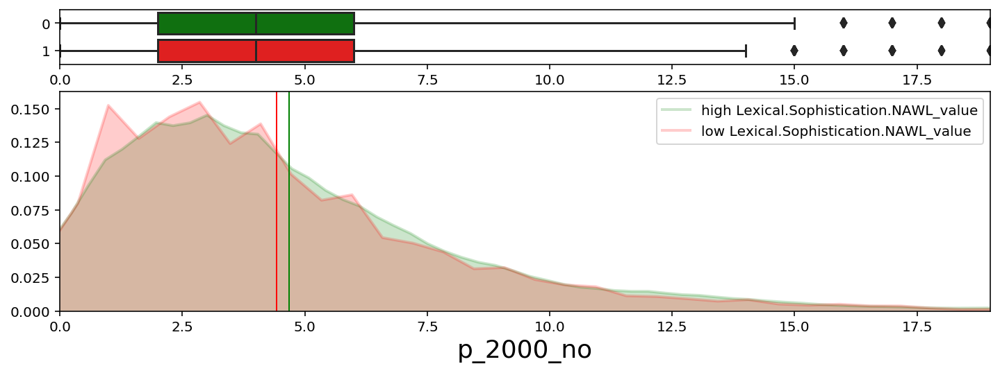

Sample size:  9802    Mean diff:  0.2629    stds:  0.0679   p-value:  9.15142E-12


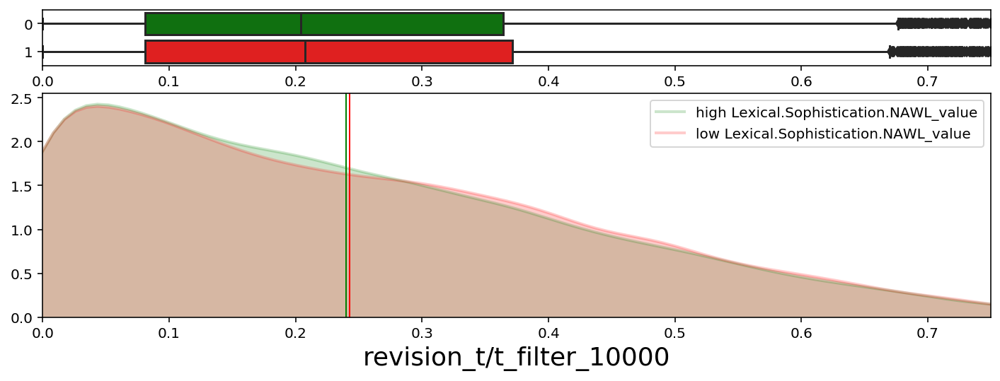

Sample size:  9802    Mean diff:  0.0026    stds:  0.0138   p-value:  0.085377


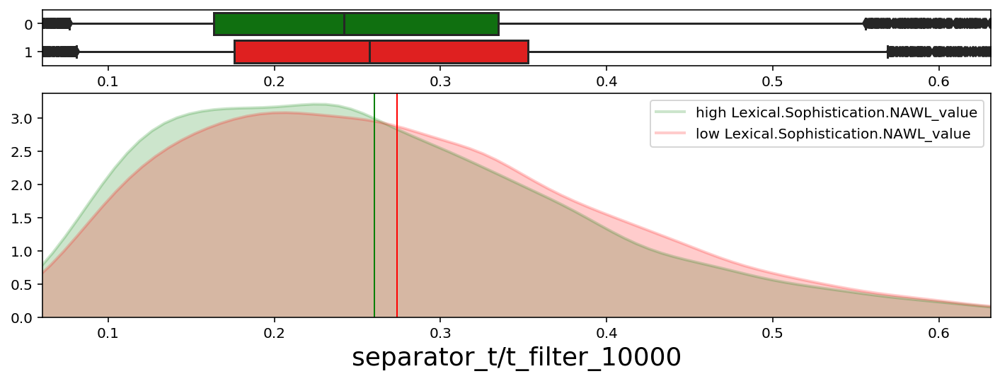

Sample size:  9802    Mean diff:  0.0139    stds:  0.1097   p-value:  9.24971E-28


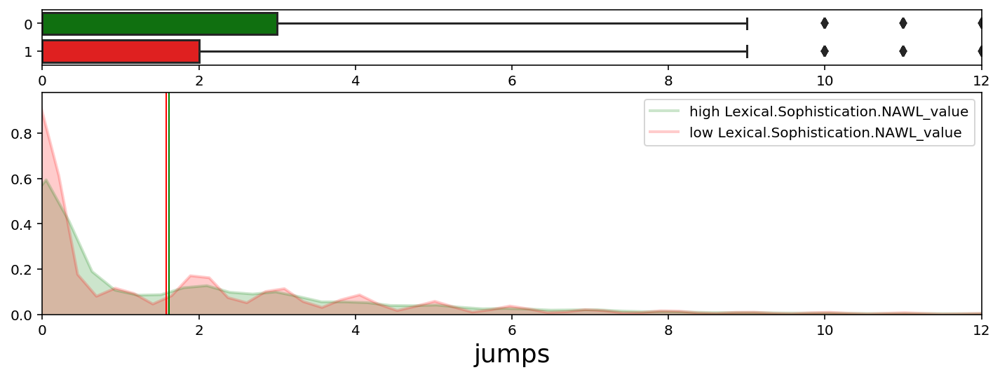

Sample size:  9802    Mean diff:  0.0376    stds:  0.0144   p-value:  0.077235


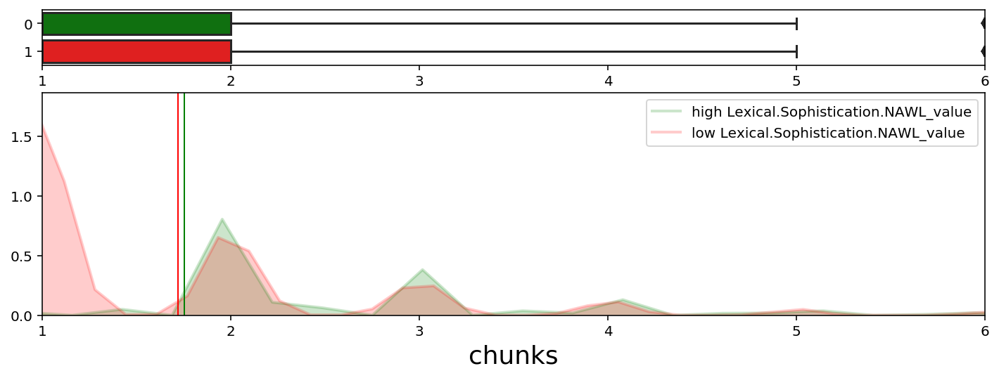

Sample size:  9802    Mean diff:  0.0325    stds:  0.0263   p-value:  0.004586


In [82]:
plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, split_cr='Lexical.Sophistication.NAWL_value')

Returning dataframes of len  4581


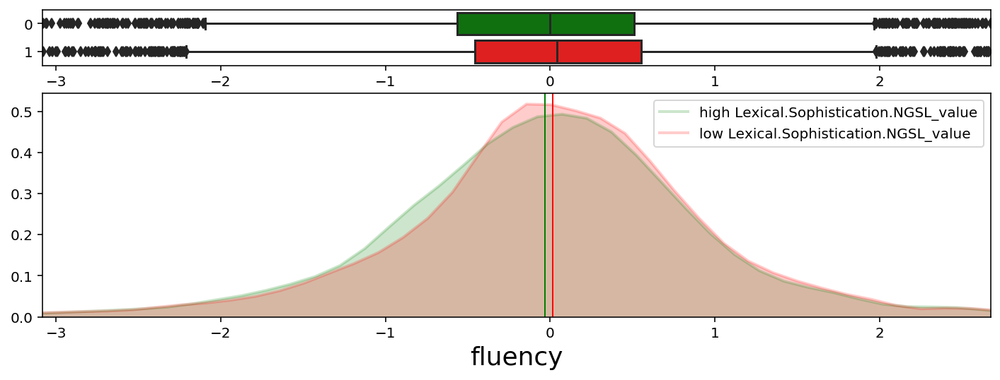

Sample size:  4581    Mean diff:  0.0480    stds:  0.0466   p-value:  0.000803


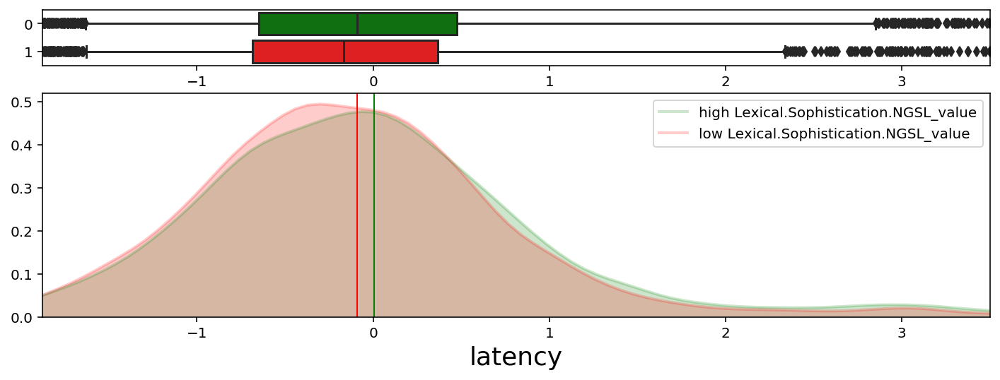

Sample size:  4581    Mean diff:  0.0948    stds:  0.0971   p-value:  2.45011E-11


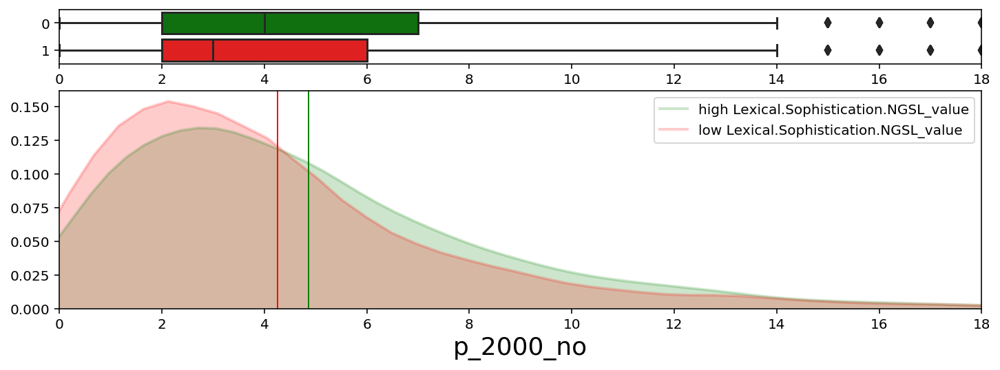

Sample size:  4581    Mean diff:  0.6049    stds:  0.1567   p-value:  1.36549E-26


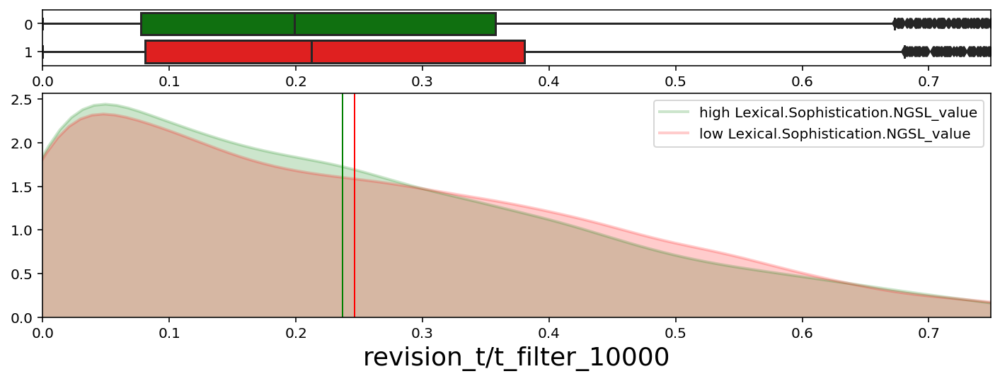

Sample size:  4581    Mean diff:  0.0099    stds:  0.0514   p-value:  0.000253


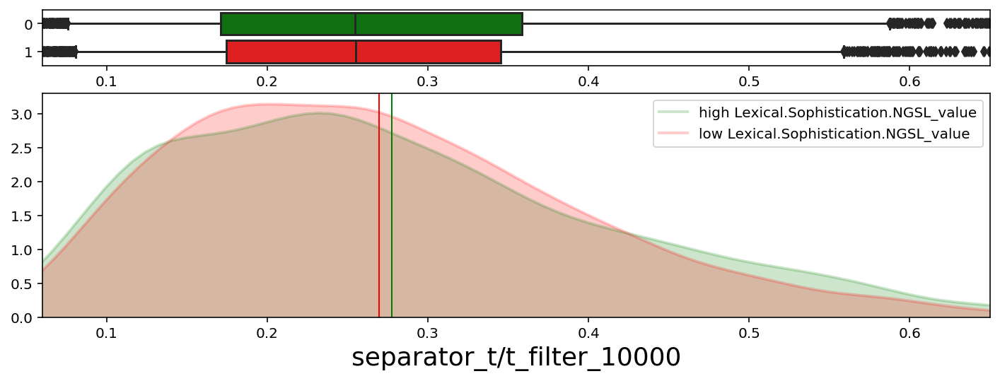

Sample size:  4581    Mean diff:  0.0079    stds:  0.0603   p-value:  0.000022


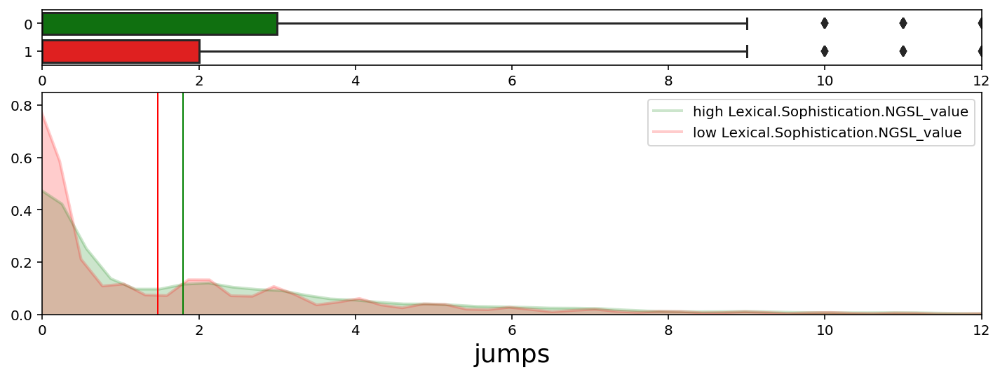

Sample size:  4581    Mean diff:  0.3235    stds:  0.1180   p-value:  6.85326E-16


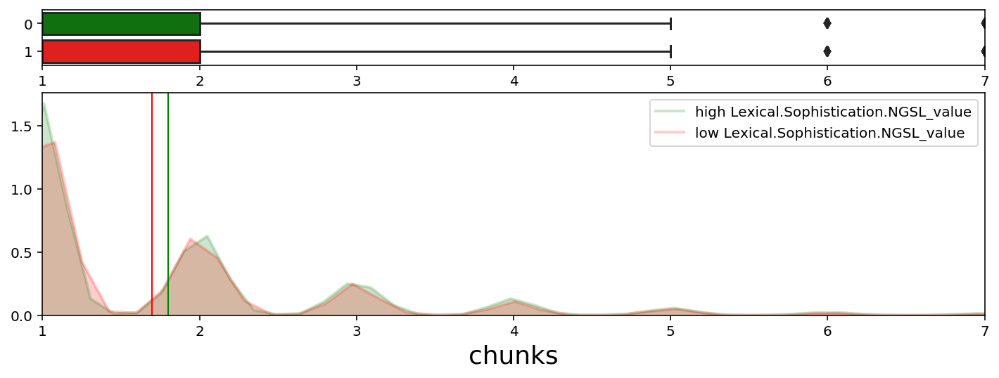

Sample size:  4581    Mean diff:  0.1002    stds:  0.0781   p-value:  6.17583E-08


In [83]:
plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, split_cr='Lexical.Sophistication.NGSL_value')

## Diversity & density

In [ ]:
PreModificationWords | PostModificationWords | Lexical.Density |     NDW      |    RTTR
_____________________|_______________________|_________________|______________|_______________
                     |                       |                 |              |
    low fluency      |      LOW fluency      |                 | high fluen.  |  high fluen.
high-ish  latency    |                       | high-ish laten. | low latency  | 
  LOW  revision_t    |                       | low revision_t  | high rev_t   |  high rev_t
                     |   HIGH separator_t    | LOW separator_t | HIGH sep_t   |  HIGH sep_t
                     |   HIGH jumps/chunks   | HIGH jumps/chks | low jumps/c  |              
                     |                       |                 |              |
low/high-ish = 0.01 < p < 0.05
low/high = 0.0001 < p < 0.01
LOW/HIGH = p < 0.0001

metrics CNDW, TTR, CTTR were not statistically significant in interesting ways

### Plots

In [84]:
relevant_metrics = [
 'NounPhrasePreModificationWords_value',
 'NounPhrasePostModificationWords_value',
 'Lexical.Density_value',
 'n_NDW_value',
 'n_RTTR_value']

other_metrics = [
       'Lexical.Diversity.CNDW_value', 
       'Lexical.Diversity.TTR_value',
       'Lexical.Diversity.CTTR_value']

Returning dataframes of len  6040


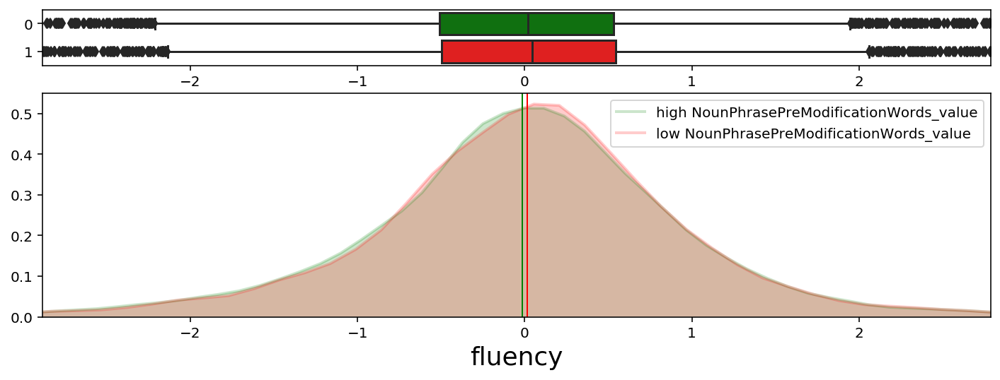

Sample size:  6040    Mean diff:  0.0306    stds:  0.0299   p-value:  0.009985


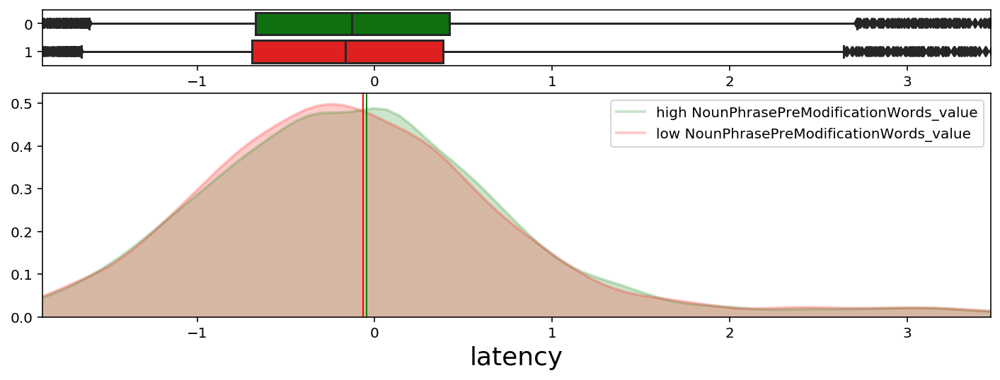

Sample size:  6040    Mean diff:  0.0222    stds:  0.0226   p-value:  0.039345


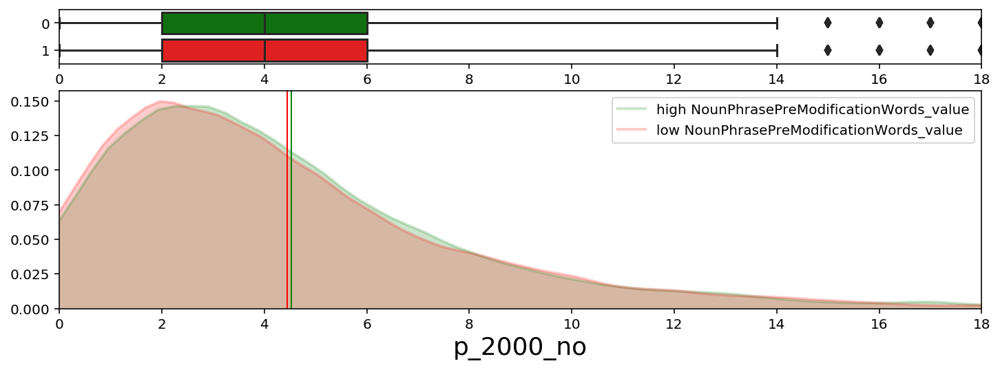

Sample size:  6040    Mean diff:  0.0813    stds:  0.0213   p-value:  0.048657


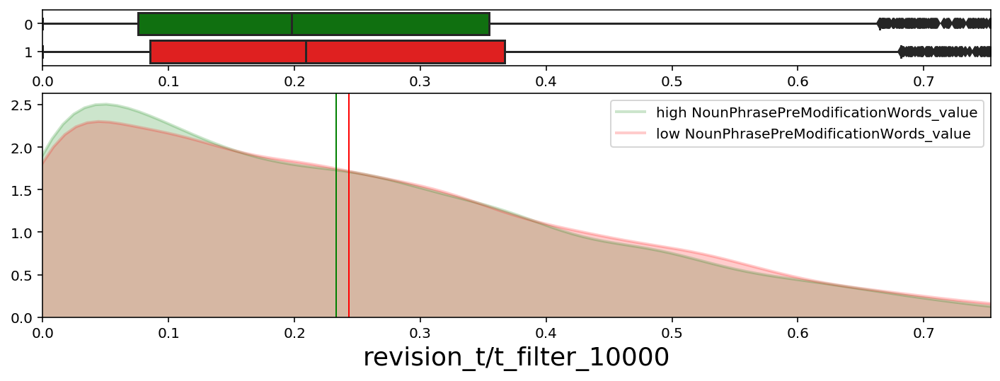

Sample size:  6040    Mean diff:  0.0099    stds:  0.0521   p-value:  0.000026


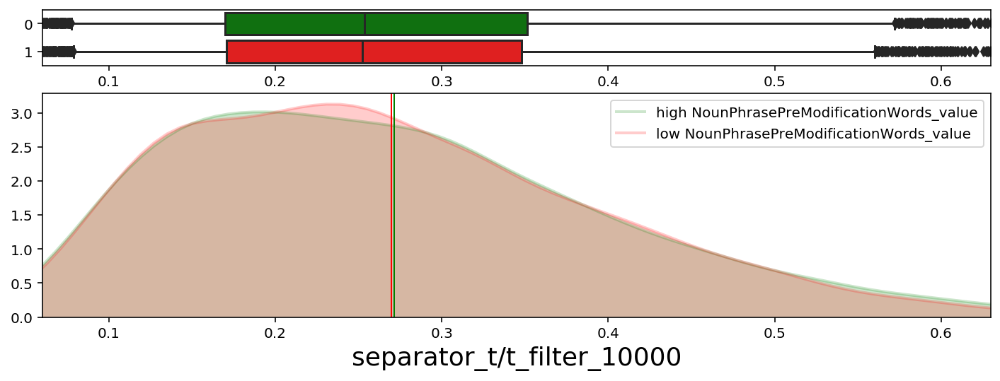

Sample size:  6040    Mean diff:  0.0018    stds:  0.0140   p-value:  0.138729


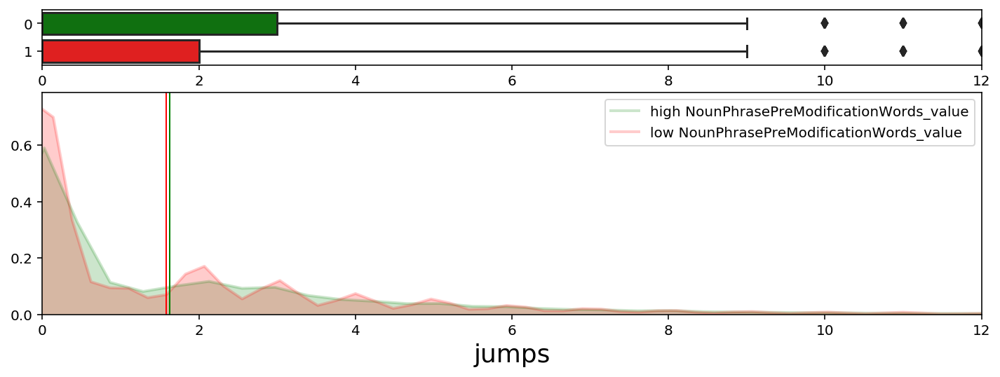

Sample size:  6040    Mean diff:  0.0512    stds:  0.0193   p-value:  0.067065


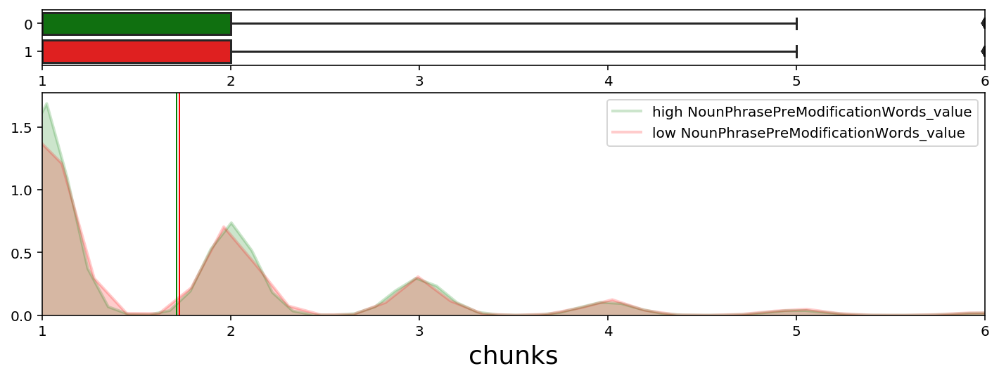

Sample size:  6040    Mean diff:  0.0144    stds:  0.0121   p-value:  0.173491
Returning dataframes of len  2682


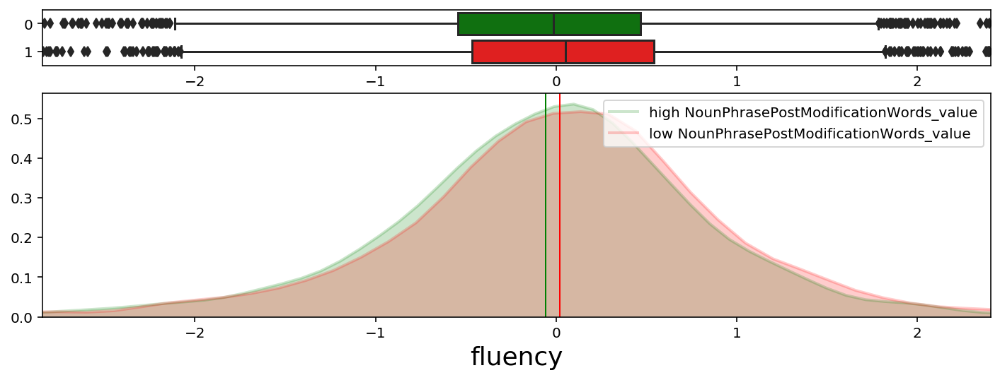

Sample size:  2682    Mean diff:  0.0757    stds:  0.0771   p-value:  0.000033


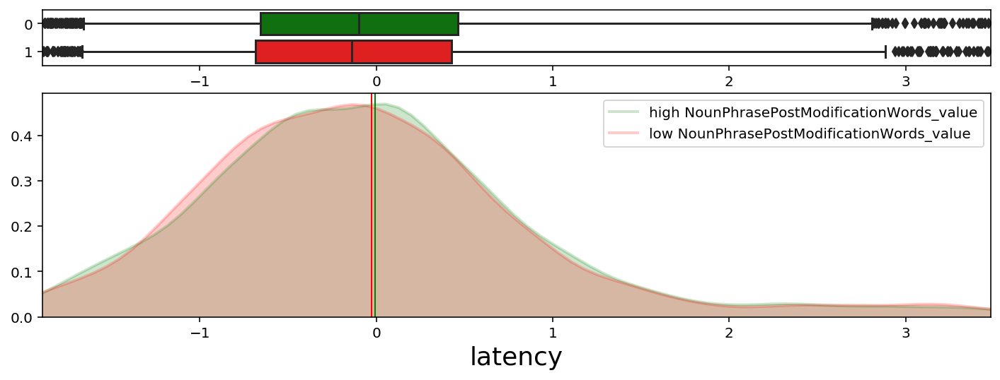

Sample size:  2682    Mean diff:  0.0191    stds:  0.0186   p-value:  0.168078


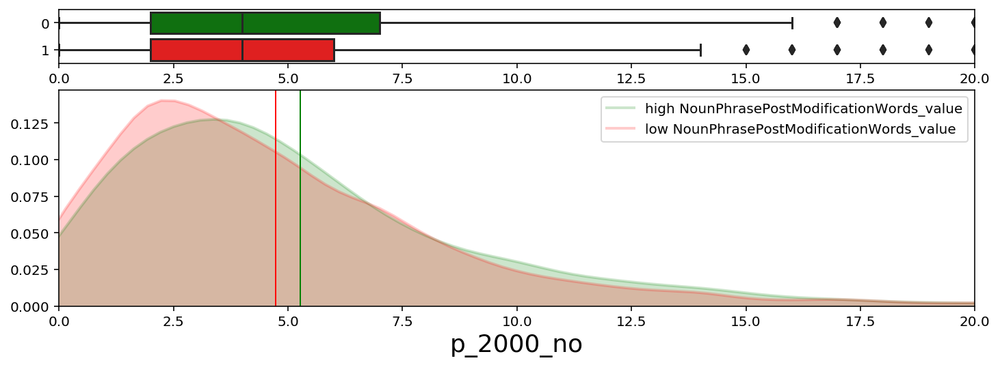

Sample size:  2682    Mean diff:  0.5343    stds:  0.1332   p-value:  2.61721E-12


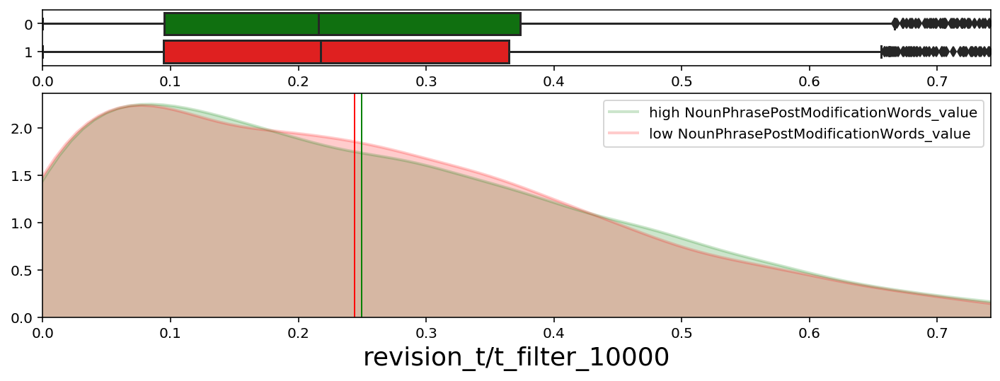

Sample size:  2682    Mean diff:  0.0052    stds:  0.0283   p-value:  0.071355


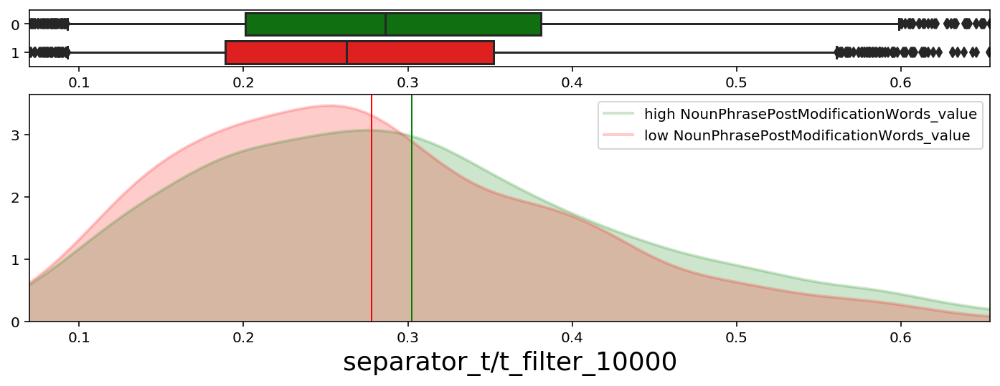

Sample size:  2682    Mean diff:  0.0242    stds:  0.1910   p-value:  2.30659E-23


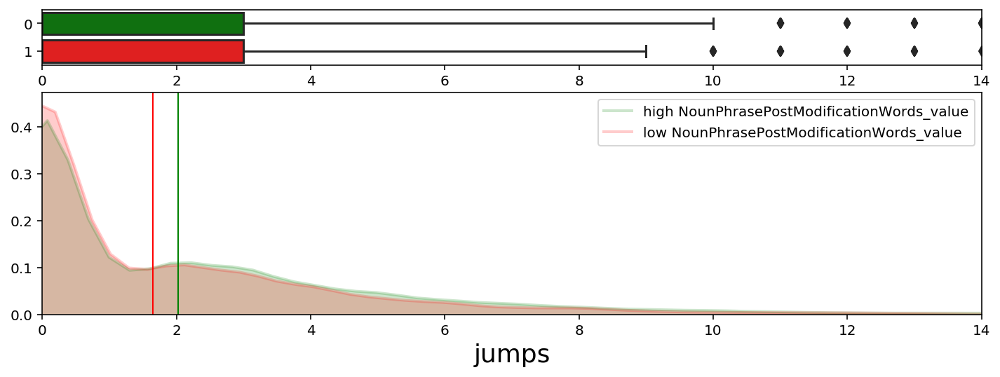

Sample size:  2682    Mean diff:  0.3840    stds:  0.1307   p-value:  6.56891E-12


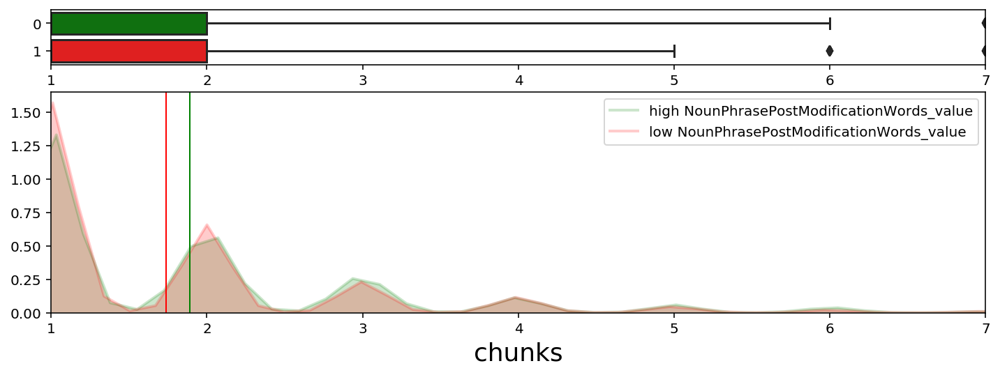

Sample size:  2682    Mean diff:  0.1521    stds:  0.1108   p-value:  4.80157E-09
Returning dataframes of len  4784


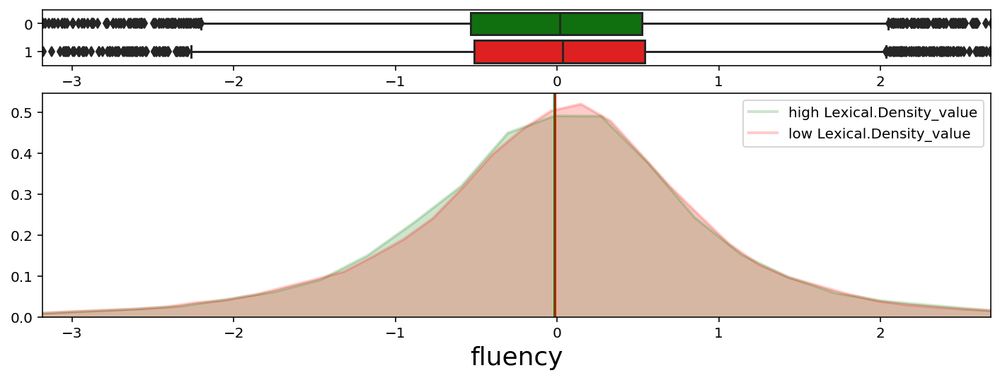

Sample size:  4784    Mean diff:  0.0054    stds:  0.0050   p-value:  0.364463


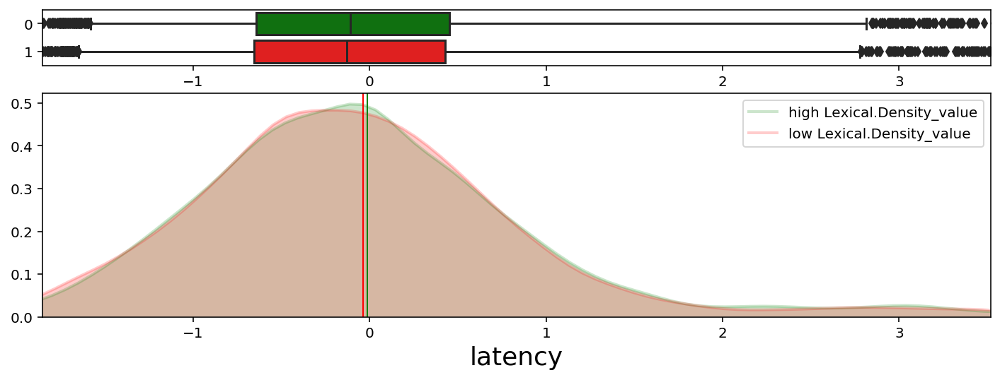

Sample size:  4784    Mean diff:  0.0236    stds:  0.0235   p-value:  0.051751


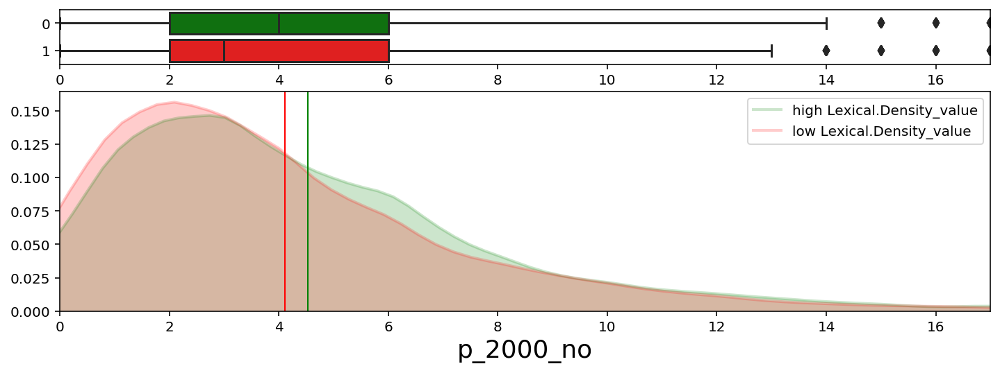

Sample size:  4784    Mean diff:  0.4107    stds:  0.1124   p-value:  3.75658E-15


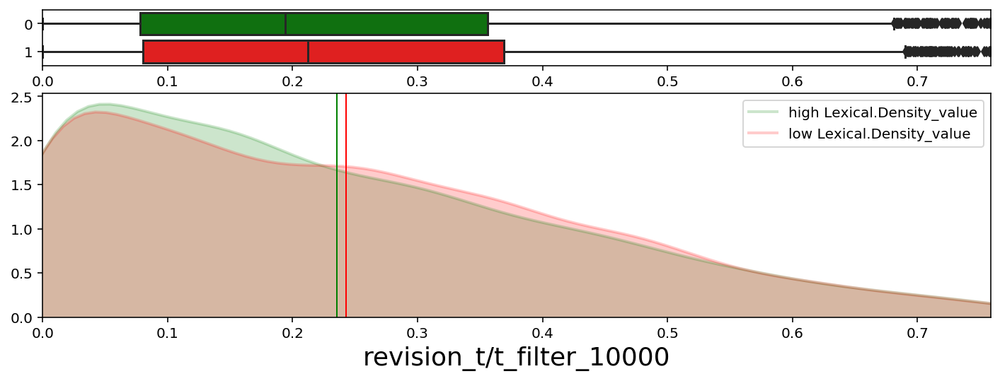

Sample size:  4784    Mean diff:  0.0072    stds:  0.0376   p-value:  0.004652


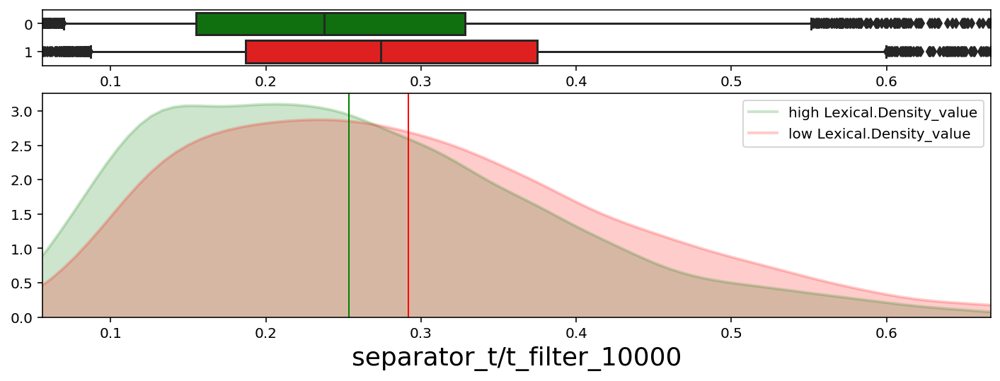

Sample size:  4784    Mean diff:  0.0380    stds:  0.2908   p-value:  2.94543E-90


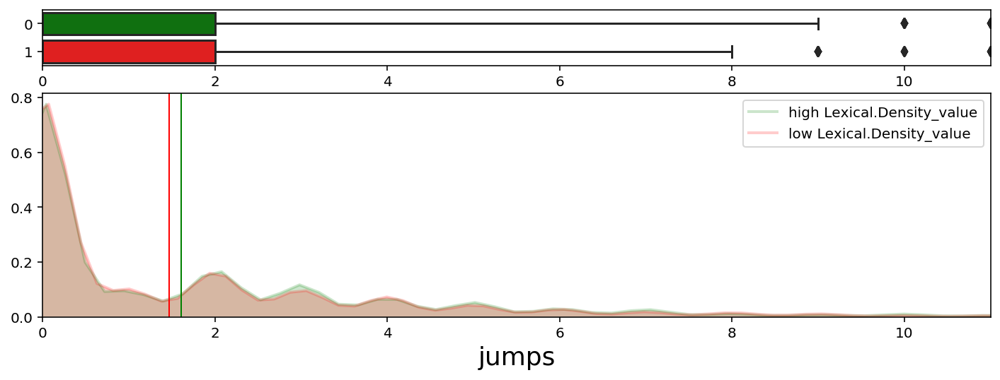

Sample size:  4784    Mean diff:  0.1413    stds:  0.0555   p-value:  0.000063


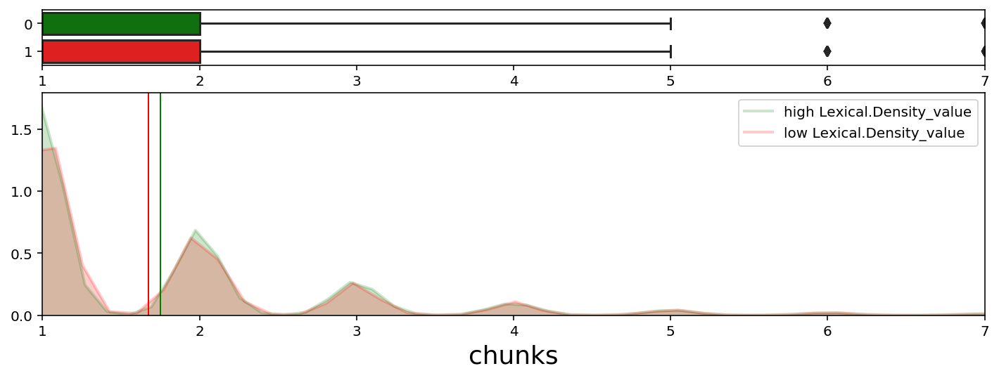

Sample size:  4784    Mean diff:  0.0719    stds:  0.0593   p-value:  0.000020
Returning dataframes of len  3831


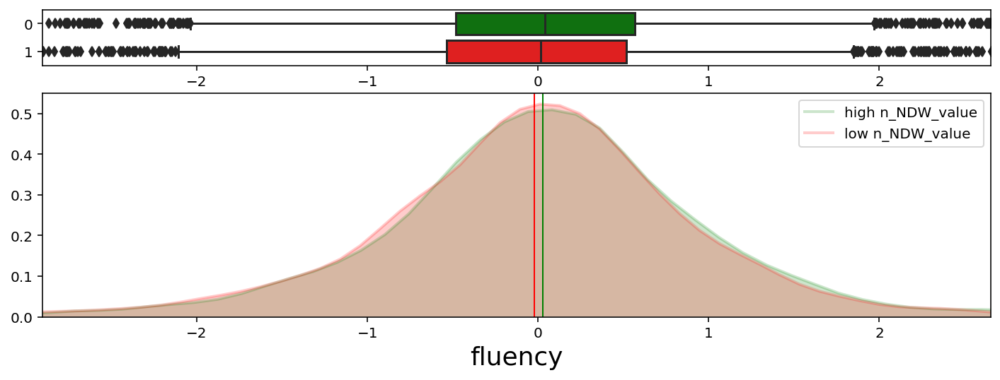

Sample size:  3831    Mean diff:  0.0494    stds:  0.0494   p-value:  0.001118


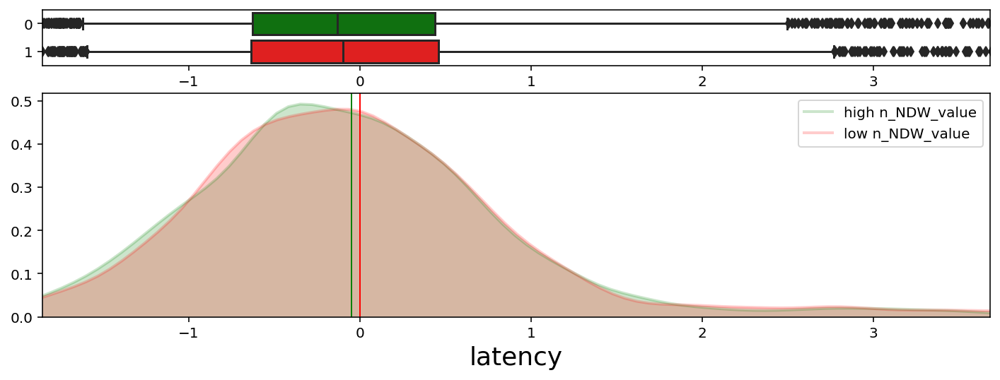

Sample size:  3831    Mean diff:  0.0466    stds:  0.0481   p-value:  0.001462


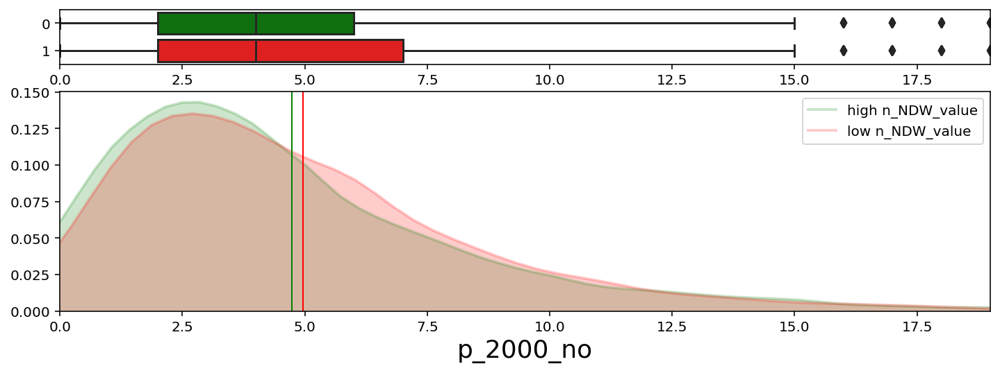

Sample size:  3831    Mean diff:  0.2310    stds:  0.0576   p-value:  0.000180


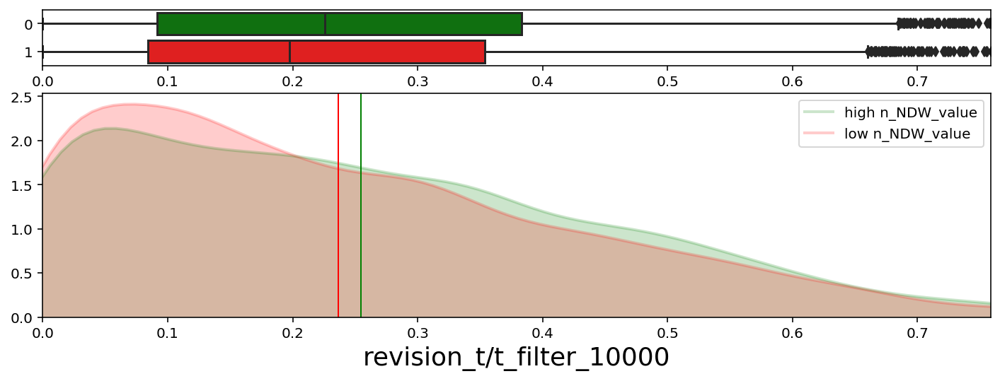

Sample size:  3831    Mean diff:  0.0184    stds:  0.0969   p-value:  1.01257E-09


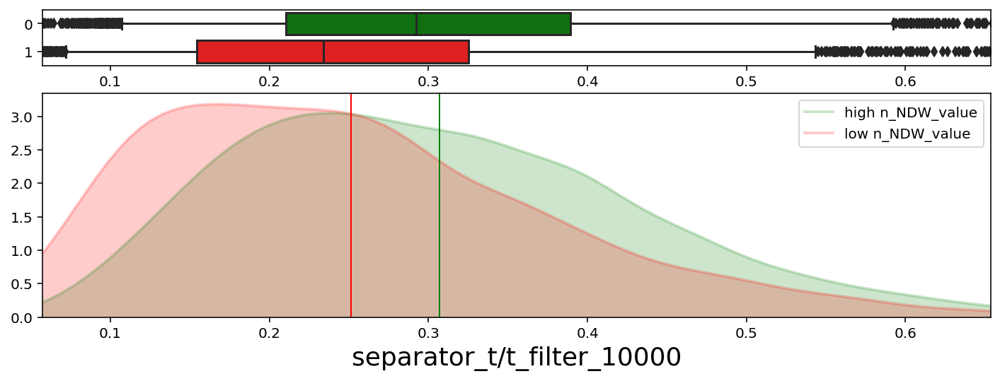

Sample size:  3831    Mean diff:  0.0556    stds:  0.4415   p-value:  1.03934E-164


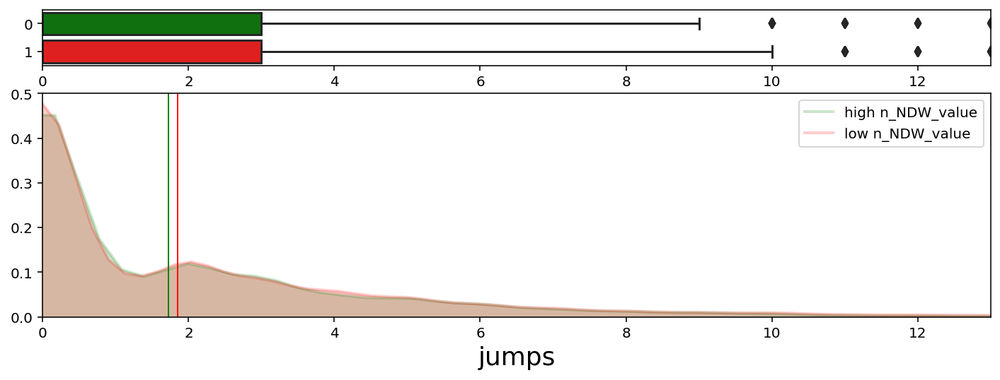

Sample size:  3831    Mean diff:  0.1279    stds:  0.0446   p-value:  0.002873


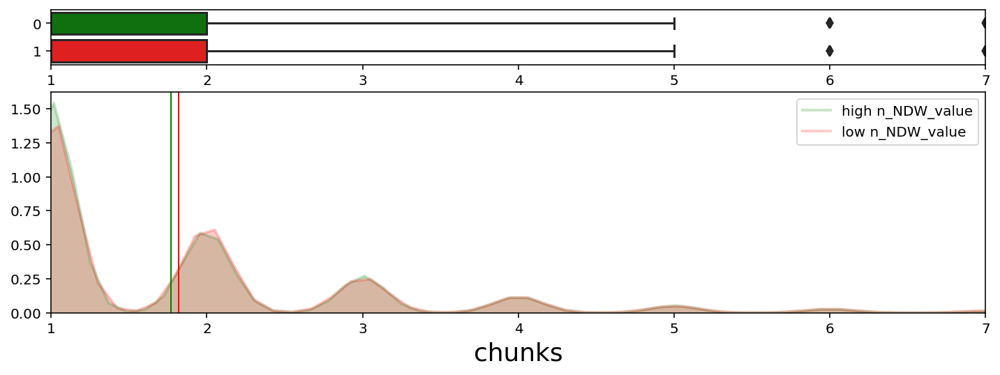

Sample size:  3831    Mean diff:  0.0472    stds:  0.0366   p-value:  0.011788
Returning dataframes of len  4012


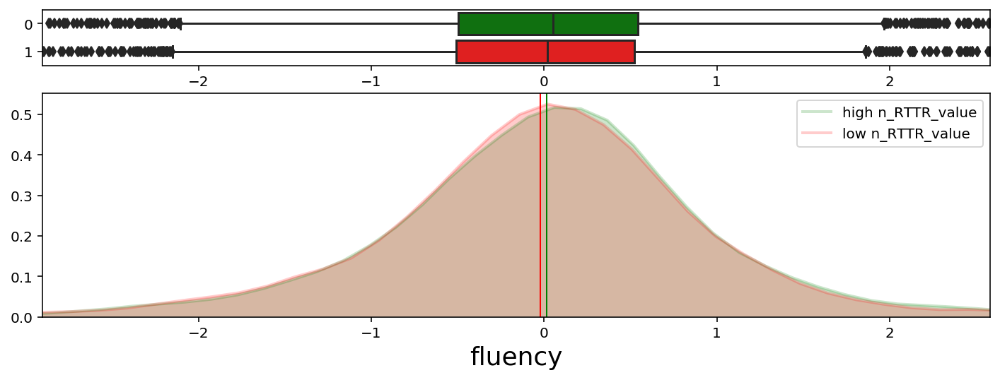

Sample size:  4012    Mean diff:  0.0332    stds:  0.0329   p-value:  0.018705


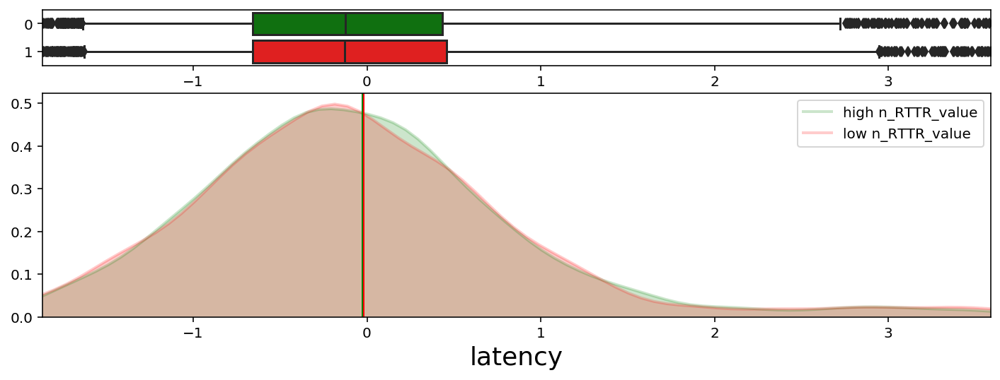

Sample size:  4012    Mean diff:  0.0095    stds:  0.0095   p-value:  0.272896


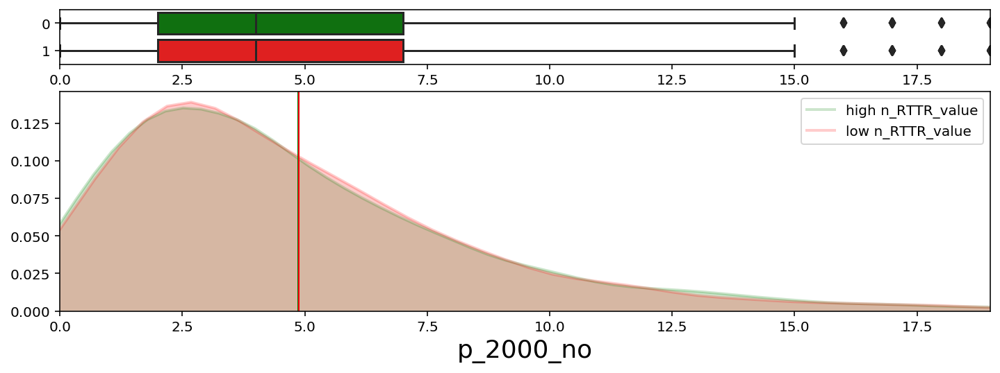

Sample size:  4012    Mean diff:  0.0095    stds:  0.0023   p-value:  0.441558


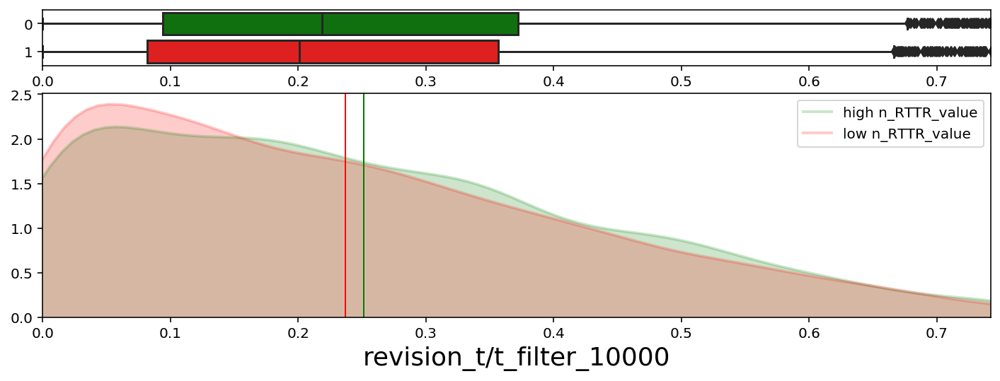

Sample size:  4012    Mean diff:  0.0139    stds:  0.0740   p-value:  1.39630E-06


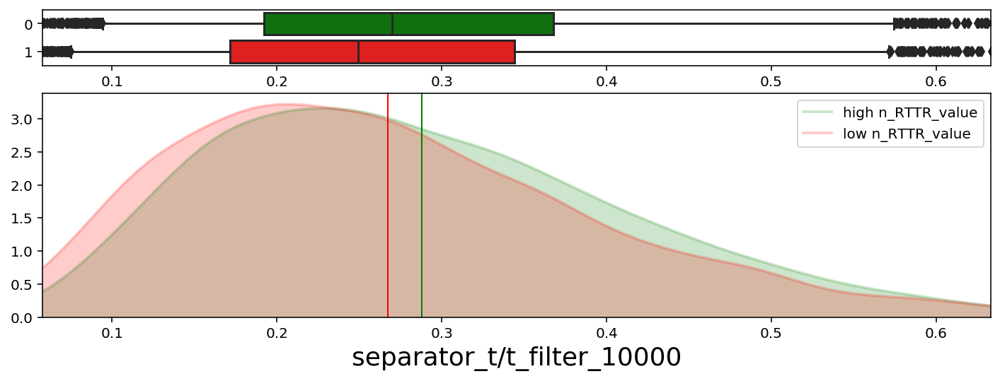

Sample size:  4012    Mean diff:  0.0207    stds:  0.1631   p-value:  2.60999E-25


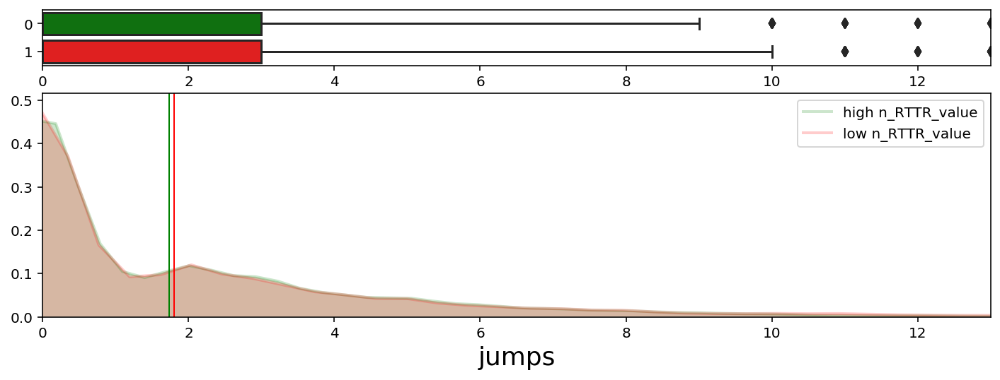

Sample size:  4012    Mean diff:  0.0688    stds:  0.0240   p-value:  0.064094


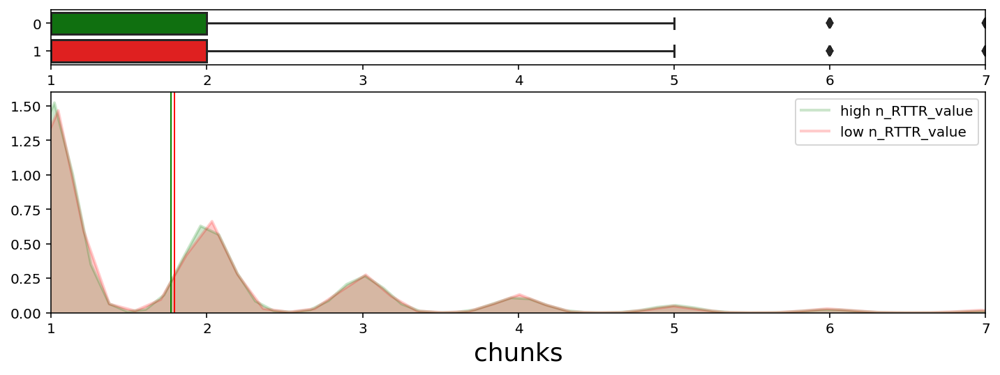

Sample size:  4012    Mean diff:  0.0242    stds:  0.0188   p-value:  0.116655


In [85]:
for m in relevant_metrics:
    plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, split_cr=m)
    

Returning dataframes of len  2414


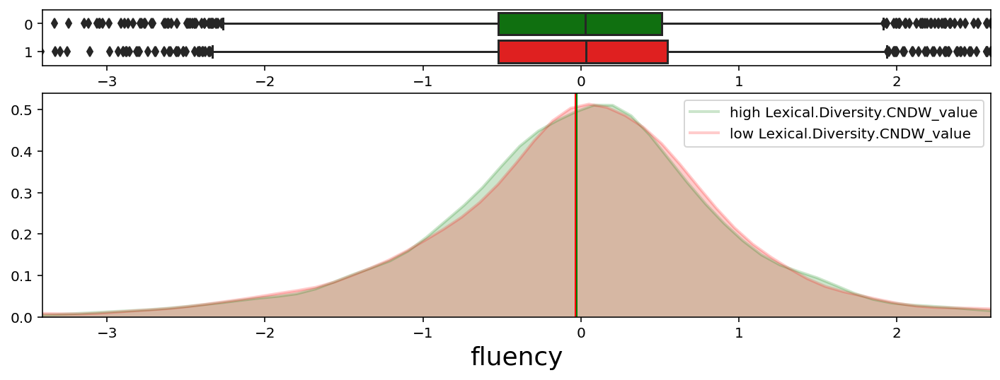

Sample size:  2414    Mean diff:  0.0081    stds:  0.0077   p-value:  0.351882


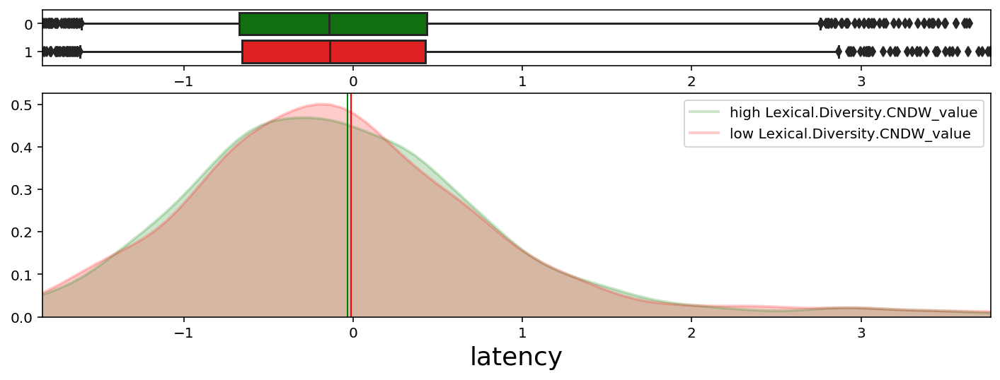

Sample size:  2414    Mean diff:  0.0218    stds:  0.0215   p-value:  0.144968


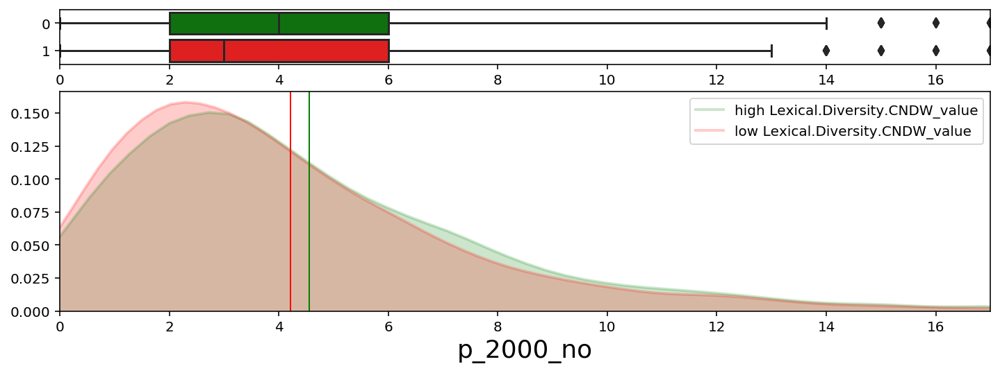

Sample size:  2414    Mean diff:  0.3509    stds:  0.0961   p-value:  1.16233E-06


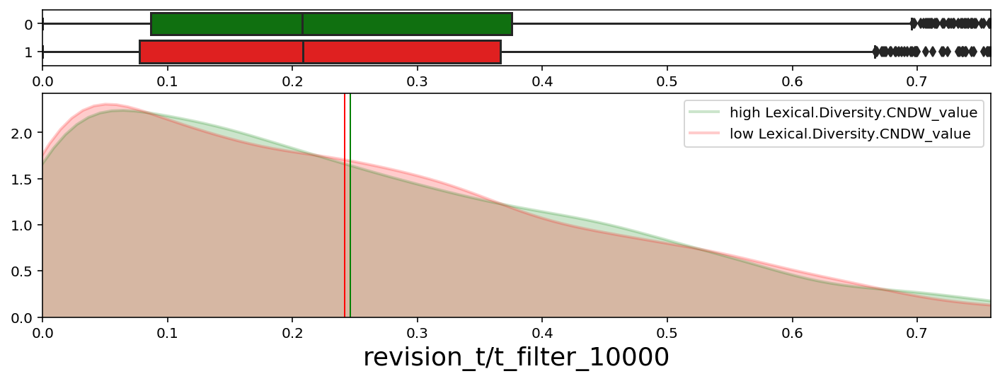

Sample size:  2414    Mean diff:  0.0045    stds:  0.0232   p-value:  0.127424


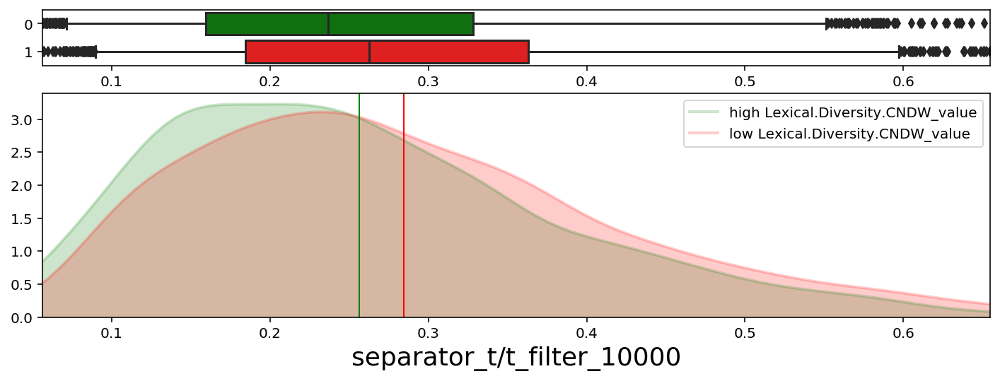

Sample size:  2414    Mean diff:  0.0281    stds:  0.2168   p-value:  8.66933E-27


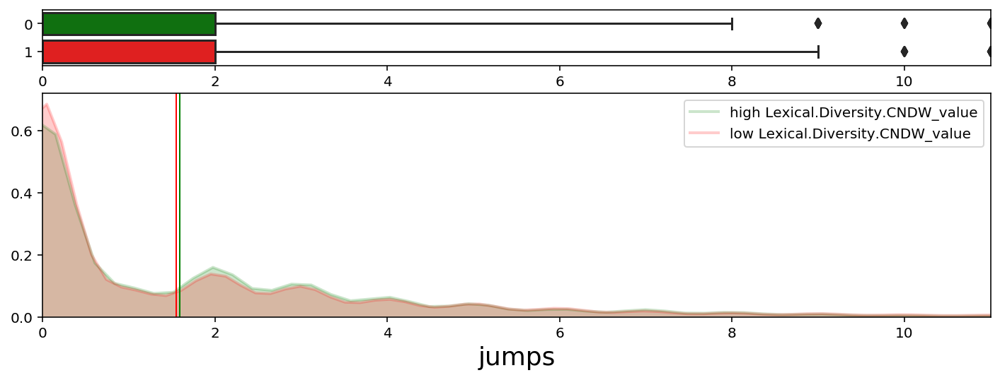

Sample size:  2414    Mean diff:  0.0414    stds:  0.0163   p-value:  0.212149


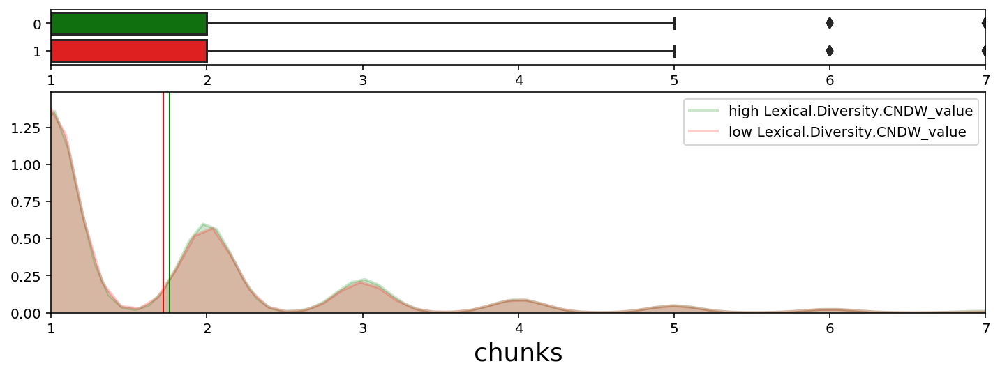

Sample size:  2414    Mean diff:  0.0414    stds:  0.0334   p-value:  0.050536
Returning dataframes of len  2402


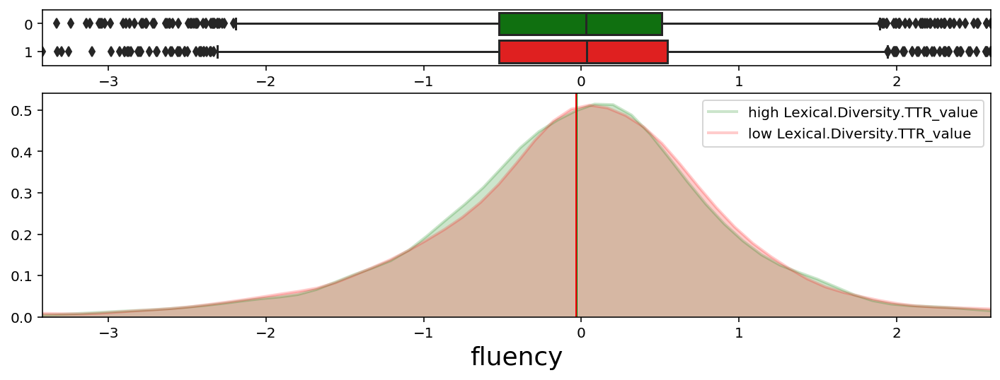

Sample size:  2402    Mean diff:  0.0025    stds:  0.0024   p-value:  0.453285


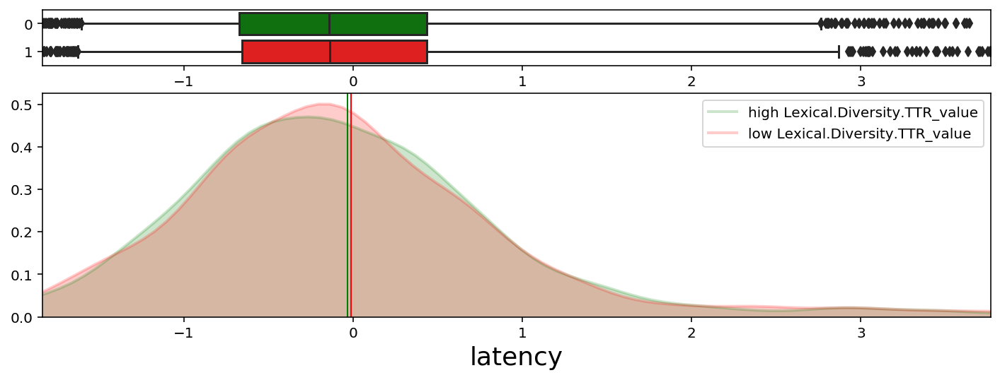

Sample size:  2402    Mean diff:  0.0207    stds:  0.0203   p-value:  0.159461


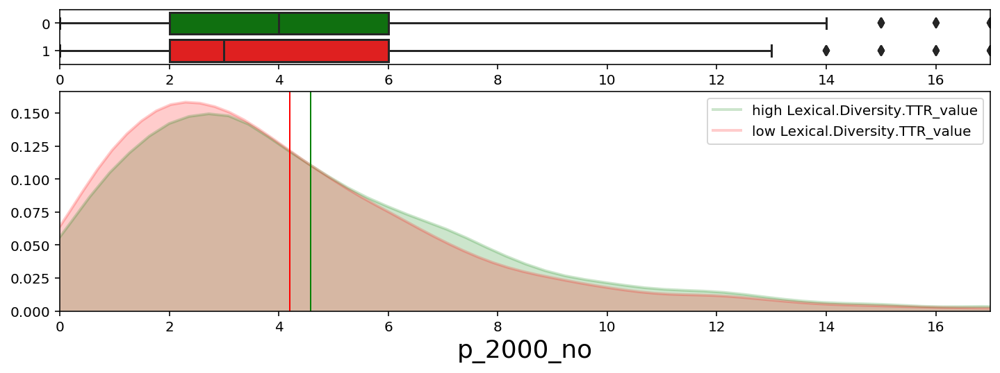

Sample size:  2402    Mean diff:  0.3780    stds:  0.1037   p-value:  1.87098E-07


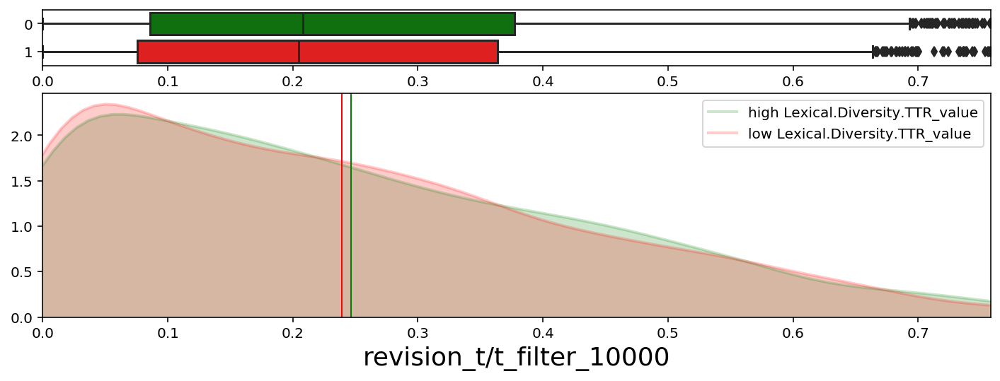

Sample size:  2402    Mean diff:  0.0072    stds:  0.0373   p-value:  0.033644


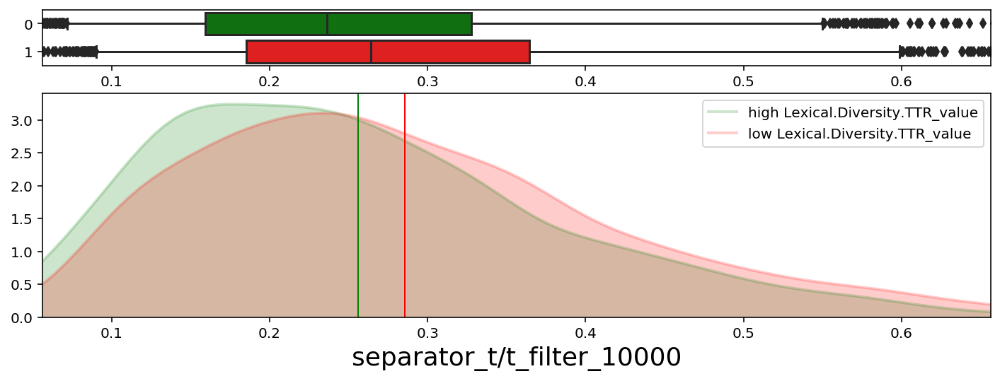

Sample size:  2402    Mean diff:  0.0299    stds:  0.2306   p-value:  6.45923E-30


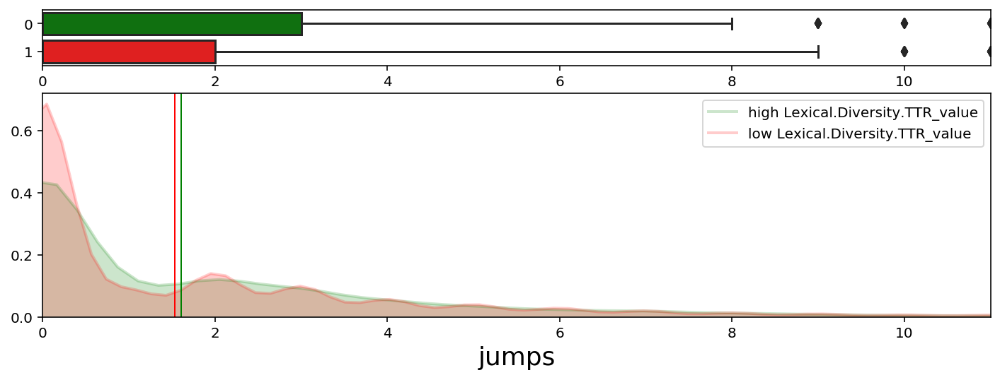

Sample size:  2402    Mean diff:  0.0779    stds:  0.0307   p-value:  0.066150


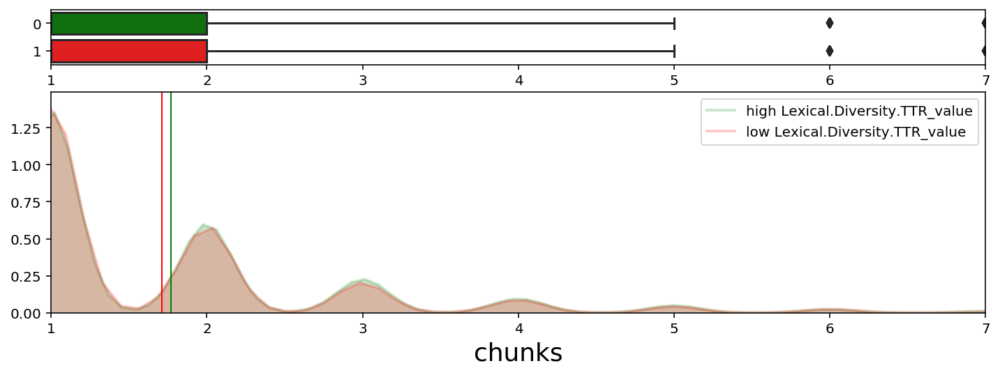

Sample size:  2402    Mean diff:  0.0595    stds:  0.0480   p-value:  0.009323
Returning dataframes of len  952


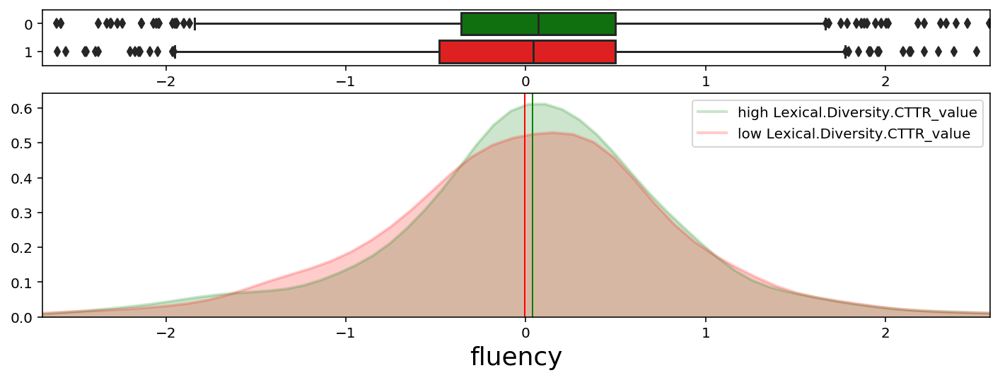

Sample size:  952    Mean diff:  0.0428    stds:  0.0472   p-value:  0.072846


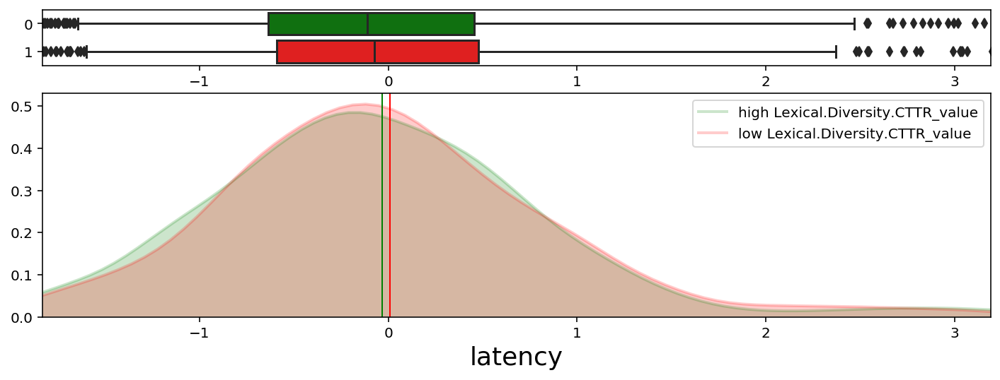

Sample size:  952    Mean diff:  0.0410    stds:  0.0438   p-value:  0.088212


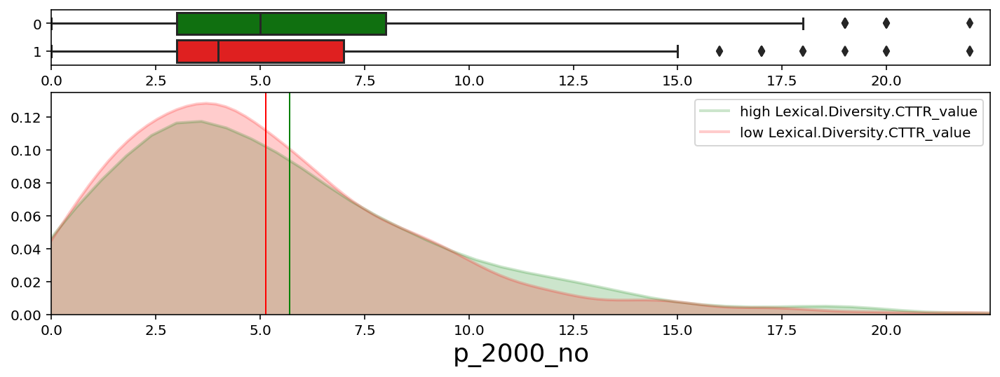

Sample size:  952    Mean diff:  0.5777    stds:  0.1329   p-value:  0.000021


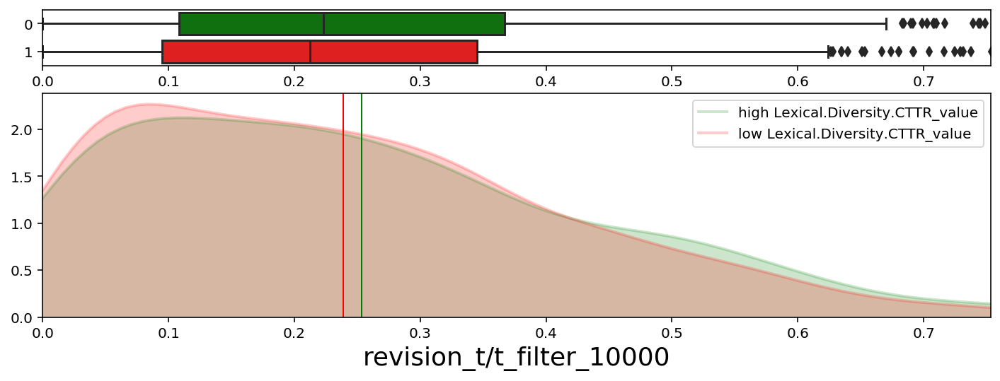

Sample size:  952    Mean diff:  0.0149    stds:  0.0836   p-value:  0.004936


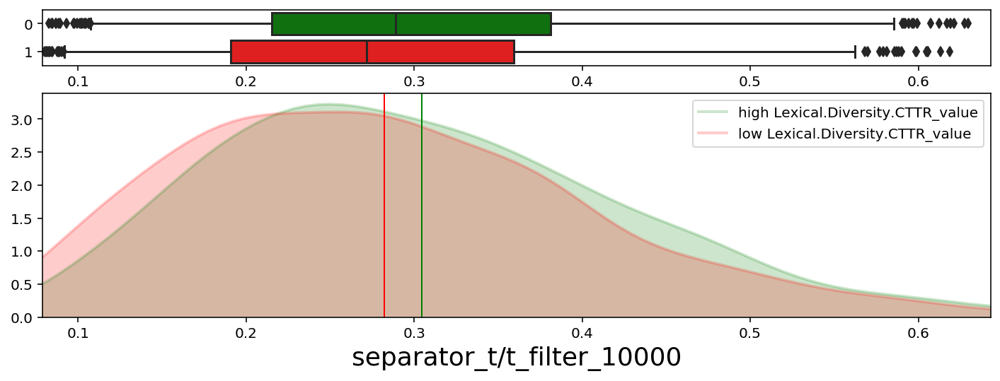

Sample size:  952    Mean diff:  0.0220    stds:  0.1802   p-value:  1.35316E-08


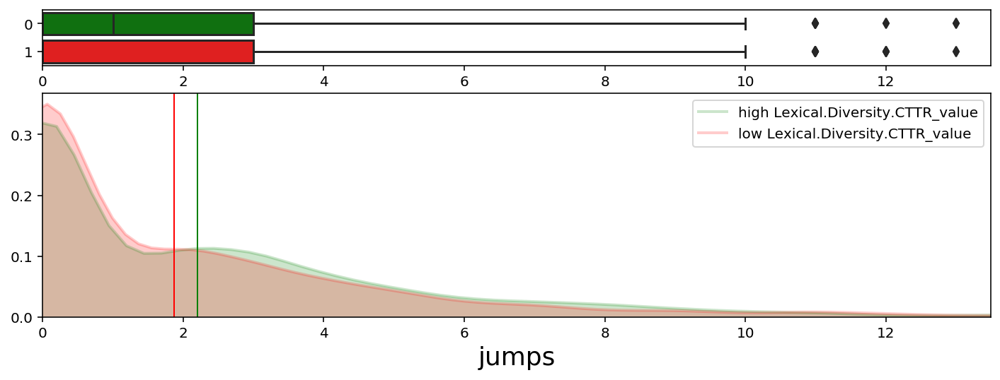

Sample size:  952    Mean diff:  0.3288    stds:  0.1102   p-value:  0.000338


KeyboardInterrupt: 

In [86]:
for m in other_metrics:
    plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, split_cr=m)
    

# Kolmogorov complexity analysis

memo: High Kolmogorov deflate = SIMPLE (because more easily compressed)

Kolmogorov deflate is an excellent predictor of just about any keystroke and linguistic complexity measure. Namely, High K. Deflate correlates (p < $10^{10}$) with:

1. High fluency
2. Low latency
3. Less deletions
4. Less jumps and chunks

--------------

5. Less sophisticated words
6. Less diversity
7. More clauses, verbs
8. Shorter words

In [ ]:
Whos better at predicting what? (everything statistically significant to several orders of magnitude)

note: they are both generally very good predictors (they are very correlated, so...), but sometimes one if much better than the other

   Syntactic K.   |    Morphological K.
__________________|_____________________
                  |
    fluency       |       latency
time, t/len, no_p |        jumps
   del_count      |    separator/word_t
  revision_t/t    |
__________________|_____________________
                  |
                  |   dependentClauses
                  |  pre/post mod words
                  |     Sophistication
                  |       Diversity
                  |

## Keystroke data relationships

### Primary

In [ ]:
plot_distr(['fluency', 'latency', 't/len_filter_10000'],
           by_user=True, by_length=True, split_cr='n_Kolmogorov')

### Secondary

In [ ]:
plot_distr(['del_count', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, split_cr='n_Kolmogorov')

## Other linguistic complexity measures

In [ ]:
plot_distr(['word_count', 'Lexical.Density_value', 'Syntactic.ClausesPerSentence_value', 'Lexical.Sophistication.ANC_value'],
           by_user=True, by_length=True, split_cr='n_Kolmogorov')

## Morphological & syntactic K.

In [ ]:
plot_distr(my_s_col,
           by_user=True, by_length=True, split_cr='n_SKolmogorov')

In [ ]:
plot_distr(my_s_col,
           by_user=True, by_length=True, split_cr='n_MKolmogorov')

# Fluency-latency & jumps-chunks differences

As expected,

high fluency = FAST typing = simple language =>

1. More dependent clauses
2. More verbs
3. Less pre/post modification words
4. Less sophistication
5. Less lexical diversity
6. Shorter words
7. More K. deflate
8. lower latency

Latency is kind of the same, except that for e.g. Sophistication metrics fluency is a much better predictor, and latency does not have impact on morphological complexity

## Fluency / latency

In [ ]:
plot_distr(['word_t/t_filter_10000', 'del_count', 'revision_t/t_filter_10000'],
           by_user=False, by_length=True, split_cr='fluency')

## Jumps / chunks

In [ ]:
def highJ(row):
    return row['jumps'] > 0
def lowJ(row):
    return row['jumps'] <= 0

In [ ]:
plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, cr1=highJ, cr2=lowJ)

In [ ]:
def highC(row):
    return row['chunks'] > 1
def lowC(row):
    return row['chunks'] <= 1

In [ ]:
plot_distr(['fluency', 'latency', 'p_2000_no', 'revision_t/t_filter_10000', 'separator_t/t_filter_10000', 'jumps', 'chunks'],
           by_user=True, by_length=True, cr1=highC, cr2=lowC)

# Writing to file

In [103]:
k.to_csv('../../pads/keystrokes.csv', index=False)
w.to_csv('../../pads/words.csv', index=False)
s.to_csv('../../pads/sentences.csv', index=False)
f.to_csv('../../pads/files.csv', index=False)
u.to_csv('../../pads/users.csv', index=False)

## I/O to file for cocogen

In [10]:
s = pd.read_csv('../../pads/sentences.csv', index_col=False)


In [ ]:
for idx, row in f.iterrows():
    file = open("../../frontend/files/" + row['path'].replace('/', "-") + "!" + str(idx) + "!" + str(row['s_id_s']) + "!" + str(row['s_id_e']) + ".txt", "w")
    file.write(row['text'])
    file.close()

In [35]:
text = s.groupby('path')['text'].apply(lambda x: ' '.join(x))
st_id = s.groupby('path')['id'].min()
end_id = s.groupby('path')['id'].max()

In [36]:
for i, (t, sid, eid) in enumerate(zip(text,st_id,end_id)):
    file = open("../../frontend/files/" + str(i) + "!" + str(sid) + "!" + str(eid) + ".txt", "w")
    file.write(t)
    file.close()    

In [ ]:
# I/O to file for cocogen


s = pd.read_csv('../../pads/old_sentences' + suffix + '.csv', index_col=False)


len(s[s['path'] == 'SS18/e69d4/10'])

for idx, row in s[s['path'] == 'SS18/e69d4/10'].iterrows():
    file = open("../../frontend/prova.txt", "a")
    file.write(row['text'])
    file.write("\n\n")
    file.close()

for idx, row in s.tail(1000).iterrows():
    file = open("../../frontend/tette2.txt", "a")
    file.write(row['text'])
    file.close()

for idx, row in s.iterrows():
    file = open("../../frontend/sentences/" + str(idx) + ".txt", "w")
    file.write(row['text'])
    file.close()

f.head(50)

for idx, row in s.head(1442).iterrows():
    file = open("../../frontend/tette_new_s.txt", "a")
    file.write(row['text'])
    file.close()

for idx, row in f.head(50).iterrows():
    file = open("../../frontend/tette_new.txt", "a")
    file.write(row['text'])
    file.close()

for idx, row in f.iterrows():
    file = open("../../frontend/files/" + row['path'].replace('/', "-") + "!" + str(idx) + "!" + str(row['s_id_s']) + "!" + str(row['s_id_e']) + ".txt", "w")
    file.write(row['text'])
    file.close()
    a

# User metrics analysis

## Defining new metrics and normalizing

In [3]:
for u_id, row in u.iterrows():
    u_s = s[s['u_id'] == u_id]
    u.at[u_id, 'jumps/s'] = u_s['jumps'].sum() / len(u_s)
    u.at[u_id, 'chunks/s'] = u_s['chunks'].sum() / len(u_s)
    u.at[u_id, 'latency/s'] = u_s['latency'].mean()
    u.at[u_id, 'fluency/s'] = u_s['fluency'].mean()

    u.at[u_id, 'n_SKolmogorov'] = u_s['n_SKolmogorov'].mean()
    u.at[u_id, 'n_MKolmogorov'] = u_s['n_MKolmogorov'].mean()
    u.at[u_id, 'M.MeanSyllablesPerWord'] = u_s['Morphological.MeanSyllablesPerWord_value'].mean()
    u.at[u_id, 'S.DependentC'] = u_s['Syntactic.DependentClausesPerSentence_value'].mean()
    u.at[u_id, 'L.Density'] = u_s['Lexical.Density_value'].mean()
    u.at[u_id, 'n_NDW_value'] = u_s['n_NDW_value'].mean()

    

In [4]:
valid_u = u[u['k_count'] > 10000]

In [5]:
k_ms = ['log_t_mean', 'p_510_no/len', 'p_2000_no/len', 'p_10000_no/len', 'latency/s', 'fluency/s',
        'revision_t/len_filter_10000_mean', 'del/len_mean',
        'jumps/s', 'chunks/s', 'separator_t/t_filter_10000_mean']

l_ms = ['text_len_mean', 'n_SKolmogorov', 'n_MKolmogorov', 'M.MeanSyllablesPerWord', 'S.DependentC', 'L.Density', 'n_NDW_value']



In [6]:

#u_mean = [u[col].mean() for col in u_ms]
#u_std = [u[col].mean() for col in u_ms]
#
#adj_ms = ['adj_' + ms for ms in u_ms]
#
#for ms, mean, std in zip(u_ms, u_mean, u_std):
#    u['adj_' + ms] = (u[ms] - mean) / std   

## Basic 3d plot of some of the metrics vs skill

In [7]:
from mpl_toolkits.mplot3d import Axes3D

In [55]:
def plot_3d(x_col, y_col, z_col, color_col=None, df=valid_u):
    global k, w, s, f, u, valid_u
    
    fig = plt.figure(figsize=(7,7))

    ax = fig.add_subplot(111, projection='3d')
    plt.figure(figsize=(2, 2))

    cm = plt.cm.get_cmap('RdYlBu')

    if color_col is None:
        sc = ax.scatter(df[x_col], df[y_col], df[z_col],
               s=6, cmap=cm)
    else:
        sc = ax.scatter(df[x_col], df[y_col], df[z_col],
                        c=df[color_col], vmin=df[color_col].quantile(0.05), vmax=df[color_col].quantile(0.95),
                        s=6, cmap=cm)
        #fig.colorbar(sc)


    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_zlabel(z_col)

    return fig, ax


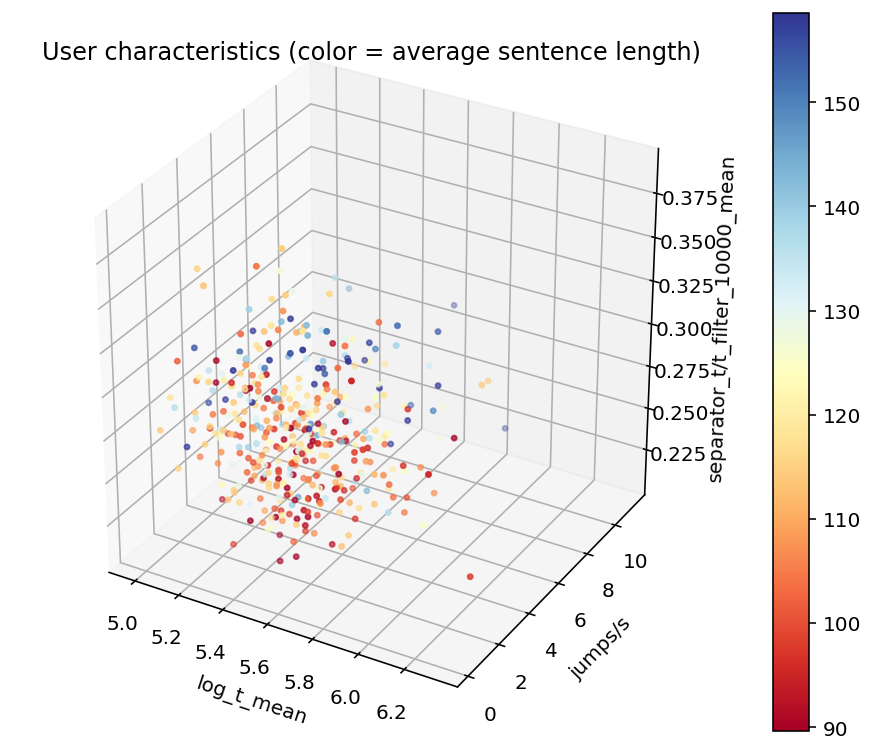

<Figure size 144x144 with 0 Axes>

In [43]:
fig, ax = plot_3d('log_t_mean', 'jumps/s', 'separator_t/t_filter_10000_mean', color_col='text_len_mean')
ax.set_title('User characteristics (color = average sentence length)')
plt.savefig('user_characteristics_by_skill')
plt.show()

## Clustering alg

### Kmeans

In [45]:
X = valid_u[k_ms]
X.head(2)

,log_t_mean,p_510_no/len,p_2000_no/len,p_10000_no/len,latency/s,fluency/s,revision_t/len_filter_10000_mean,del/len_mean,jumps/s,chunks/s,separator_t/t_filter_10000_mean
0,5.390676,0.114380,0.037664,0.009656,-0.270544,-0.021152,120.166036,0.079018,1.728767,1.783562,0.260885
1,5.771663,0.254068,0.085123,0.028266,0.518786,0.016649,375.182427,0.199563,4.530726,2.597765,0.239287


In [46]:
from sklearn.preprocessing import StandardScaler

X = StandardScaler().fit_transform(X)


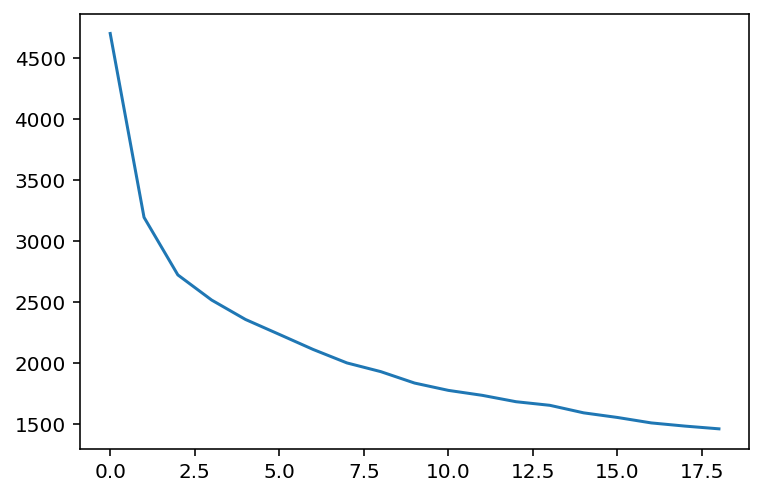

In [47]:
from sklearn.cluster import KMeans

sc = []

for n_c in range(1, 20):
    k_means = KMeans(n_clusters=n_c)
    k_means.fit(X)
    sc.append((-1)* k_means.score(X))
    
plt.plot(sc)

In [48]:
k_means = KMeans(n_clusters=4, random_state=13)
k_means.fit(X)
valid_u.loc[:, 'kmeans_label'] = k_means.labels_

/Applications/miniconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [49]:
for idx, row in valid_u.iterrows():
    u.at[idx, 'kmeans_label'] = row['kmeans_label']

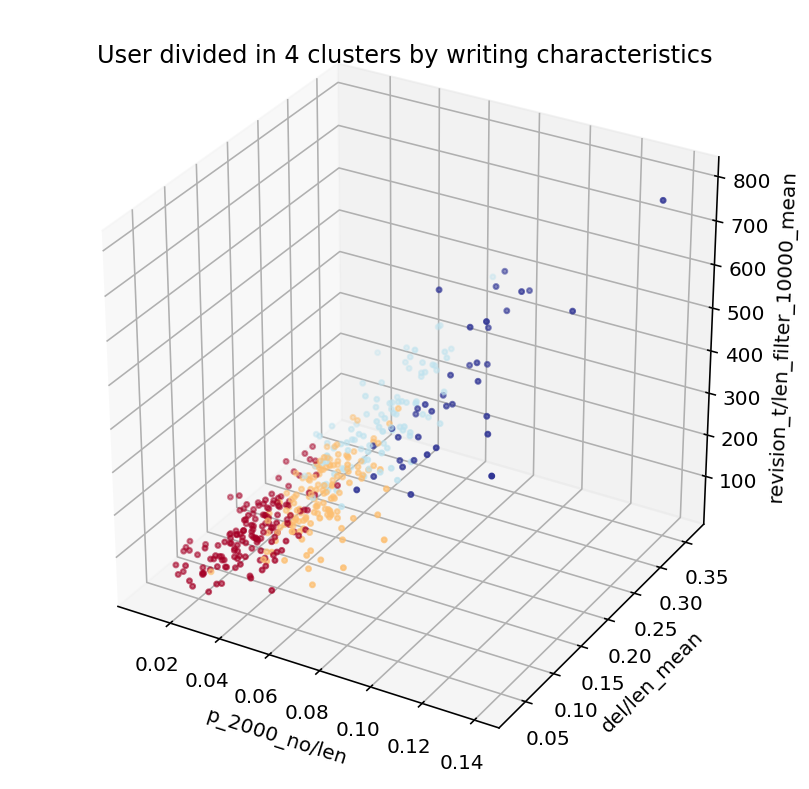

<Figure size 144x144 with 0 Axes>

In [57]:
fig, ax = plot_3d('p_2000_no/len', 'del/len_mean', 'revision_t/len_filter_10000_mean', color_col='kmeans_label')
ax.set_title('User divided in 4 clusters by writing characteristics')
plt.savefig('user_clusters')
plt.show()

### Other

In [25]:
from sklearn.cluster import MeanShift

In [26]:
m_shift = MeanShift().fit(X)
m_shift.cluster_centers_

array([[-0.16712163, -0.28691308, -0.28889514, -0.25060971, -0.08162533,
        -0.02155161, -0.33013111, -0.26049777, -0.31631551, -0.28880665,
        -0.02709041],
       [ 3.94127651,  5.68105628,  2.7590458 ,  1.16824035,  0.09454198,
        -0.36304761,  1.70602602,  0.80002831, -0.46337594, -1.03226684,
        -1.50348793],
       [ 2.56964081,  1.15919812,  3.87380138,  5.7722606 , -0.84838091,
        -0.22267835,  1.75913794, -0.67315997,  1.52147774,  0.84775421,
        -0.12590911],
       [ 2.38452747,  1.05755057,  2.33353786,  3.87597105,  2.98303963,
         2.27063625,  1.45236071, -0.02567785,  3.06403714,  0.19152125,
         0.19919676],
       [ 1.88652421,  2.83710254,  4.58668477,  4.12166981,  0.54651145,
         1.70635944,  5.22011174,  3.15377353,  5.16768291,  2.65653159,
        -1.57977087],
       [ 1.88455266,  1.30786506,  2.10909671,  1.164722  ,  1.2448973 ,
        -0.29226956,  3.08645727,  1.2405511 ,  4.35928707,  4.90391055,
        -0.350

In [28]:
valid_u.loc[:, 'mshift_label'] = m_shift.labels_

/Applications/miniconda3/lib/python3.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/Applications/miniconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


## Difference in linguistical metrics?

In [30]:
for m in l_ms:
    print("{:>35}".format(m), end='   ')
    for l in range(0, 4):
        sub = valid_u[valid_u['kmeans_label'] == l]
        print("{:>6.3f}".format(sub[m].mean()), end=' ')
    print(' -- ssd: ', "{:>6.3f}".format(valid_u[m].std() / np.sqrt(len(valid_u) / 4) * 2))

                      text_len_mean   119.603 110.462 122.831 125.905  -- ssd:   4.225
                      n_SKolmogorov    0.014 -0.018  0.020  0.017  -- ssd:   0.022
                      n_MKolmogorov    0.025 -0.027  0.029  0.004  -- ssd:   0.028
             M.MeanSyllablesPerWord    1.618  1.610  1.607  1.630  -- ssd:   0.011
                       S.DependentC    0.723  0.682  0.776  0.714  -- ssd:   0.047
                          L.Density    0.529  0.525  0.525  0.530  -- ssd:   0.004
                        n_NDW_value    0.001  0.015  0.067 -0.005  -- ssd:   0.045


In [31]:
def label1(row):
    return row['kmeans_label'] == 1
def label2(row):
    return row['kmeans_label'] == 2

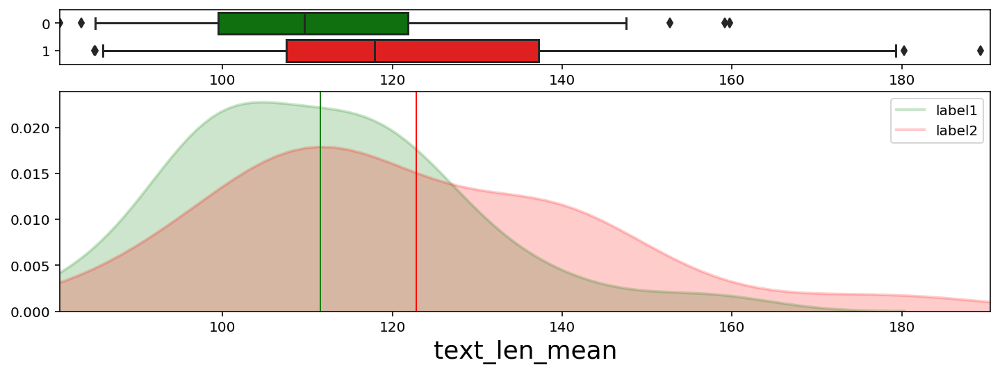

Sample size:  98    Mean diff:  11.3041    stds:  0.5542   p-value:  2.05022E-08


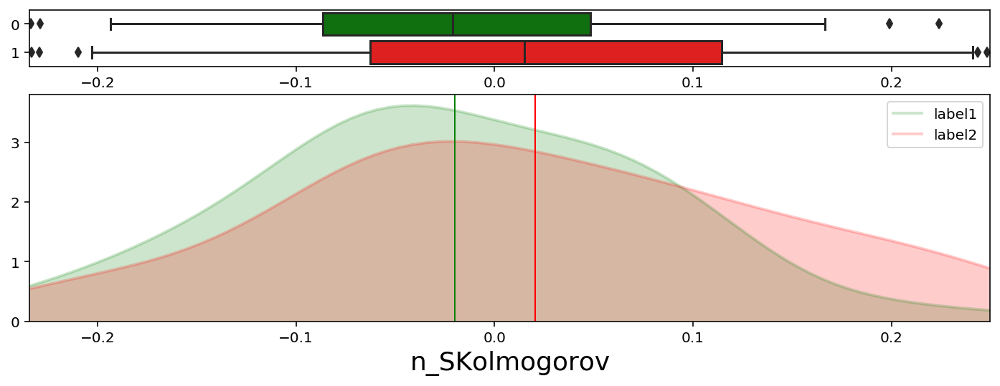

Sample size:  98    Mean diff:  0.0403    stds:  0.3579   p-value:  0.000198


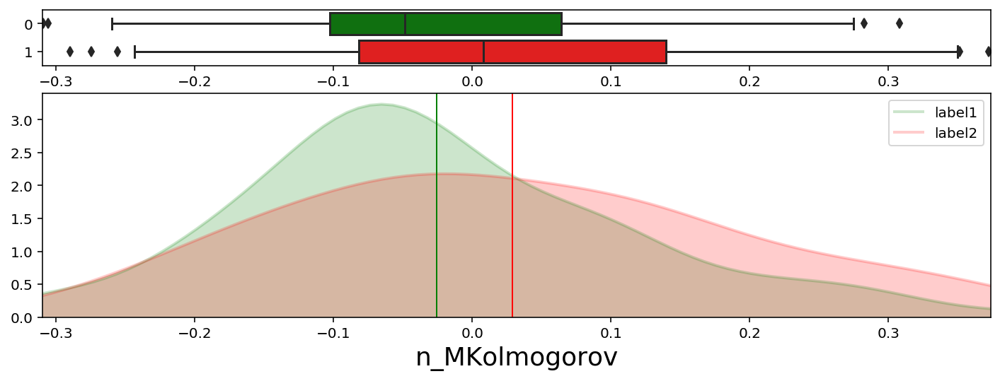

Sample size:  98    Mean diff:  0.0543    stds:  0.3590   p-value:  0.000190


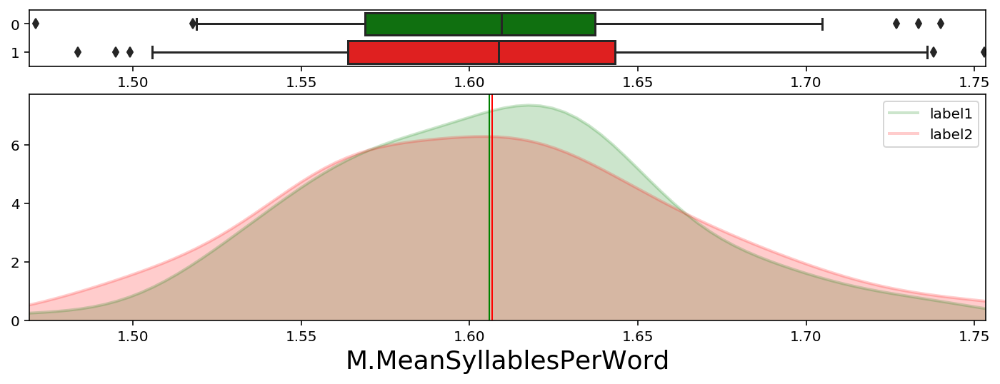

Sample size:  98    Mean diff:  0.0008    stds:  0.0149   p-value:  0.441257


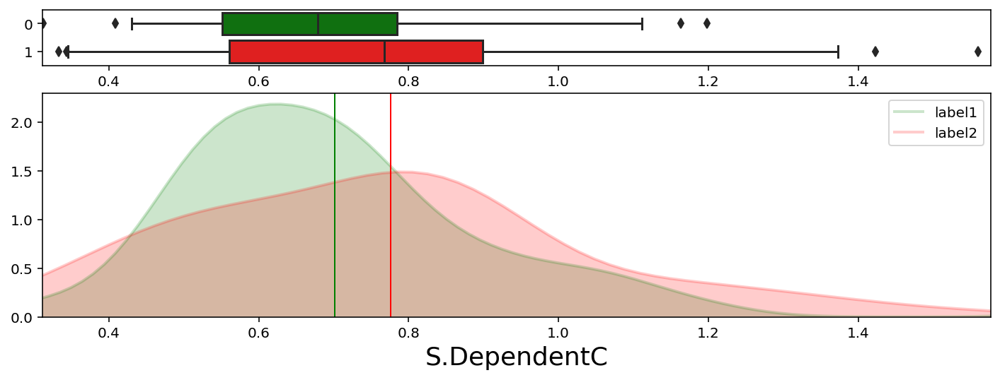

Sample size:  98    Mean diff:  0.0744    stds:  0.2914   p-value:  0.001960


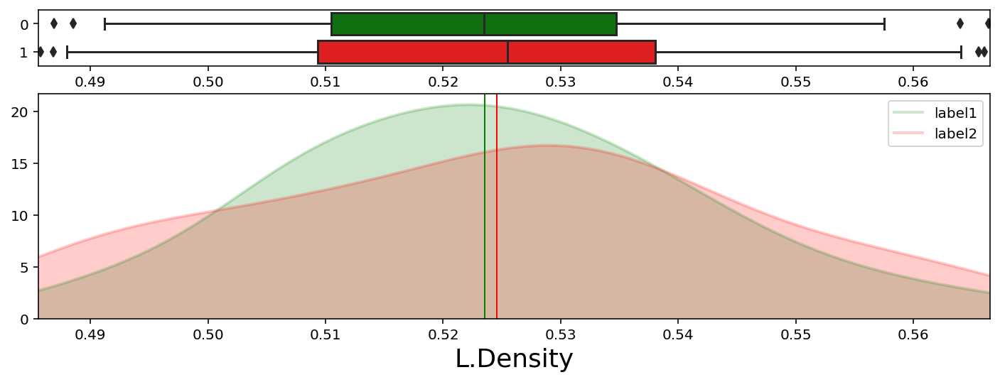

Sample size:  98    Mean diff:  0.0010    stds:  0.0489   p-value:  0.314082


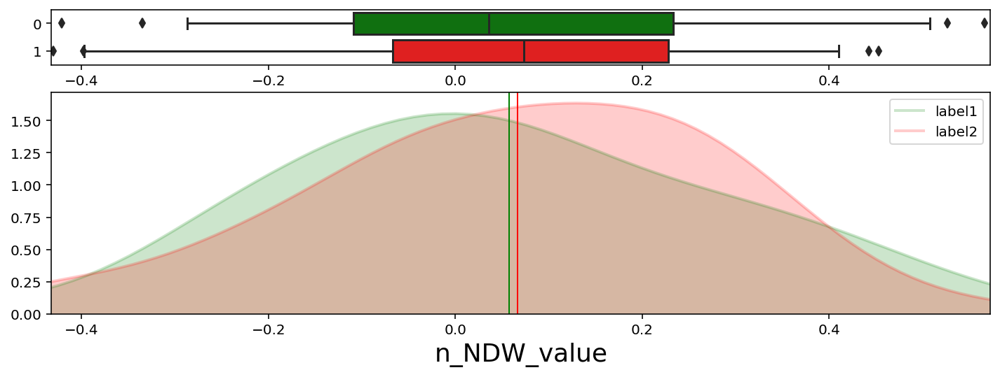

Sample size:  98    Mean diff:  0.0092    stds:  0.0401   p-value:  0.345681


[]

In [32]:
plot_distr(l_ms, cr1=label1, cr2=label2, by_user=False, by_length=False, tol=1, df=valid_u)

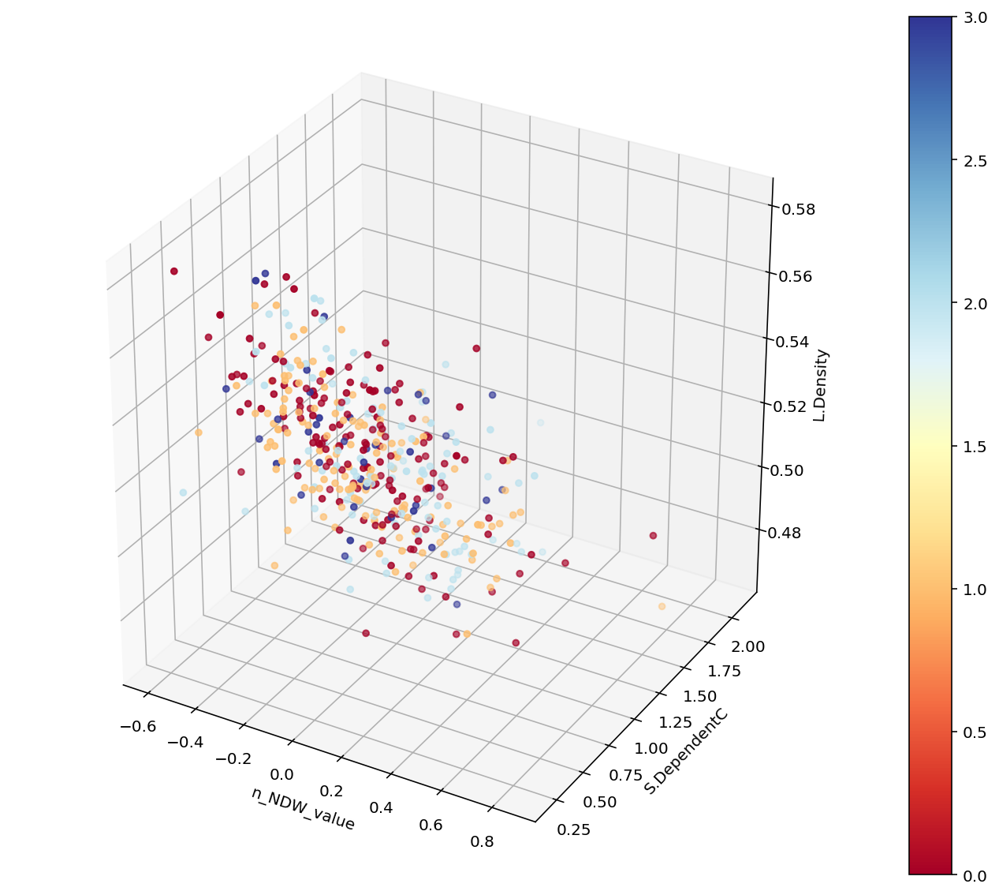

<Figure size 144x144 with 0 Axes>

In [33]:
plot_3d('n_NDW_value', 'S.DependentC', 'L.Density', color_col='kmeans_label')

# Heat map with correlation coefficients

In [ ]:
ks_ms = ['latency', 'fluency', 't_filter_2000', 't_filter_10000', 
         'p_510_no', 'p_2000_no', 'p_10000_no', 
         'jumps', 'chunks', 'revision_t/t_filter_10000', 'revision_t/len_filter_10000',
         'separator_t/t_filter_10000', 'word_t/t_filter_10000']

ls_ms = ['Syntactic.ClausesPerSentence_value', 'Syntactic.DependentClausesPerSentence_value', 'Syntactic.CoordinatePhrasesPerSentence_value', 'n_SKolmogorov',
         'Lexical.Sophistication.BNC_value', 'Lexical.Sophistication.ANC_value', 'Lexical.Sophistication.NGSL_value','n_MKolmogorov', 
         'Lexical.Density_value', 'n_NDW_value', 'n_RTTR_value',
         'n_Kolmogorov', ]


In [ ]:
heat_map = []
log_map = []
log_log_map = []
for l_m in ls_ms:
    l = plot_distr(ks_ms, split_cr=l_m, pct=0.2, \
               by_user=True, by_length=True, tol=1, p_only=True)
    heat_map.append(l)
    log_map.append([(-1) * np.log(v) for v in l])
    log_log_map.append([ np.log((-1) * np.log(v)) for v in l])
    

In [ ]:
def norm(a):
    n_rows, n_cols = a.shape
    for i in range(0, n_rows):
        cm = a[i].mean()
        for j in range(0, n_cols):
            rm = 0
            for k in range(0, n_rows):
                rm += a[k][j] / n_cols
            a[i][j] -= (rm + cm) / 2
    return a

In [ ]:
ks_ms_lb = ['latency', 'fluency', 't_filter_2000', 't_filter_10000', 
         'p_510_no', 'p_2000_no', 'p_10000_no', 
         'jumps', 'chunks', 'revision_t/t', 'revision_t/len',
         'separator_t/t', 'word_t/t']

In [ ]:
sns.heatmap(norm(np.array(log_log_map)), linewidths=.5,
            xticklabels=ks_ms_lb, yticklabels=ls_ms)


# Measuring effectiveness of keystroke metrics sets


In [8]:
def train_eval(models,
               features=[(s[['text_len']], 'text len')], 
               targets=[(s['Syntactic.ClausesPerSentence_value'], 'clauses per sentence')],
               verbose=1):
    
    if not isinstance(models, list):
        models = [models]
    
    avg_r2 = [0 for _ in range(0, len(features))]
    for y, t_desc in targets:
        if verbose > 0:
            print ("\n    Targets: " + t_desc + "\n")
        for i, (X, f_desc) in enumerate(features):
            if verbose > 0:
                print ("Features: " + "{:<45}".format(f_desc), end='')

            ts = time.time(); accuracies = []
            X_tr, X_ts, y_tr, y_ts = model_selection.train_test_split(X, y, test_size=0.2, random_state=1)
            
            for m_d in models:
                if 'desc' not in m_d:
                    m_d['desc'] = 'unknown m '
                for kw in 'bfp':
                    if kw+'_args' not in m_d:
                        m_d[kw+'_args'] = {}
                
                if isinstance(m_d['m'], base.BaseEstimator):
                    m = m_d['m']
                else:
                    # Model has to be built
                    m = m_d['m'](input_s=X_tr.shape[1], **m_d['b_args'])
                
                ts = time.time()
                m.fit(X_tr, y_tr, **m_d['f_args'])
                if verbose > 0:
                    print ("        M: " + m_d['desc'] + " # ", end='')
                y_pred = m.predict(X_ts, **m_d['p_args'])
                y_tr_pred = m.predict(X_tr, **m_d['p_args'])
                #print ("P:",  y_pred, end='')
                adj_R2 = 1 - (1 - metrics.r2_score(y_ts, y_pred)) * (X.shape[0]-1) / (X.shape[0]-X.shape[1]-1)
                avg_r2[i] += metrics.r2_score(y_ts, y_pred)
                
                if verbose == 1:
                    print ('adj test R2: ' + "{0:.2f}".format(100 * adj_R2), end='%\n' )
                if verbose == 2:
                    print (" test R2: " + "{0:.2f}".format(100 * metrics.r2_score(y_ts, y_pred)), end='%' )
                    print (" - tr R2: " + "{0:.2f}".format(100 * metrics.r2_score(y_tr, y_tr_pred)), end='%' )
                    print (" T: " + "{0:.1f}".format(time.time() - ts) + "s")
            
    if verbose == 0:
        for i, (X, f_desc) in enumerate(features):
            print ("Features: " + "{:<45}".format(f_desc), end='')
            print (" Avg R2 : " + "{0:.2f}".format(100 * avg_r2[i] / len(targets)), end='%\n')
 

## Basic examples

In [102]:
train_eval([{'m': ensemble.HistGradientBoostingRegressor(max_iter=200, learning_rate=0.15, l2_regularization=40000), 'desc': "histGB reg"}],
          features=[
                    (s[['t/len_filter_10000']], 't/len filter 10000'),
                    (s[['fluency', 'latency']], 'fluency + latency'),
                    (s[['revision_t/len_filter_10000', 'k/len']], 'revision_t/len_filter_10000'),
                    (s[['word_t/t_filter_10000', 'separator_t/t_filter_10000']], 'word_t/t_filter_10000'),

                    (s[['max_pos_pct'] + ['n_' + str(i) + '_fraction' for i in range(0,10)]], 'positional information only'),
                    (s[['t/len_filter_10000', 'revision_t/len_filter_10000',
                        'word_t/t_filter_10000', 'k/len'] + ['max_pos_pct'] + ['n_' + str(i) + '_fraction' for i in range(0,10)]], 'all of above, length filtered'),
              
                    (s[['jumps', 'chunks']], 'jumps and chunks'),
              
                    (s[['text_len']], 'length only'),
                    (s[list(s.columns[37:])], 'all keystr metrics'),
              
                    (pd.DataFrame(np.random.normal(0,100,size=(len(s), 5))), 'random noise')],
          
           targets=[(s[name], name) for name in list(s.columns[8:31])],
           verbose=0)

Features: t/len filter 10000                            Avg R2 : 0.52%
Features: fluency + latency                             Avg R2 : 1.41%
Features: revision_t/len_filter_10000                   Avg R2 : 4.19%
Features: word_t/t_filter_10000                         Avg R2 : 4.72%
Features: positional information only                   Avg R2 : 0.36%
Features: all of above, length filtered                 Avg R2 : 6.77%
Features: jumps and chunks                              Avg R2 : 3.24%
Features: length only                                   Avg R2 : 32.06%
Features: all keystr metrics                            Avg R2 : 43.98%
Features: random noise                                  Avg R2 : -0.11%


In [68]:
train_eval([{'m': ensemble.HistGradientBoostingRegressor(max_iter=500, learning_rate=0.15, l2_regularization=10000), 'desc': "histGB reg"}],
          features=[(s[['text_len']], 'length only'),
                    (s[['t/len_filter_10000', 'max_pos_pct', 'revision_t/len_filter_10000',
                        'word_t/t_filter_10000', 'k/len']], 'misc keystroke metrics, length filtered'),
                    (s[['fluency', 'latency']], 'fluency + latency'),
                    (s[['max_pos_pct'] + ['n_' + str(i) + '_fraction' for i in range(0,10)]], 'positional information only'),
                    (s[[
                       't_filter_10000', 'p_510_no', 'p_1000_no',
                       'p_2000_no', 'p_5000_no', 'p_10000_no', 'max_t', 'max_pos', 'max_pos_pct',
                       't/len_filter_10000', 'fluency', 'latency', 't_first_2', 't_first_5', 't_first_20',
                       't/len_0_fraction', 't/len_1_fraction', 't/len_2_fraction',
                       't/len_3_fraction', 't/len_4_fraction', 't/len_5_fraction',
                       't/len_6_fraction', 't/len_7_fraction', 't/len_8_fraction',
                       't/len_9_fraction', 'del_t_filter_10000', 'del_t/t_filter_10000', 'jumps', 'chunks',
                       'revision_t/t_filter_10000', 'revision_t/len_filter_10000',
                       'word_t/t_filter_10000', 'separator_t/t_filter_10000']], 'keystr metrics'),
                    (pd.DataFrame(np.random.normal(0,100,size=(len(s), 5))), 'random noise')],
          
           targets=[(s['Syntactic.ClausesPerSentence_value'], 'no of clauses'),
                    (s['Syntactic.ComplexNominalsPerSentence_value'], 'no of complex nominals'),
                    (s['Lexical.Sophistication.BNC_value'], 'sophistication BNC'),
                    (s['Lexical.Density_value'], 'density'),
                    (s['Lexical.Diversity.CNDW_value'], 'diversity'),
                    (s['KolmogorovDeflate_value'], 'non-corrected deflate'),
                    (s['n_Kolmogorov'], 'corrected deflate')])

    Targets: no of clauses

Features: length only                                          M: histGB reg # adj test R2: 36.87%
Features: misc keystroke metrics, length filtered              M: histGB reg # adj test R2: 7.69%
Features: fluency + latency                                    M: histGB reg # adj test R2: 1.07%
Features: positional information only                          M: histGB reg # adj test R2: -0.37%
Features: keystr metrics                                       M: histGB reg # adj test R2: 37.15%
Features: random noise                                         M: histGB reg # adj test R2: -0.67%


    Targets: no of complex nominals

Features: length only                                          M: histGB reg # adj test R2: 59.85%
Features: misc keystroke metrics, length filtered              M: histGB reg # adj test R2: 10.07%
Features: fluency + latency                                    M: histGB reg # adj test R2: 2.18%
Features: positional information only        

# Are linguistic metrics local in nature?

In [64]:
train_eval([{'m': ensemble.HistGradientBoostingRegressor(max_iter=50, learning_rate=0.15, l2_regularization=40000), 'desc': "histGB reg"}],
          features=[
                    (s[['Syntactic.DependentClausesPerSentence_value']], 'Syntactic.DependentClausesPerSentence_value'),
                    (s[['KolmogorovDeflate_value']], 'n_Kolmogorov'),
                    (s[['Lexical.Density_value']], 'Lexical.Density_value'),

                    (s[list(s.columns[8:31])], 'all lingusitic metrics'),
              
                    (pd.DataFrame(np.random.normal(0,100,size=(len(s), 5))), 'random noise')],
          
           targets=[(s[name], name) for name in ['fluency', 'latency']],
           verbose=0)

Features: Syntactic.DependentClausesPerSentence_value   Avg R2 : 0.04%
Features: n_Kolmogorov                                  Avg R2 : 0.13%
Features: Lexical.Density_value                         Avg R2 : 0.02%
Features: all lingusitic metrics                        Avg R2 : 0.22%
Features: random noise                                  Avg R2 : -0.03%


## Basic statistical analysis

In [3]:
s['my'] = (s['Morphological.MeanLengthWord_value'] - s['Morphological.MeanLengthWord_value'].mean()) / s['Morphological.MeanLengthWord_value'].std()

In [19]:
(np.random.normal(size=10000) - np.random.normal(size=10000)).std()

1.4112152327191685

In [5]:
# The fact that this is lower than random (sqrt(2), as above)
#  proves that complexity is local in nature
(s['my'] - s.shift(1)['my']).std()

1.2679930421575336

In [13]:
l = [np.nan, np.nan]
for w in range(1, 100):
    l.append((s['my'] - s.shift(w)['my']).std())

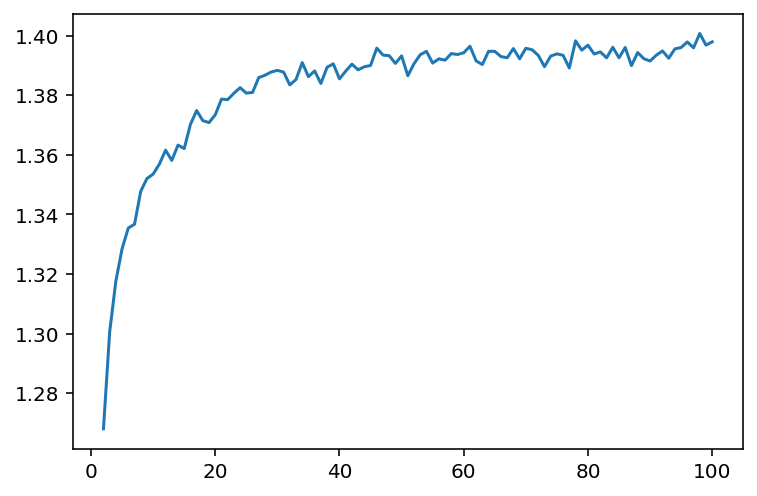

In [14]:
plt.plot(l)

## Model predictor

In [60]:
m = 'Morphological.MeanLengthWord_value'
windows = sorted([n * (10**m) for n in [1, 2, 3, 4, 6, 8] for m in [0, 1, 2, 3]][1:])

for ws in windows:
    s[m + str(ws)] = 0
    for w in range(1, ws):
        s[m + str(ws)] += s[m].shift(w)
    s[m + str(ws)] /= ws - 1
    s[m + str(ws)].fillna(s[m + str(ws)].mean(), inplace=True)

In [62]:

train_eval([{'m': ensemble.HistGradientBoostingRegressor(max_iter=50, learning_rate=0.15, l2_regularization=40000), 'desc': "histGB reg"}],
          features=[
                    (s[[m]], m)] +\
                  [(s[[m, m+str(n)]], m + str(n)) for n in windows],
           targets=[(s[name], name) for name in ['t_filter_10000']],
           verbose=0)

Features: Morphological.MeanLengthWord_value            Avg R2 : 1.79%
Features: Morphological.MeanLengthWord_value2           Avg R2 : 1.80%
Features: Morphological.MeanLengthWord_value3           Avg R2 : 1.83%
Features: Morphological.MeanLengthWord_value4           Avg R2 : 1.80%
Features: Morphological.MeanLengthWord_value6           Avg R2 : 1.83%
Features: Morphological.MeanLengthWord_value8           Avg R2 : 1.79%
Features: Morphological.MeanLengthWord_value10          Avg R2 : 1.75%
Features: Morphological.MeanLengthWord_value20          Avg R2 : 1.77%
Features: Morphological.MeanLengthWord_value30          Avg R2 : 1.76%
Features: Morphological.MeanLengthWord_value40          Avg R2 : 1.79%
Features: Morphological.MeanLengthWord_value60          Avg R2 : 1.81%
Features: Morphological.MeanLengthWord_value80          Avg R2 : 1.83%
Features: Morphological.MeanLengthWord_value100         Avg R2 : 1.86%
Features: Morphological.MeanLengthWord_value200         Avg R2 : 2.01%
Featur

# Automatically extracting features from raw ks data

In [3]:
# Runs in approx. 50s
k_sorted = k.sort_values(by='s_id')
rs = 0; re = 0; ranges = {}
for idx, val in k_sorted['s_id'].value_counts().sort_index().iteritems():
    re += val
    ranges[idx] = (rs, re)
    rs += val

In [4]:


## Runs in 40s
ft = []

for s_id, row in s.iterrows():
    if ranges.get(s_id) != None:
        t, v = ranges.get(s_id)
        k_sentence = k_sorted.iloc[t:v, :]
    else:
        k_sentence = k_sorted.iloc[0:0, :]
        
    ks_list = np.zeros(500)
    if len(k_sentence) > 500:
        k_sentence = k_sentence.sample(n=500).sort_index()
    ks_list[:int(len(k_sentence))] = k_sentence['adj_log_t'].values
    ft.append(ks_list)

In [5]:
adj_log_t_sequences = np.array(ft)
n_Kolm = s['n_Kolmogorov'].values

In [6]:
adj_log_t_sequences.shape

(95354, 500)

## Base models

In [26]:
time_par = 3   # 1 = 40s a modello, 5min in totale

nonNN_models = [{'m': linear_model.LinearRegression(), 'desc': "LinearReg."},
                {'m': ensemble.RandomForestRegressor(n_estimators=10*time_par), 'desc': "RForest   "},
                {'m': ensemble.GradientBoostingRegressor(n_estimators=30*time_par), 'desc': "GrBoostR  "},
                {'m': ensemble.HistGradientBoostingRegressor(max_iter=200*time_par), 'desc':  "HistBoostR"},
                {'m': neural_network.MLPRegressor(hidden_layer_sizes=(170, 170,), activation='relu', max_iter=4*time_par), 'desc': "2-layer NN"},
                {'m': neural_network.MLPRegressor(hidden_layer_sizes=(60, 60, 60, 60, 60,), activation='relu', max_iter=6*time_par), 'desc': "5-layer NN"},
              ]

train_eval(nonNN_models)

Features: adj_log_t for sequences 40 <= len <= 200

    Targets: n_Kolmogorov
        M: LinearReg. #  test MSE: 0.98 - tr MSE: 1.00 T: 0.9s
        M: RForest    #  test MSE: 0.98 - tr MSE: 0.98 T: 129.7s
        M: GrBoostR   #  test MSE: 0.98 - tr MSE: 1.00 T: 50.6s
        M: HistBoostR #  test MSE: 0.98 - tr MSE: 0.98 T: 42.9s


/Applications/miniconda3/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (12) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


        M: 2-layer NN #  test MSE: 0.99 - tr MSE: 0.98 T: 16.0s


/Applications/miniconda3/lib/python3.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (18) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


        M: 5-layer NN #  test MSE: 0.99 - tr MSE: 0.98 T: 16.2s


ValueError: Unknown label type: 'continuous'

In [28]:
train_eval({'m': neural_network.MLPRegressor(hidden_layer_sizes=(100, 100, 100, 100, 100,), 
                                             activation='tanh', max_iter=100), 'desc': "5-layer NN"})


Features: adj_log_t for sequences 40 <= len <= 200

    Targets: n_Kolmogorov
        M: 5-layer NN #  test MSE: 0.99 - tr MSE: 0.98 T: 69.6s


In [ ]:
def seq_model(input_s, layers_no=4, layers_s=256, 
              activation='tanh', optimizer=keras.optimizers.Nadam(), dropout=False, **kwargs):
    model = Sequential()
    # Dense(64) is a fully-connected layer with 64 hidden units.
    # in the first layer, you must specify the expected input data shape:
    # here, 20-dimensional vectors.
    model.add(Dense(layers_s, activation=activation, input_dim=input_s, **kwargs))
    for _ in range(0, layers_no-1):
        if dropout:
            model.add(Dropout(0.5))
        model.add(Dense(layers_s, activation=activation, **kwargs))

    model.add(Dense(1, activation='relu', **kwargs))
    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_absolute_error'])
    return model


## PCA

In [49]:
my_pca = decomposition.PCA(n_components=20)
my_pca.fit(adj_log_t_sequences)

PCA(copy=True, iterated_power='auto', n_components=20, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [50]:
my_pca.explained_variance_ratio_

array([0.01696943, 0.01341847, 0.01272916, 0.01221371, 0.01156867,
       0.01135204, 0.01087549, 0.01078527, 0.01037915, 0.01030156,
       0.00979645, 0.00972752, 0.0095573 , 0.00940092, 0.00916156,
       0.00898081, 0.00880001, 0.00878222, 0.00863381, 0.00847159])